In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import os
from Pipelines import *

matplotlib.rcParams['font.family'] = 'Arial'
plt.style.use('seaborn-v0_8-talk')

## Build Merged Annotated Data For DownStreamAnalysis

In [71]:
base_dir = "/project/cfRNA_Disentaglement/Data/RPM/Processed"
var = pd.read_table("./Data/GECODEv49_Annot.tsv", index_col=0)
palangodb = pd.read_table("./Data/PalangoDB_CellTypeMarkers.tsv")
obs = pd.read_csv("./Data/RPM/Processed/Meta.csv", index_col=0)

cohorts = obs['Seq_ID'].unique()
print(f"Detected Cohorts: {cohorts}")

def load_and_concat_cohorts(base_dir, suffix, obs_index, var_index=None):
    df_list = []
    for cohort in cohorts:
        filename = f"Norm_{cohort}_{suffix}.csv"
        file_path = os.path.join(base_dir, filename)
        if os.path.exists(file_path):
            df = pd.read_csv(file_path, index_col=0).T
            df_list.append(df)
        else:
            print(f"  [Warning] Missing file for {cohort}: {filename}")
    if not df_list:
        raise FileNotFoundError(f"No files found for suffix: {suffix}")

    full_df = pd.concat(df_list, axis=0)
    if var_index is not None:
        full_df = full_df.reindex(index=obs_index, columns=var_index).fillna(0)
    else:
        full_df = full_df.reindex(index=obs_index).fillna(0)
        
    return full_df

print("\nProcessing Raw Counts to initialize AnnData...")
try:
    df_raw = load_and_concat_cohorts(base_dir, "Raw", obs.index, var.index if var is not None else None)
    if var is None:
        var = pd.DataFrame(index=df_raw.columns)
    adata = sc.AnnData(X=df_raw.values.astype(np.float32), obs=obs, var=var)
    adata.layers['counts'] = adata.X.copy() # Raw counts 저장
    print(f"AnnData Initialized: {adata.shape}")

except Exception as e:
    print(f"Critical Error initializing AnnData: {e}")
    exit(1)
    
norm_layers = {
    "log_TMM": "TMM_log2",
    "log_TPM": "TPM_log2",
    "log_FPKM": "FPKM_log2",
    "EDA_Full": "EDA_Full_All", 
    "EDA+RUVg_k1": "Proposed_Full_k1",
    "EDA+RUVg_k2": "Proposed_Full_k2",
    "EDA+RUVg_k3": "Proposed_Full_k3",
    "RUVg_k1": "RUVg_Platelet_k1",
    "RUVg_k2": "RUVg_Platelet_k2",
    "RUVg_k3": "RUVg_Platelet_k3",
}

for layer_name, file_suffix in norm_layers.items():
    print(f"Processing Layer: {layer_name} (Suffix: {file_suffix})...")
    try:
        df_norm = load_and_concat_cohorts(base_dir, file_suffix, adata.obs_names, adata.var_names)
        print(df_norm.shape)
        # AnnData 레이어에 할당
        adata.layers[layer_name] = df_norm.values.astype(np.float32)
        print(f"  -> Added {layer_name}")
        
    except Exception as e:
        print(f"  [Error] Failed to add {layer_name}: {e}")

print("\nFinalizing...")

for col in adata.obs.columns:
    if adata.obs[col].dtype == 'object':
        adata.obs[col] = adata.obs[col].astype(str)
        
        
temp = sc.AnnData(X=adata.layers['counts'].copy())
sc.pp.normalize_total(temp, target_sum=1e6)
sc.pp.log1p(temp)
adata.layers['Standard_LogCPM'] = temp.X
print("Baseline created.")

platelet_sigs = palangodb[palangodb['cell type'] == 'Platelets']
adata.var['is_platelet'] = False
print("Platelet Signature Annotated.")

adata.var.loc[adata.var['GeneName'].isin(platelet_sigs['official gene symbol']), 'is_platelet'] = True
adata.var['log10_Length'] = np.log10(adata.var['Length'])

Detected Cohorts: ['RPMseq10' 'RPMseq14' 'RPMseq12' 'RPMseq13' 'RPMseq16' 'RPMseq15']

Processing Raw Counts to initialize AnnData...
AnnData Initialized: (342, 78691)
Processing Layer: log_TMM (Suffix: TMM_log2)...
(342, 78691)
  -> Added log_TMM
Processing Layer: log_TPM (Suffix: TPM_log2)...
(342, 78691)
  -> Added log_TPM
Processing Layer: log_FPKM (Suffix: FPKM_log2)...
(342, 78691)
  -> Added log_FPKM
Processing Layer: EDA_Full (Suffix: EDA_Full_All)...
(342, 78691)
  -> Added EDA_Full
Processing Layer: EDA+RUVg_k1 (Suffix: Proposed_Full_k1)...
(342, 78691)
  -> Added EDA+RUVg_k1
Processing Layer: EDA+RUVg_k2 (Suffix: Proposed_Full_k2)...
(342, 78691)
  -> Added EDA+RUVg_k2
Processing Layer: EDA+RUVg_k3 (Suffix: Proposed_Full_k3)...
(342, 78691)
  -> Added EDA+RUVg_k3
Processing Layer: RUVg_k1 (Suffix: RUVg_Platelet_k1)...
(342, 78691)
  -> Added RUVg_k1
Processing Layer: RUVg_k2 (Suffix: RUVg_Platelet_k2)...
(342, 78691)
  -> Added RUVg_k2
Processing Layer: RUVg_k3 (Suffix: RUVg

In [72]:
adata.write_h5ad("./Data/RPM/Processed/Merged.h5ad")

## For RPM Data (CPM + log1p Baseline)

### Merged Data -> Pipeline Test

In [2]:
adata = sc.read_h5ad("./Data/RPM/Processed/Merged.h5ad")
adata.obs['Type_Granular'][adata.obs['Type_Granular'].str.contains('NC')] = 'NC'

In [3]:
pipeline = RNASeqQCPipeline(
    adata=adata,              
    gene_type_col='GeneType',       
    target_types=['protein_coding'], 
    phenotype_col='Type',           
    batch_col='Batch_Granular',              
    gc_col='GC_Percent',           
    len_col='Length',              
    platelet_col='is_platelet'    
)
pipeline.set_layer('Standard_LogCPM')

--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 20097 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.


--- [Step 2-1] Scree Plot & Bias Heatmap ---


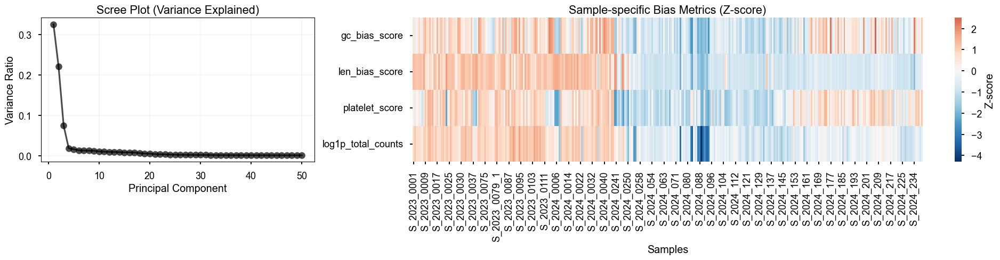

--- [Step 2-2] PCA Scatter Plots ---


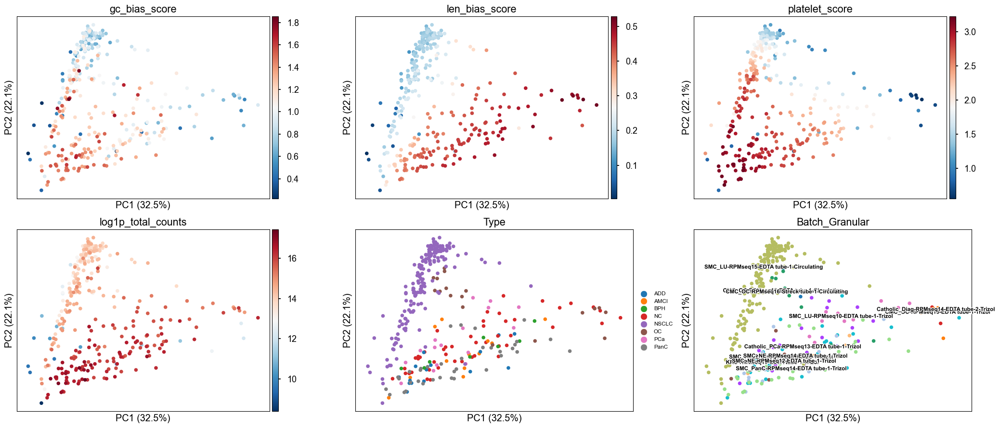

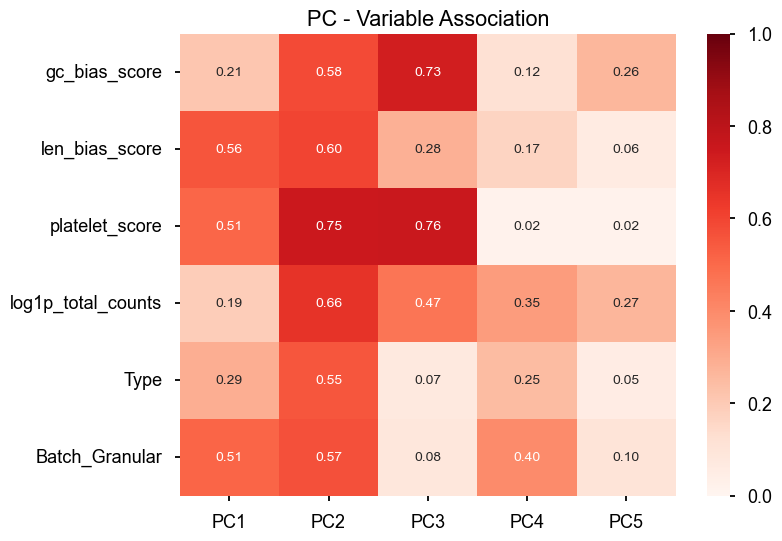

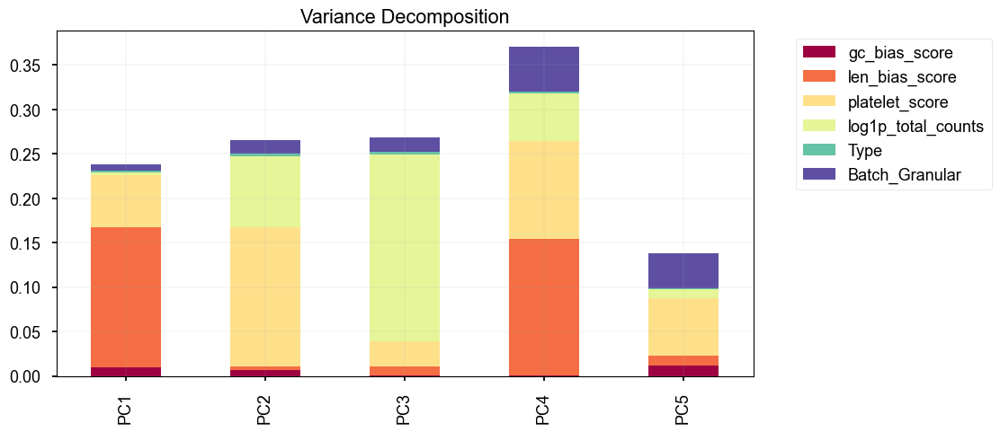

--- [Step 6] Partial Correlation Analysis ---


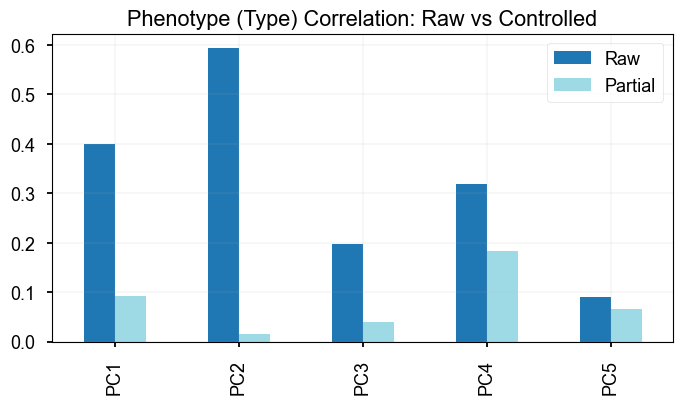

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 493 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


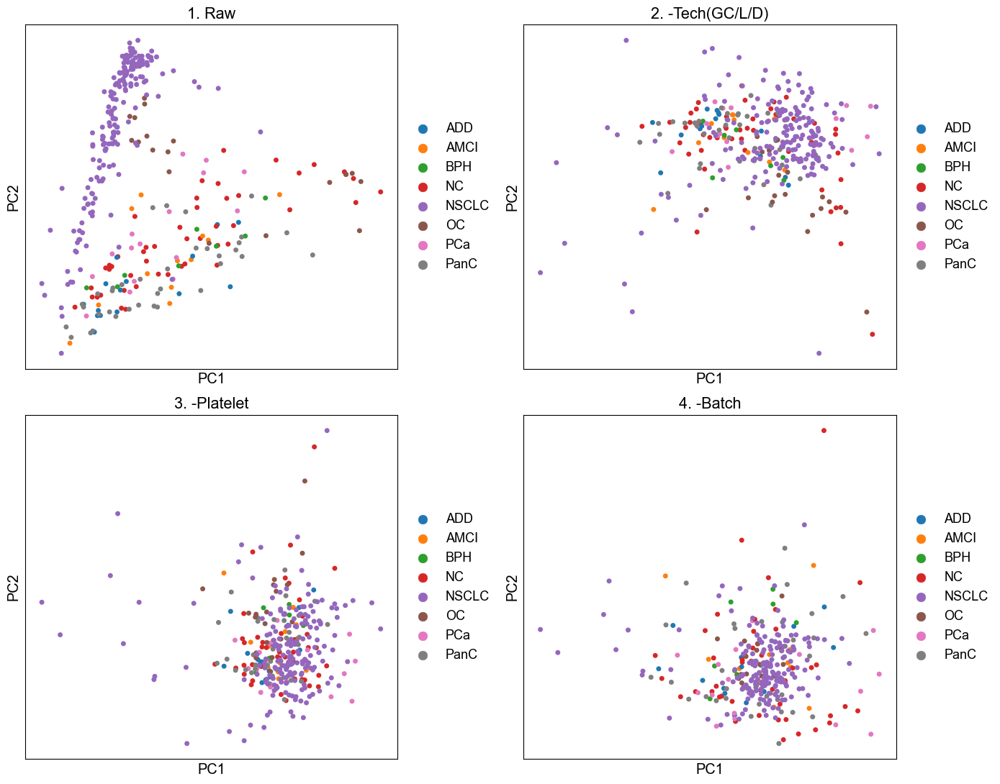

Displaying Metric Evolution (Spearman/ANOVA)...


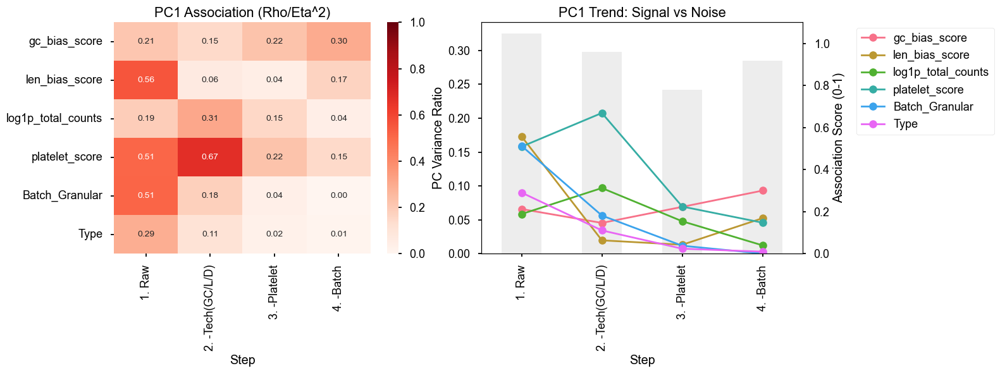

In [7]:
pipeline.run_pca_diagnostics() # 원본 바이어스 투영
pipeline.analyze_pc_associations()
pipeline.analyze_variance_decomposition()
pipeline.analyze_partial_correlation() # 포함됨
pipeline.run_cascade_analysis(batch_method='combat')

### Draw Bias Patterns

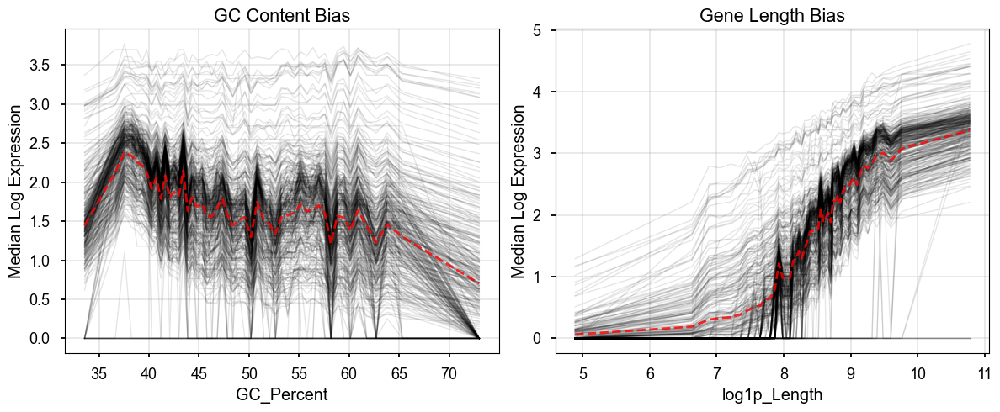

In [4]:
def plot_bias_patterns(adata, feature_key, n_bins=50, ax=None, title=None):
    # 1. Data Prep
    feat = adata.var[feature_key]
    valid = feat.notna()
    X = adata[:, valid].X
    feat = feat[valid]

    bins = pd.qcut(feat, q=n_bins, duplicates='drop')
    intervals = sorted(bins.unique())
    x_centers = [i.mid for i in intervals]
    
    sample_trends = []
    for b in intervals:
        mask = (bins == b).values
        bin_medians = np.median(X[:, mask], axis=1)
        sample_trends.append(bin_medians)
        
    df = pd.DataFrame(sample_trends, index=x_centers, columns=adata.obs_names)

    ax.plot(df.index, df.values, color='k', alpha=0.1, lw=1)
    ax.plot(df.index, df.mean(axis=1), color='r', alpha=0.8, lw=2, ls='--', label='Global Mean')
    ax.set_title(title if title else f"Bias: {feature_key}")
    ax.set_xlabel(feature_key)
    ax.set_ylabel("Median Log Expression")
    ax.grid(alpha=0.3)
    return ax

# --- Execution ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

adata = pipeline.adata.copy()
adata.var['log1p_Length'] = np.log1p(adata.var['Length'])
# GC Bias
plot_bias_patterns(adata, 'GC_Percent', ax=axes[0], title="GC Content Bias")  # 컬럼명 수정 필요

# Length Bias
plot_bias_patterns(adata, 'log1p_Length', ax=axes[1], title="Gene Length Bias") # 컬럼명 수정 필요

plt.tight_layout()
plt.show()

### Check Bias ~ Batch Relationship

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.spatial.distance import pdist, squareform
try:
    from skbio.stats.distance import permanova
    from skbio import DistanceMatrix
    has_skbio = True
except ImportError:
    has_skbio = False

In [6]:
df_obs = pipeline.adata.obs.copy()
bias_cols = pipeline.get_metric_keys()
batch_col = 'Batch_Granular'

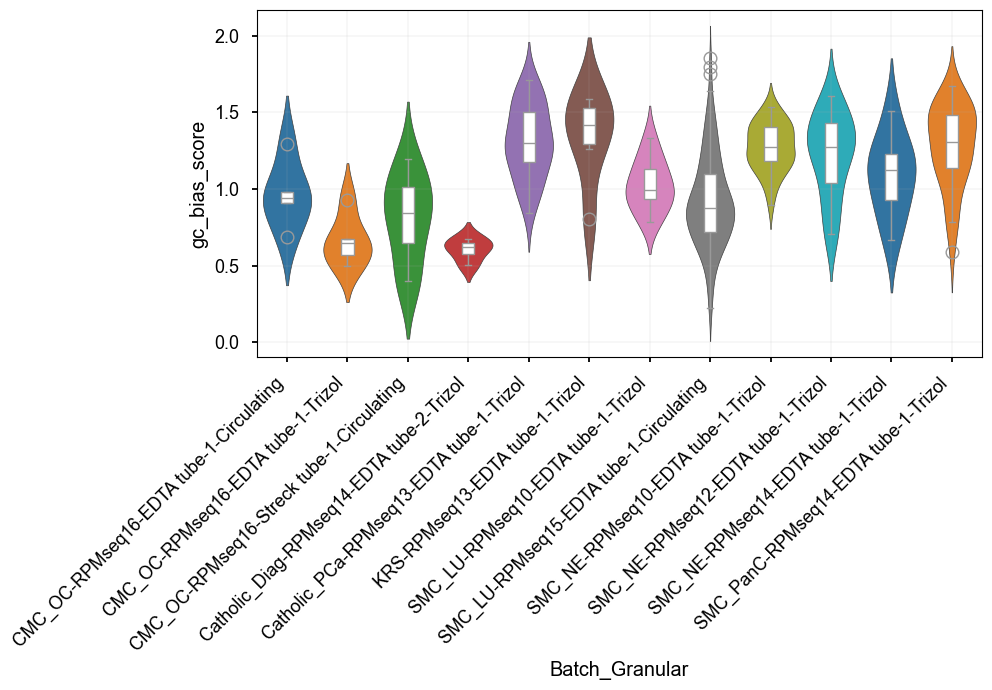

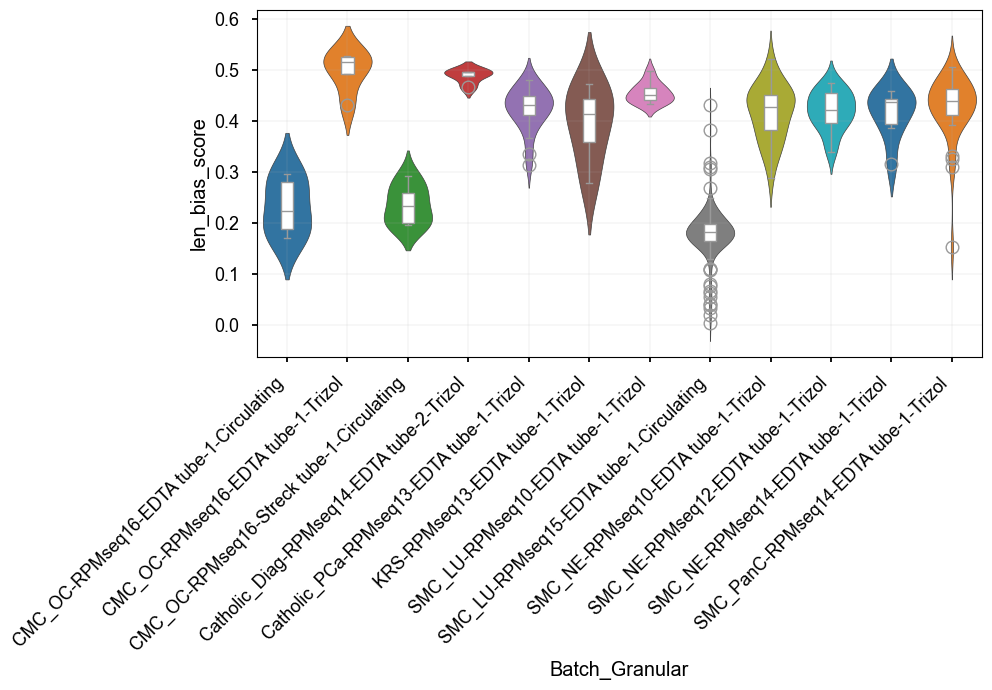

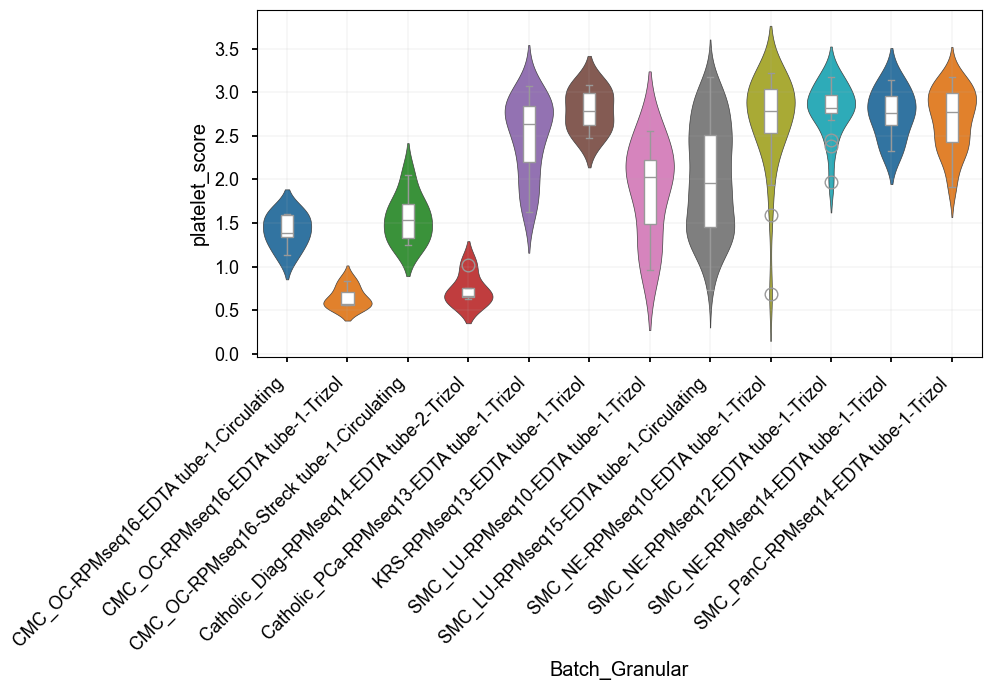

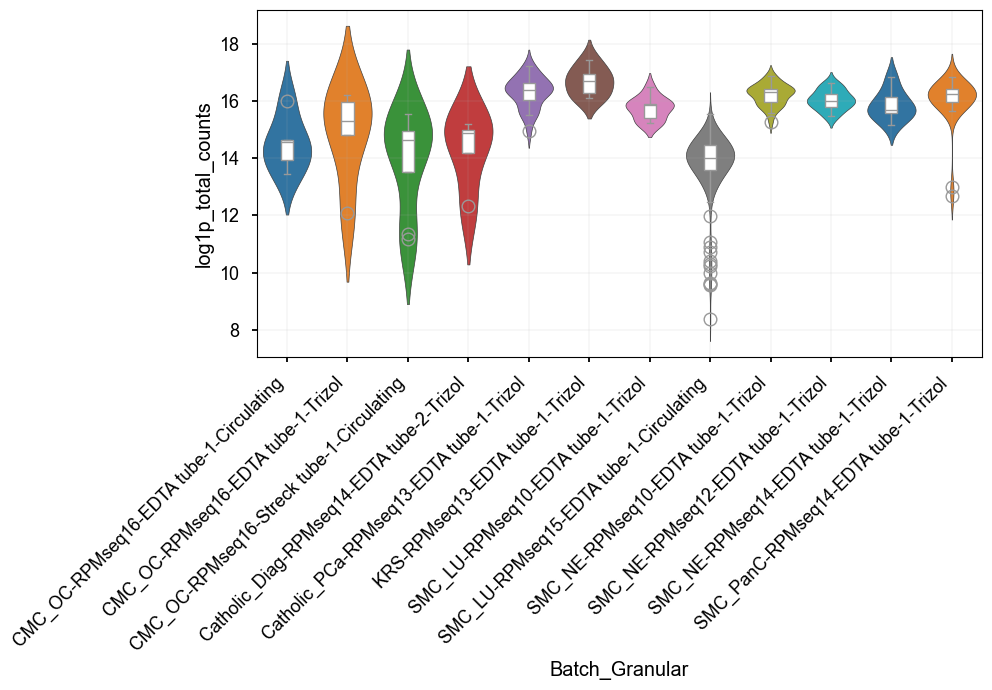

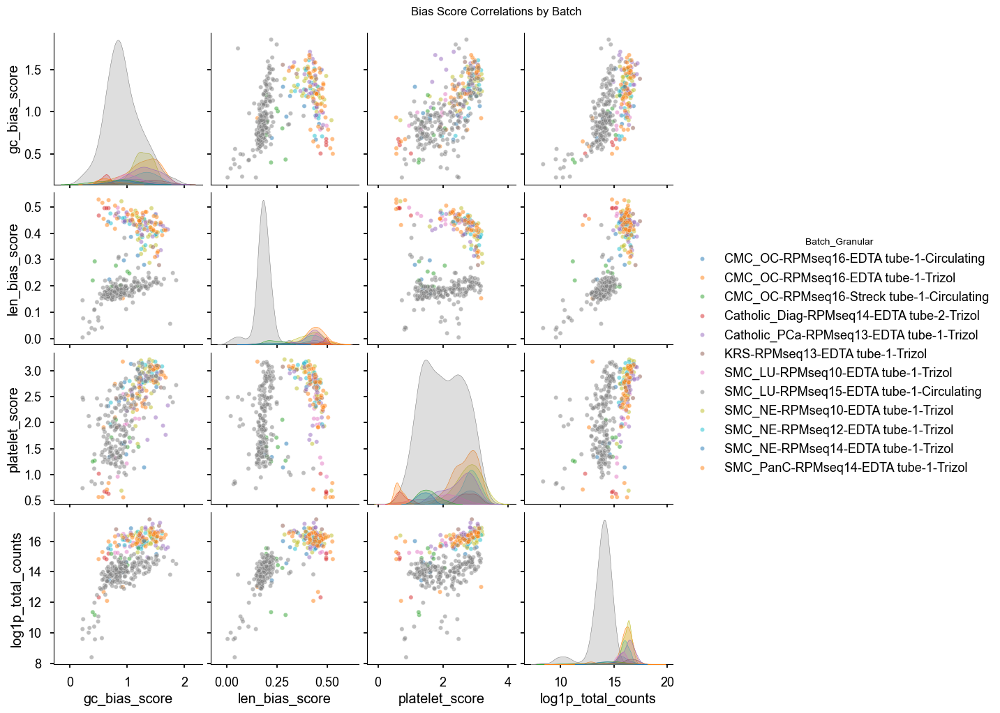

### Univariate Statistical Analysis (Batch Effect) ###
           Bias_Score  KW_Statistic  p-value  Eta_Squared Effect_Size_Class
0       gc_bias_score      111.6726      0.0       0.3051             Large
1      len_bias_score      247.8099      0.0       0.7176             Large
2      platelet_score      123.7068      0.0       0.3415             Large
3  log1p_total_counts      232.1576      0.0       0.6702             Large


/tmp/ipykernel_58089/2833222785.py:68: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = [group[col].values for name, group in df.groupby(batch_col)]


In [8]:
def plot_bias_distribution(df, bias_cols, batch_col):
    for col in bias_cols:
        plt.figure(figsize=(10, 7))
        ax = sns.violinplot(x=batch_col, y=col, data=df, inner=None, color=".8", hue=batch_col, palette='tab10')
        sns.boxplot(x=batch_col, y=col, data=df, width=0.2, ax=ax,
                    boxprops={'zorder': 2}, color="white")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.grid(alpha=0.1)
        plt.show()

def plot_bias_correlations(df, bias_cols, batch_col):
    g = sns.pairplot(df[bias_cols + [batch_col]], 
                     hue=batch_col, 
                     diag_kind="kde", 
                     plot_kws={'alpha': 0.5, 's': 20},
                     palette="tab10")
    
    g.fig.suptitle("Bias Score Correlations by Batch", y=1.02)
    plt.show()

def run_permanova_analysis(df, bias_cols, batch_col):
    if not has_skbio:
        print("Error: scikit-bio is not installed.")
        return None

    bias_z = df[bias_cols].apply(stats.zscore)
    clean_data = bias_z.join(df[batch_col]).dropna()
    
    if clean_data.empty:
        print("No data available after dropping NaNs.")
        return None

    bias_matrix = clean_data[bias_cols]
    grouping = clean_data[batch_col]

    dm = pdist(bias_matrix, metric='euclidean')
    dm_sq = squareform(dm)
    dist_matrix = DistanceMatrix(dm_sq, ids=clean_data.index)
    perm_results = permanova(dist_matrix, grouping=grouping, permutations=9999)
    summary_data = {
        "Test_Method": "PERMANOVA (Euclidean)",
        "Grouping_Var": batch_col,
        "N_Samples": int(perm_results['sample size']),
        "N_Groups": int(perm_results['number of groups']),
        "Pseudo_F": perm_results['test statistic'], # 효과 크기 지표 (클수록 그룹 간 차이 큼)
        "p_value": perm_results['p-value'],
        "Permutations": perm_results['number of permutations']
    }
    
    res_df = pd.DataFrame([summary_data])
    def get_sig_star(p):
        if p < 0.001: return '***'
        elif p < 0.01: return '**'
        elif p < 0.05: return '*'
        else: return 'ns'
        
    res_df['Sig'] = res_df['p_value'].apply(get_sig_star)
    cols_order = ["Test_Method", "Grouping_Var", "N_Samples", "N_Groups", "Pseudo_F", "p_value", "Sig", "Permutations"]
    res_df = res_df[cols_order]

    return res_df

def kruskal_wallis_test(df, bias_cols, batch_col):
    results = []
    for col in bias_cols:
        # 1. Kruskal-Wallis Test
        groups = [group[col].values for name, group in df.groupby(batch_col)]
        H, p = stats.kruskal(*groups)
        
        # 2. Effect Size (Eta-squared for H-statistic)
        # Formula: (H - k + 1) / (n - k)
        # k: number of groups, n: total observations
        k = len(groups)
        n = len(df)
        eta_sq = (H - k + 1) / (n - k)
        
        # 음수 보정 (아주 드물게 발생 가능)
        eta_sq = max(0, eta_sq)
        
        results.append({
            'Bias_Score': col,
            'KW_Statistic': H,
            'p-value': p,
            'Eta_Squared': eta_sq,
            'Effect_Size_Class': 'Large' if eta_sq > 0.14 else ('Medium' if eta_sq > 0.06 else 'Small')
        })

    stats_df = pd.DataFrame(results)
    print("### Univariate Statistical Analysis (Batch Effect) ###")
    print(stats_df.round(4))
    return stats_df 

plot_bias_distribution(df_obs, bias_cols, batch_col)
plot_bias_correlations(df_obs, bias_cols, batch_col)
permanova_stats = run_permanova_analysis(df_obs, bias_cols, batch_col)
kruskal_stats = kruskal_wallis_test(df_obs, bias_cols, batch_col)

In [9]:
permanova_stats

,Test_Method,Grouping_Var,N_Samples,N_Groups,Pseudo_F,p_value,Sig,Permutations
0,PERMANOVA (Euclidean),Batch_Granular,342,12,34.491002,0.0001,***,9999


In [10]:
kruskal_stats

,Bias_Score,KW_Statistic,p-value,Eta_Squared,Effect_Size_Class
0,gc_bias_score,111.672634,8.484866e-19,0.305069,Large
1,len_bias_score,247.809900,8.030412e-47,0.717606,Large
2,platelet_score,123.706801,3.250279e-21,0.341536,Large
3,log1p_total_counts,232.157566,1.503742e-43,0.670174,Large


### Test for Replicates

/tmp/ipykernel_58089/2944036389.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for sample_name, group in obs.groupby('Sample.name'):


Identified 9 replicate pairs.


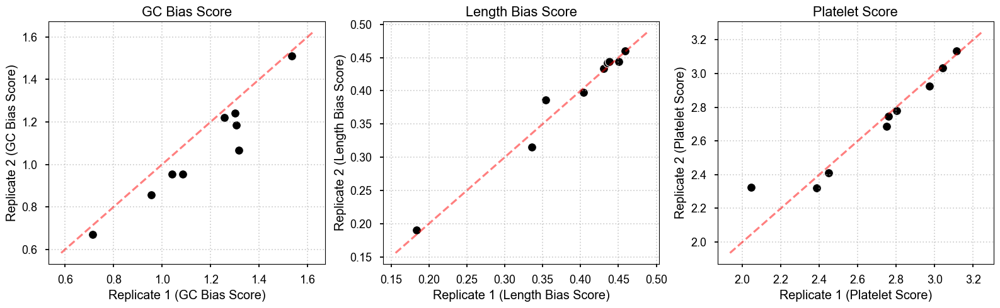

In [12]:
obs = pipeline.adata.obs.copy()
pair_map = {}
for sample_name, group in obs.groupby('Sample.name'):
    if len(group) == 2:
        pair_map[sample_name] = group.index.tolist()

print(f"Identified {len(pair_map)} replicate pairs.")

paired_data = []

for sname, indices in pair_map.items():
    # Sort indices to ensure consistency (e.g., S_... vs S_..._1)
    indices = sorted(indices)
    row_a = obs.loc[indices[0]]
    row_b = obs.loc[indices[1]]
    
    paired_data.append({
        'Sample.name': sname,
        'ID_A': indices[0], 'ID_B': indices[1],
        'gc_A': row_a['gc_bias_score'], 'gc_B': row_b['gc_bias_score'],
        'len_A': row_a['len_bias_score'], 'len_B': row_b['len_bias_score'],
        'platelet_A': row_a['platelet_score'], 'platelet_B': row_b['platelet_score']
    })
df_paired = pd.DataFrame(paired_data)

metrics = [
    ('gc', 'GC Bias Score'), 
    ('len', 'Length Bias Score'), 
    ('platelet', 'Platelet Score')
]
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for i, (metric_prefix, title) in enumerate(metrics):
    ax = axes[i]
    x_col = f'{metric_prefix}_A'
    y_col = f'{metric_prefix}_B'
    
    sns.scatterplot(data=df_paired, x=x_col, y=y_col, ax=ax, s=100, color='black')
    
    # Add x=y line
    min_val = min(df_paired[x_col].min(), df_paired[y_col].min())
    max_val = max(df_paired[x_col].max(), df_paired[y_col].max())
    margin = (max_val - min_val) * 0.1
    ax.plot([min_val - margin, max_val + margin], [min_val - margin, max_val + margin], 'r--', alpha=0.5, label='x=y')
    
    ax.set_title(title)
    ax.set_xlabel(f"Replicate 1 ({title})")
    ax.set_ylabel(f"Replicate 2 ({title})")
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()

/tmp/ipykernel_58089/3785686187.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for sample_name, group in obs.groupby('Sample.name'):
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:227: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(adata, mask_var, use_highly_variable)


Identified 9 replicate pairs.


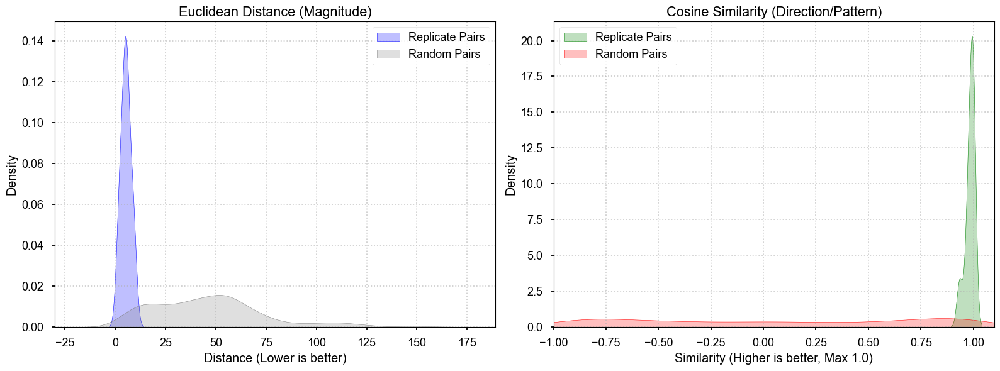

=== Distance & Similarity Test ===
[Euclidean] Rep Mean: 5.2665 vs Random Mean: 46.2083
P-value (Rep < Random Distance): 5.2222e-07

[Cosine Sim] Rep Mean: 0.9836 vs Random Mean: 0.0440
P-value (Rep > Random Similarity): 5.9711e-07


In [13]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import euclidean, cosine, pdist
from itertools import combinations
from scipy.stats import mannwhitneyu

adata_processed = pipeline.adata.copy()
# 1. Replicate Pair 식별 (기존 로직 유지)
obs = adata_processed.obs
pair_map = {}
for sample_name, group in obs.groupby('Sample.name'):
    if len(group) == 2:
        pair_map[sample_name] = group.index.tolist()

print(f"Identified {len(pair_map)} replicate pairs.")

# 2. PCA 수행 (전체 데이터에 대해 한 번만 수행하는 것이 정석입니다)
# HVG가 지정되지 않았다면 먼저 계산하는 것을 추천합니다.
if 'highly_variable' not in adata_processed.var:
    sc.pp.highly_variable_genes(adata_processed, n_top_genes=2000)
    
sc.tl.pca(adata_processed, svd_solver='arpack', use_highly_variable=True)
pca_coords = adata_processed.obsm['X_pca']

# 3. 거리 및 유사도 계산
replicate_distances = []
random_distances = []
replicate_similarities = []  # 코사인 유사도 저장용
random_similarities = []     # 코사인 유사도 저장용

# (1) Replicate 간 계산
for sname, (id_a, id_b) in pair_map.items():
    idx_a = adata_processed.obs_names.get_loc(id_a)
    idx_b = adata_processed.obs_names.get_loc(id_b)
    
    vec_a = pca_coords[idx_a, :5]
    vec_b = pca_coords[idx_b, :5]
    
    # 유클리드 거리
    replicate_distances.append(euclidean(vec_a, vec_b))
    # 코사인 유사도 (1 - 코사인 거리)
    # scipy의 cosine 함수는 '거리(0~2)'를 반환하므로 1에서 빼줘야 유사도(-1~1)가 됨
    replicate_similarities.append(1 - cosine(vec_a, vec_b))

# (2) 무작위(Random) 계산
all_indices = np.arange(adata_processed.n_obs)
np.random.seed(42)
random_pairs = np.random.choice(all_indices, size=(1000, 2))

for idx_a, idx_b in random_pairs:
    name_a = adata_processed.obs.iloc[idx_a]['Sample.name']
    name_b = adata_processed.obs.iloc[idx_b]['Sample.name']
    
    if name_a != name_b: 
        vec_a = pca_coords[idx_a, :5]
        vec_b = pca_coords[idx_b, :5]
        
        random_distances.append(euclidean(vec_a, vec_b))
        random_similarities.append(1 - cosine(vec_a, vec_b))

# 4. 결과 시각화 (두 개의 플롯을 나란히 그림)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# (왼쪽) Euclidean Distance
sns.kdeplot(replicate_distances, fill=True, label='Replicate Pairs', color='blue', ax=axes[0])
sns.kdeplot(random_distances, fill=True, label='Random Pairs', color='grey', ax=axes[0])
axes[0].set_title("Euclidean Distance (Magnitude)")
axes[0].set_xlabel("Distance (Lower is better)")
axes[0].set_ylabel("Density")
axes[0].legend()
axes[0].grid(True, linestyle=':', alpha=0.6)

# (오른쪽) Cosine Similarity
sns.kdeplot(replicate_similarities, fill=True, label='Replicate Pairs', color='green', ax=axes[1])
sns.kdeplot(random_similarities, fill=True, label='Random Pairs', color='red', ax=axes[1])
axes[1].set_title("Cosine Similarity (Direction/Pattern)")
axes[1].set_xlabel("Similarity (Higher is better, Max 1.0)")
axes[1].set_ylabel("Density")
axes[1].legend()
axes[1].grid(True, linestyle=':', alpha=0.6)
axes[1].set_xlim(-1, 1.1) # 코사인 유사도 범위 고정

plt.tight_layout()
plt.show()

# 통계 검정
print(f"=== Distance & Similarity Test ===")
print(f"[Euclidean] Rep Mean: {np.mean(replicate_distances):.4f} vs Random Mean: {np.mean(random_distances):.4f}")
_, p_dist = mannwhitneyu(replicate_distances, random_distances, alternative='less') # 거리는 작을수록 좋음
print(f"P-value (Rep < Random Distance): {p_dist:.4e}\n")

print(f"[Cosine Sim] Rep Mean: {np.mean(replicate_similarities):.4f} vs Random Mean: {np.mean(random_similarities):.4f}")
_, p_sim = mannwhitneyu(replicate_similarities, random_similarities, alternative='greater') # 유사도는 클수록 좋음
print(f"P-value (Rep > Random Similarity): {p_sim:.4e}")

### Bias/Phenotype Relationship in Batch

/tmp/ipykernel_58089/2758837568.py:115: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  batch_counts = obs.groupby(batch_col)[pheno_col].nunique()


Plotting gc_bias_score ...


/tmp/ipykernel_58089/2758837568.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


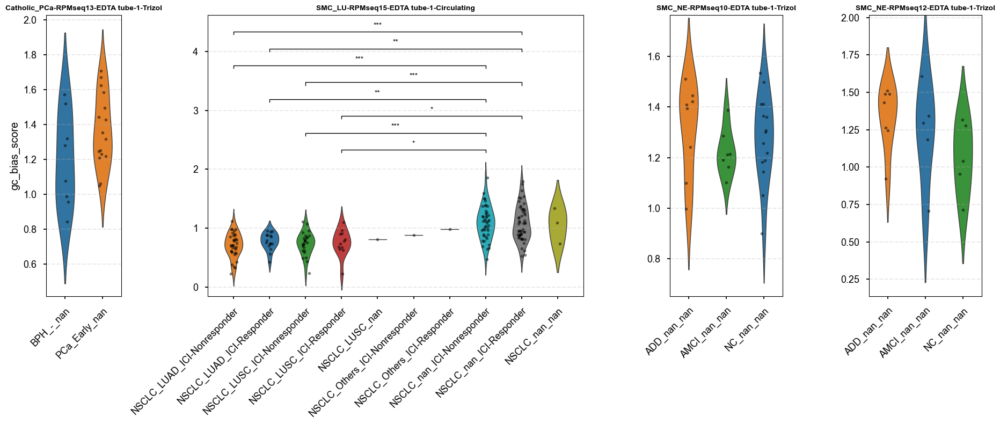

Plotting len_bias_score ...


/tmp/ipykernel_58089/2758837568.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


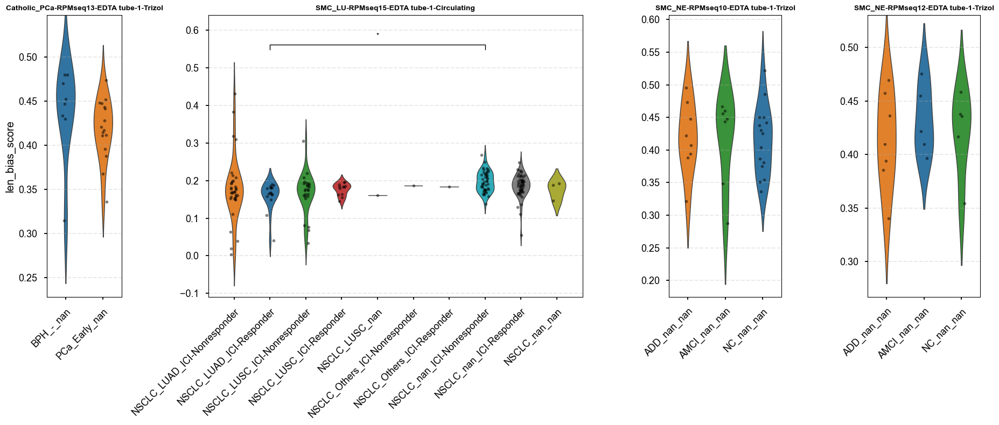

Plotting platelet_score ...


/tmp/ipykernel_58089/2758837568.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


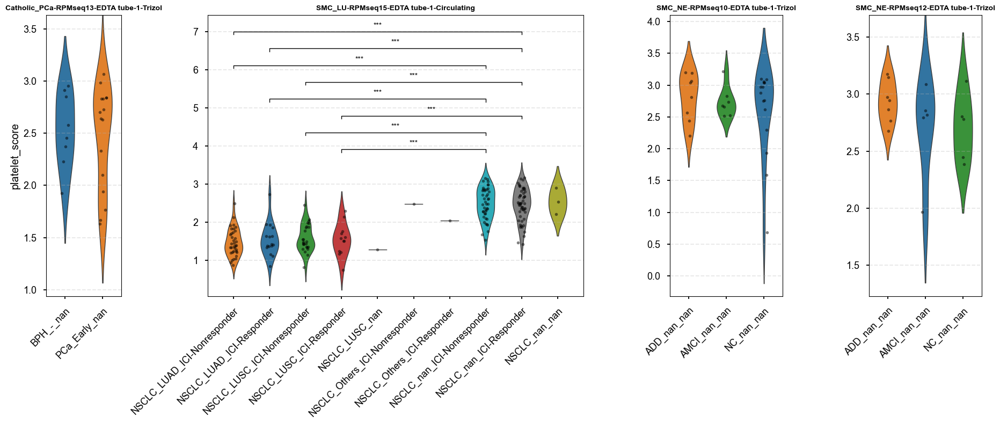

Plotting log1p_total_counts ...


/tmp/ipykernel_58089/2758837568.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


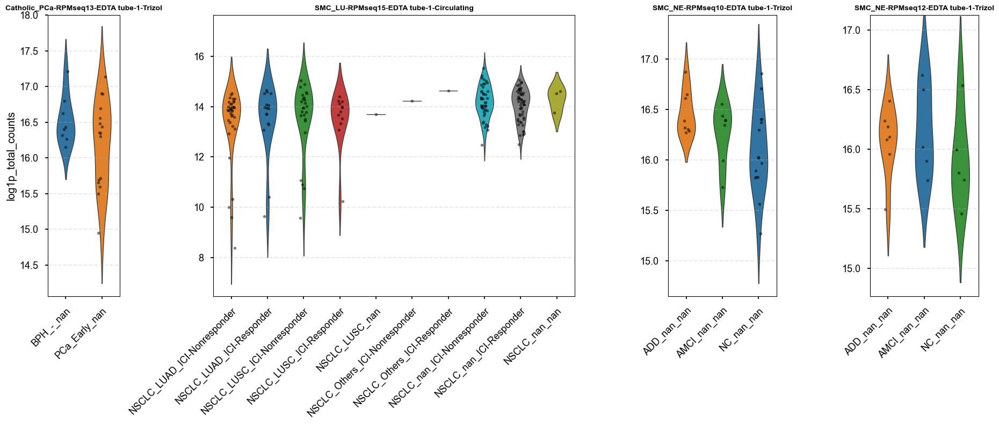

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from itertools import combinations
import math

obs = pipeline.adata.obs.copy()
bias_metrics = ['gc_bias_score', 'len_bias_score', 'platelet_score','log1p_total_counts']
batch_col = 'Batch_Granular'
pheno_col = 'disease'
def add_stat_annotation(ax, data, x, y, order, pairs, test='Wilcoxon', text_format='star', p_threshold=0.05):
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    line_height = y_range * 0.02
    text_height = y_range * 0.02
    step_height = y_range * 0.08 
    
    current_y = y_max 

    group_max = data.groupby(x)[y].max()
    current_y = group_max.max() + (y_range * 0.1)

    significant_combinations = []
    
    for pair in pairs:
        g1, g2 = pair
        d1 = data[data[x] == g1][y]
        d2 = data[data[x] == g2][y]

        if len(d1) < 2 or len(d2) < 2: continue

        # --- 통계 검정 (Wilcoxon Rank-Sum) ---
        try:
            stat, p_val = stats.ranksums(d1, d2)
        except ValueError:
            continue
            
        # --- Bonferroni Correction ---
        adj_p_val = p_val * len(pairs)
        if adj_p_val > 1.0: adj_p_val = 1.0
        
        if adj_p_val < p_threshold:
            significant_combinations.append(((g1, g2), adj_p_val))

    significant_combinations.sort(key=lambda x: abs(order.index(x[0][0]) - order.index(x[0][1])))

    for (g1, g2), p_val in significant_combinations:
        x1 = order.index(g1)
        x2 = order.index(g2)
        
        # 별표 생성
        if p_val < 0.001: star = '***'
        elif p_val < 0.01: star = '**'
        elif p_val < 0.05: star = '*'
        else: star = 'ns'
        
        if text_format == 'full':
            text = f"p={p_val:.1e}"
        else:
            text = star

        bar_y = current_y + step_height

        ax.plot([x1, x1, x2, x2], [bar_y, bar_y + line_height, bar_y + line_height, bar_y], 
                lw=1.0, c='black')
        
        ax.text((x1 + x2) / 2, bar_y + line_height + text_height, text, 
                ha='center', va='bottom', color='black', fontsize=10)
        
        current_y = bar_y + line_height + text_height

    ax.set_ylim(y_min, current_y + (y_range * 0.1))

batch_counts = obs.groupby(batch_col)[pheno_col].nunique()
valid_batches = batch_counts[batch_counts > 1].index.tolist()
valid_batches.sort()

if not valid_batches:
    print("비교 가능한 배치가 없습니다.")
else:
    for metric in bias_metrics:
        batch_group_counts = [obs[obs[batch_col]==b][pheno_col].nunique() for b in valid_batches]
        
        total_width = sum(batch_group_counts) * 0.8 + len(valid_batches) # 여백 포함
        if total_width < 6: total_width = 6 # 최소 너비 보장
        
        fig, axes = plt.subplots(1, len(valid_batches), 
                                 figsize=(total_width, 8), 
                                 gridspec_kw={'width_ratios': batch_group_counts},
                                 constrained_layout=True)
        
        if len(valid_batches) == 1: axes = [axes]
        
        print(f"Plotting {metric} ...")

        for ax, batch in zip(axes, valid_batches):
            subset = obs[obs[batch_col] == batch].copy()
            
            local_order = sorted(subset[pheno_col].unique())
            
            sns.violinplot(data=subset, x=pheno_col, y=metric, order=local_order,
                           ax=ax, hue=pheno_col, inner=None, linewidth=1., width=0.5)
            
            sns.stripplot(data=subset, x=pheno_col, y=metric, order=local_order,
                          ax=ax, color='black', alpha=0.5, size=4, jitter=True)

            combs = list(combinations(local_order, 2))
            add_stat_annotation(ax, subset, x=pheno_col, y=metric, 
                                order=local_order, pairs=combs,
                                test='Wilcoxon', text_format='star') # 'star' or 'full'
            
            ax.set_title(f"{batch}", fontweight='bold', fontsize=10)
            ax.set_xlabel("")
            ax.set_ylabel(metric if ax == axes[0] else "") # 첫 번째만 y라벨 표시
            
            ax.set_xticks(range(len(local_order)))
            ax.set_xticklabels(local_order, rotation=45, ha='right', rotation_mode='anchor')
            ax.grid(axis='y', linestyle='--', alpha=0.3)

        plt.tight_layout()
        plt.show()

### Check Bias For Each Cohorts 


 Processing: RPMseq10
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19420 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


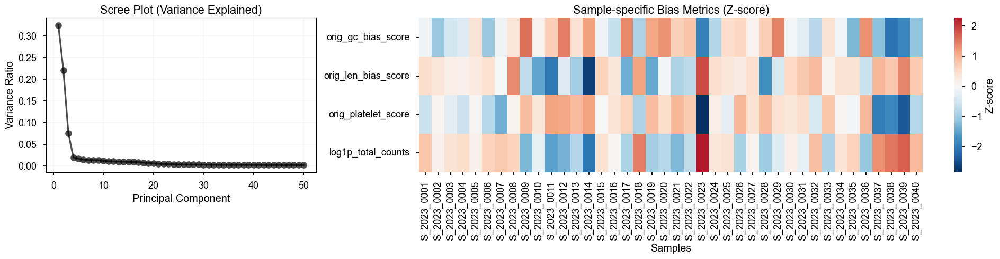

--- [Step 2-2] PCA Scatter Plots ---


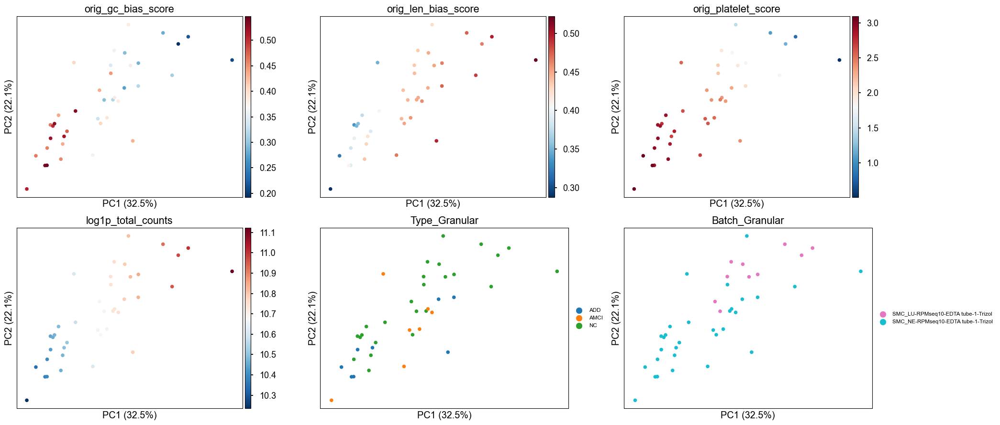

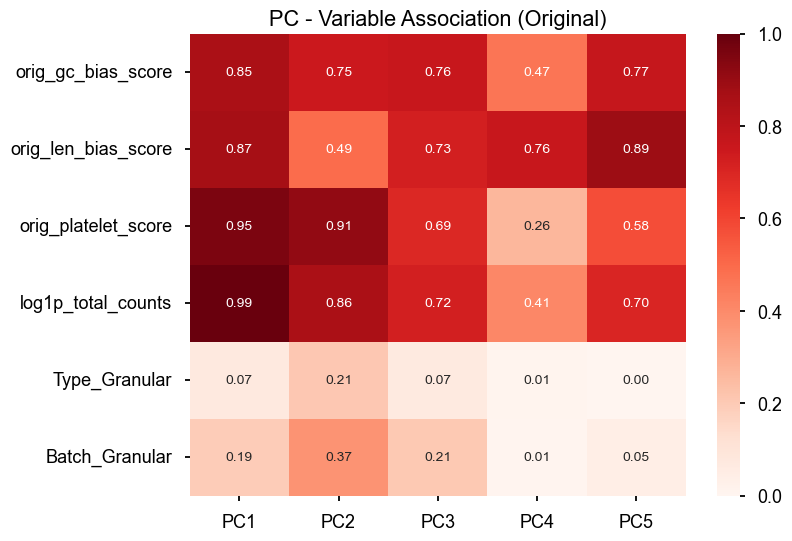

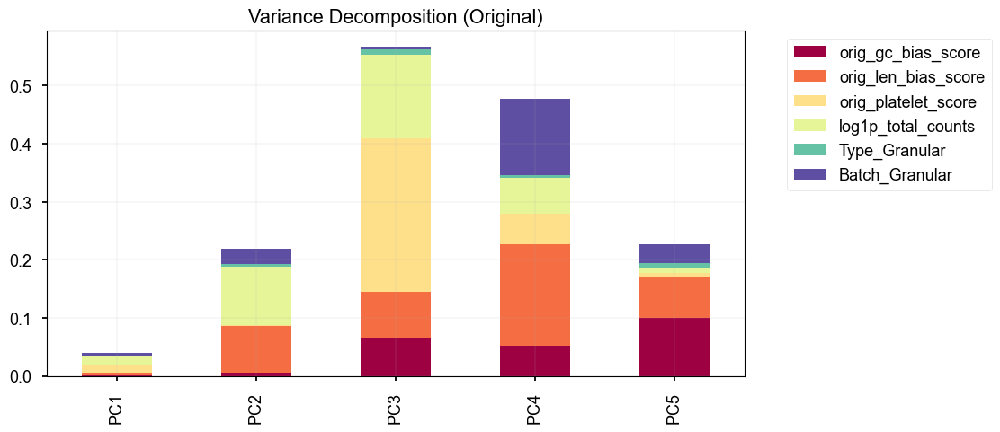

--- [Step 6] Partial Correlation Analysis (Original) ---


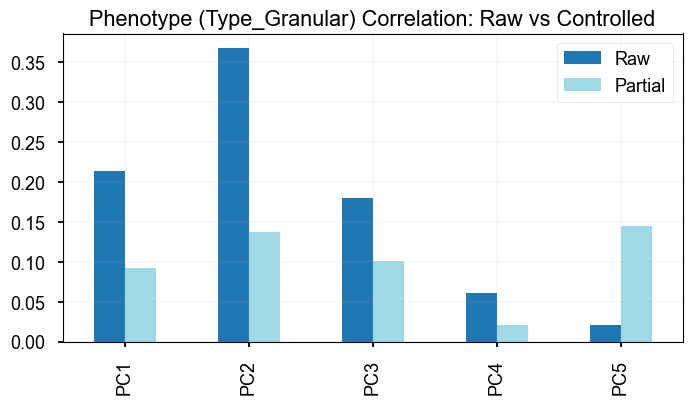

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


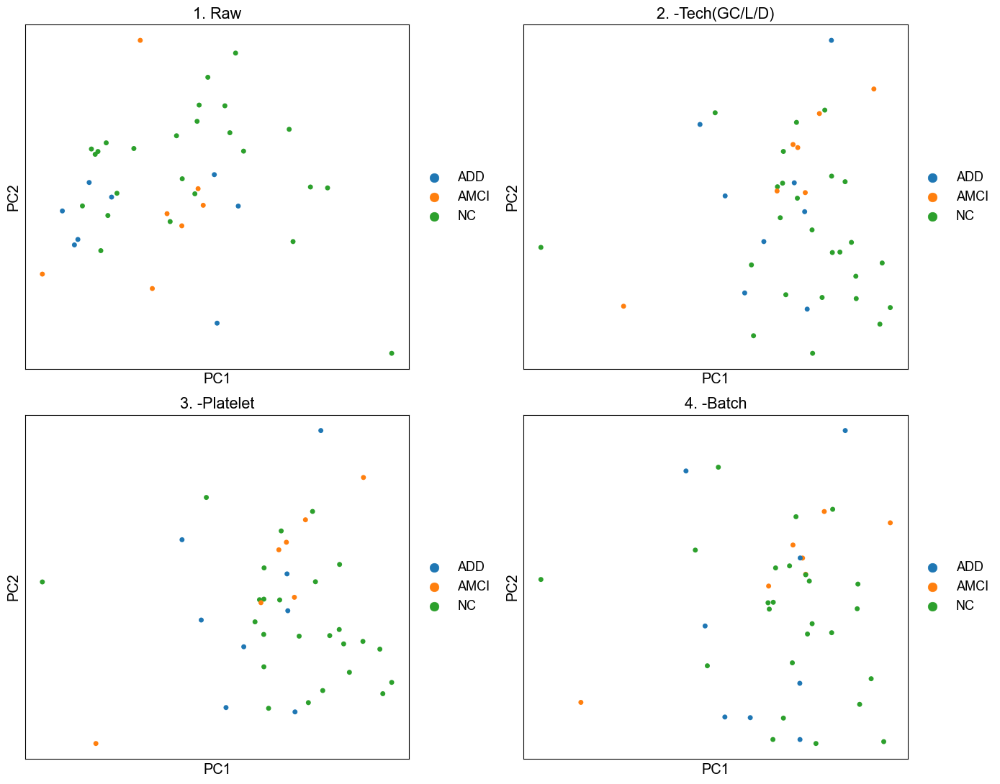

Displaying Metric Evolution (Spearman/ANOVA)...


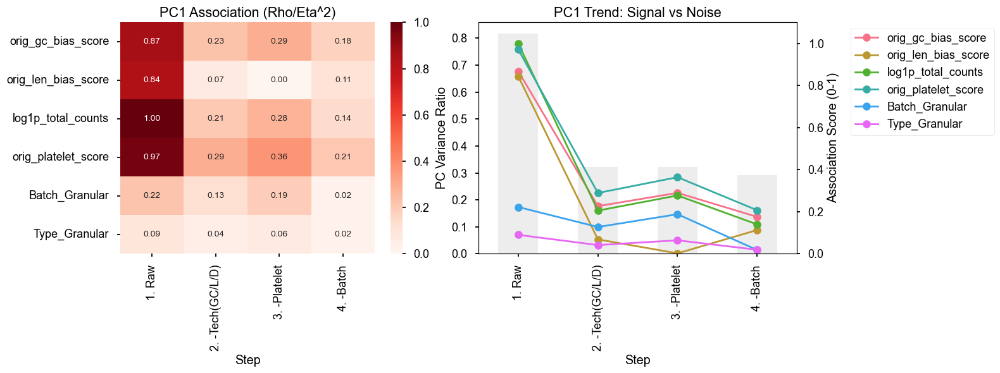

--- Finished Analysis for RPMseq10 ---

 Processing: RPMseq12
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19252 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


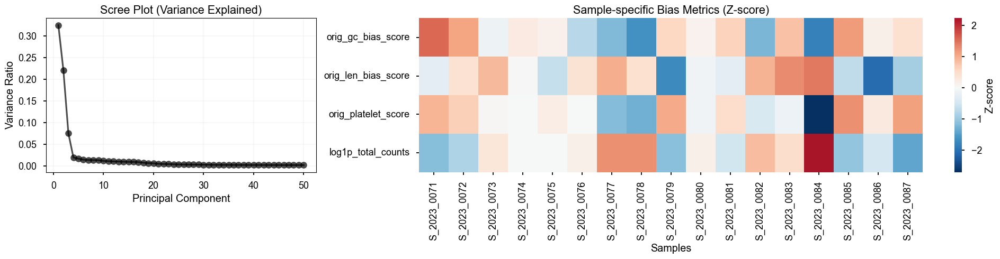

--- [Step 2-2] PCA Scatter Plots ---


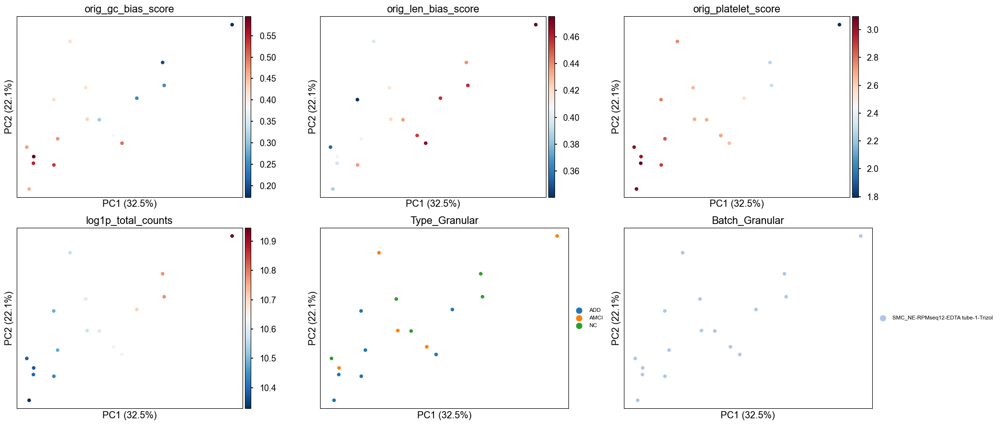

Skipping ANOVA for Batch_Granular: only one group present.


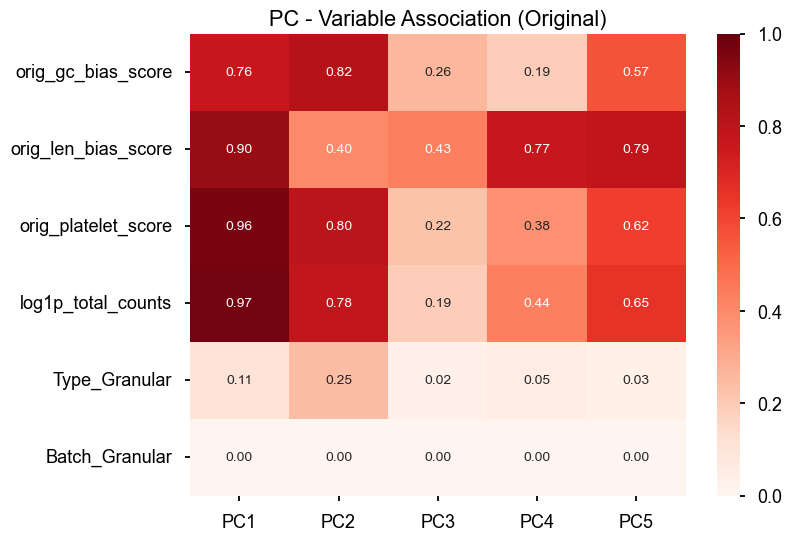

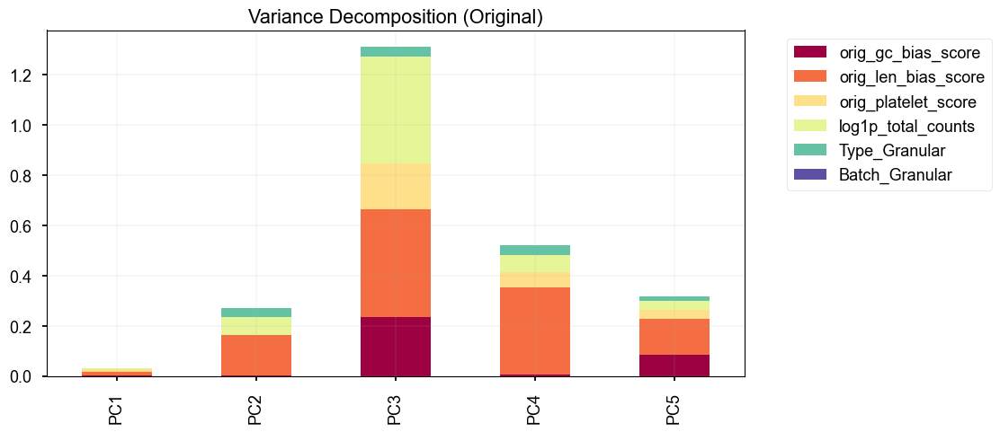

--- [Step 6] Partial Correlation Analysis (Original) ---


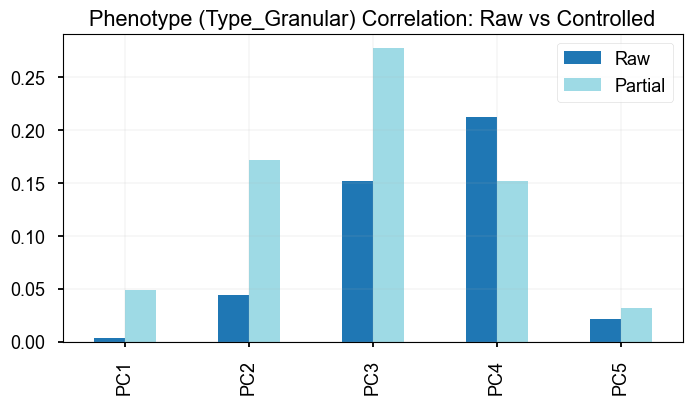

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


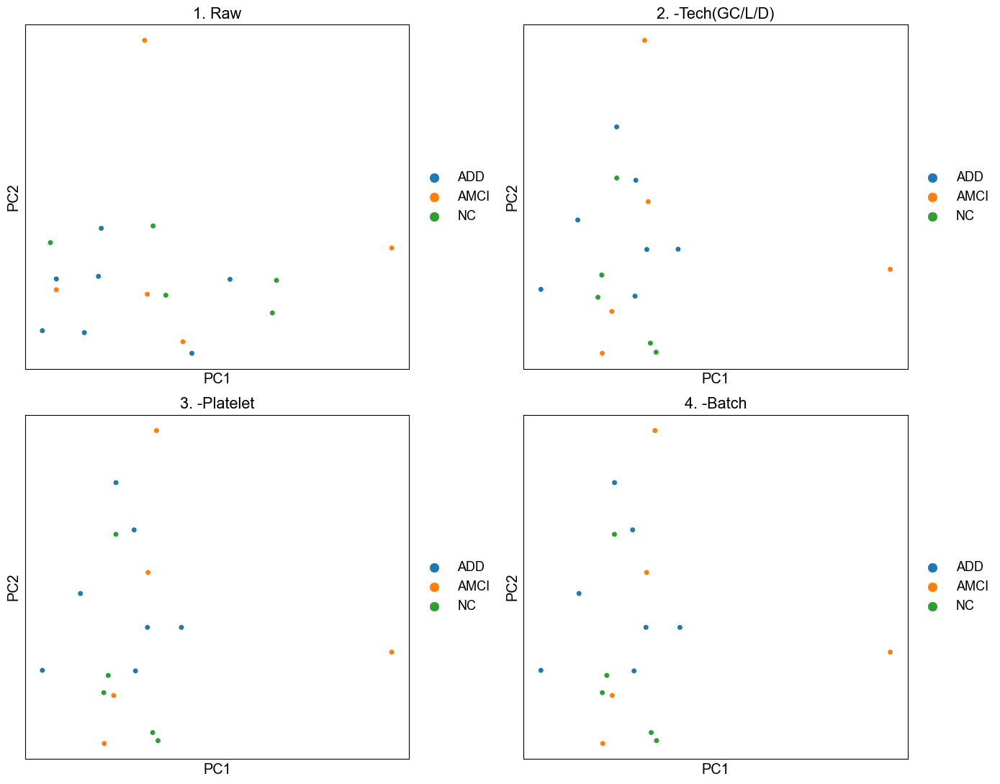

Displaying Metric Evolution (Spearman/ANOVA)...


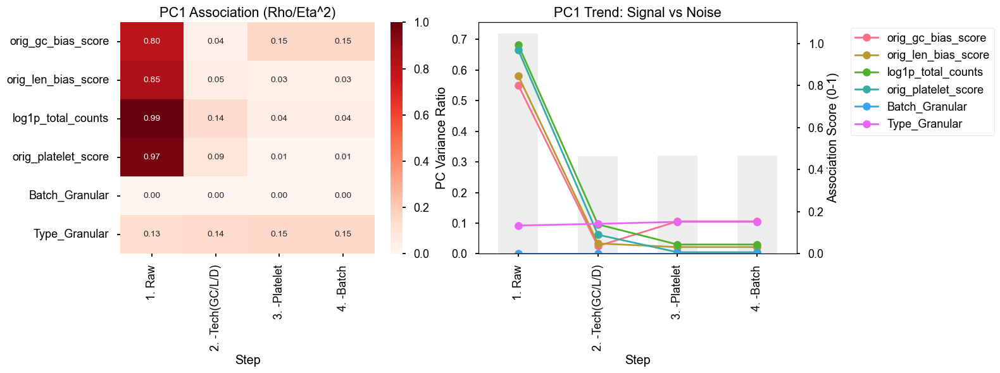

--- Finished Analysis for RPMseq12 ---

 Processing: RPMseq13
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19312 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


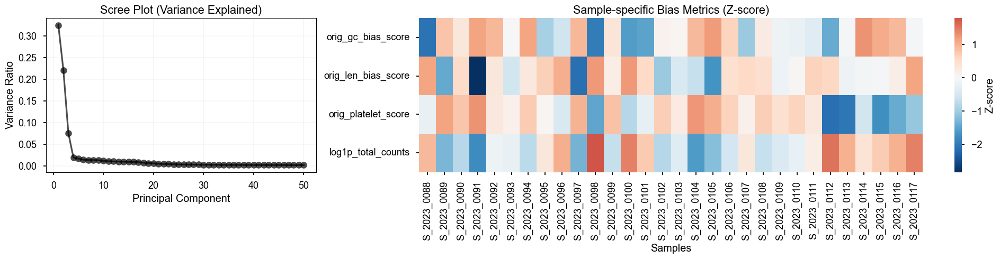

--- [Step 2-2] PCA Scatter Plots ---


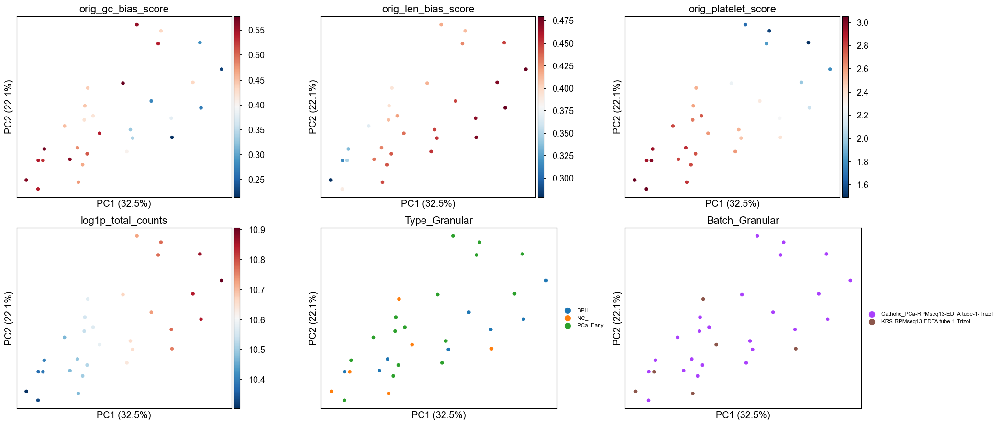

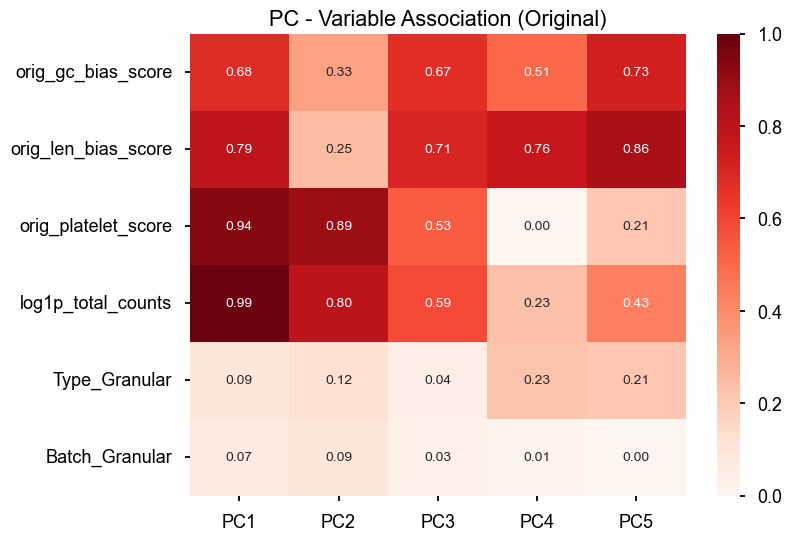

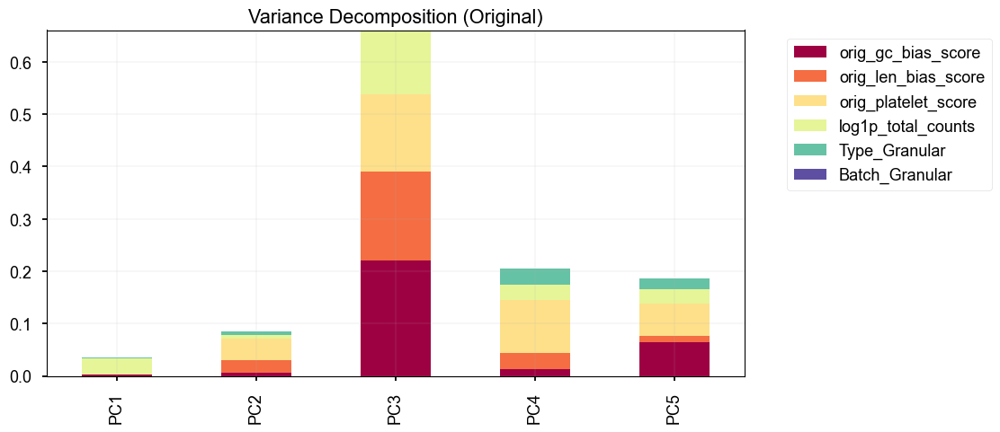

--- [Step 6] Partial Correlation Analysis (Original) ---


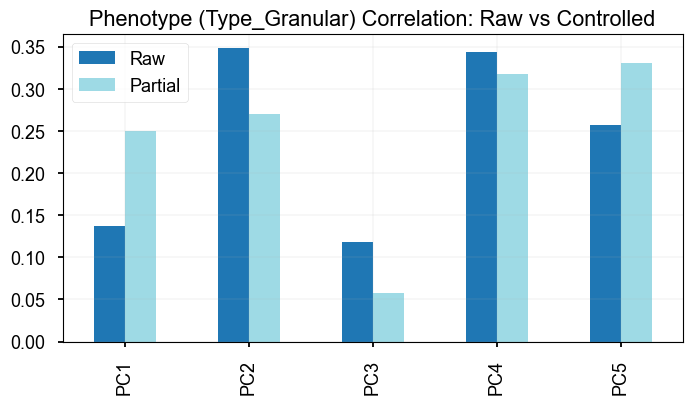

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


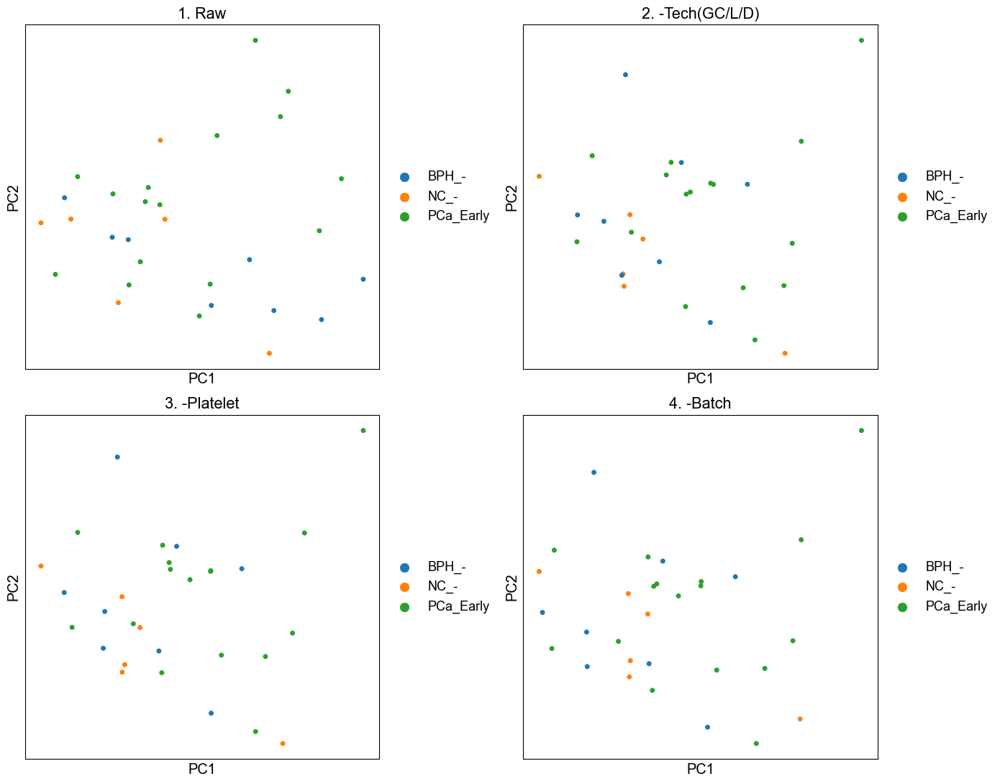

Displaying Metric Evolution (Spearman/ANOVA)...


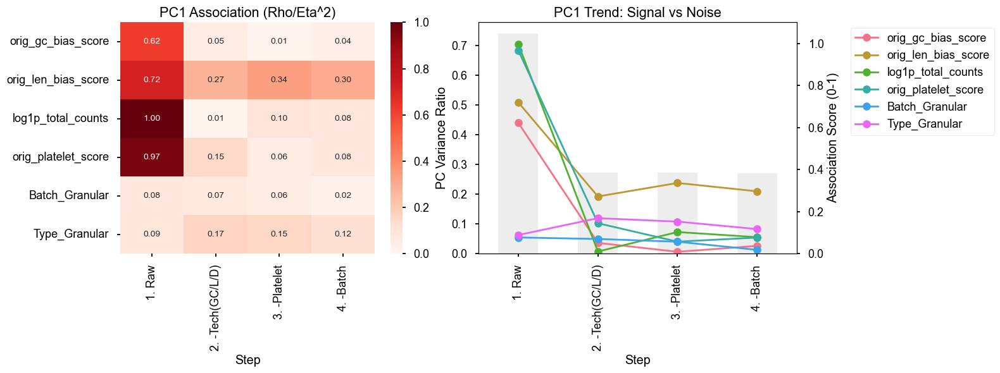

--- Finished Analysis for RPMseq13 ---

 Processing: RPMseq14
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19359 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


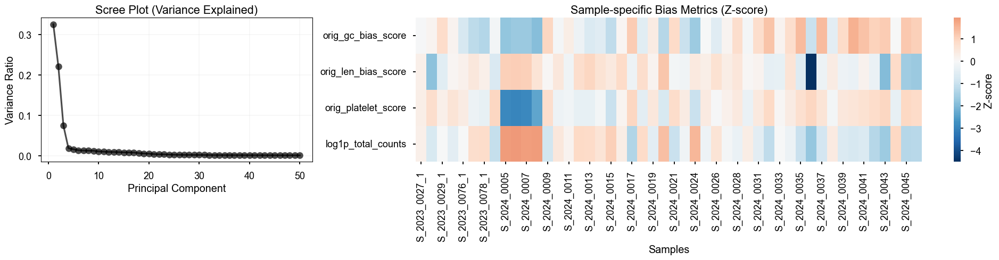

--- [Step 2-2] PCA Scatter Plots ---


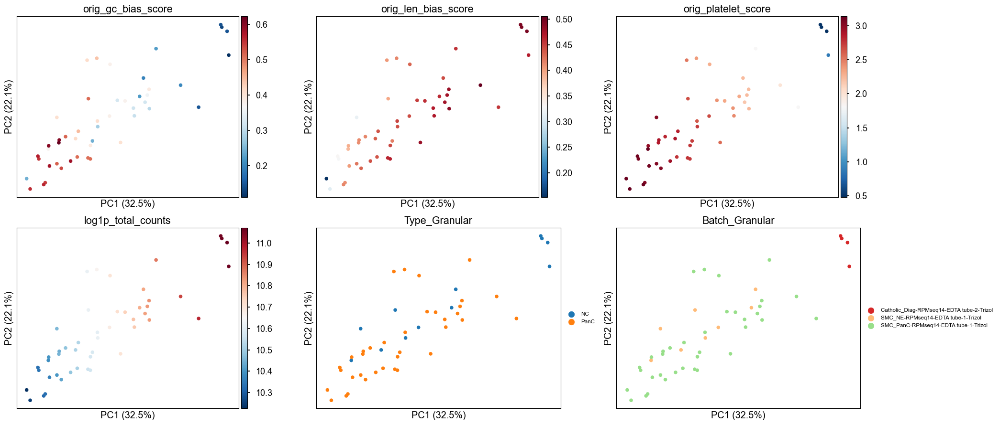

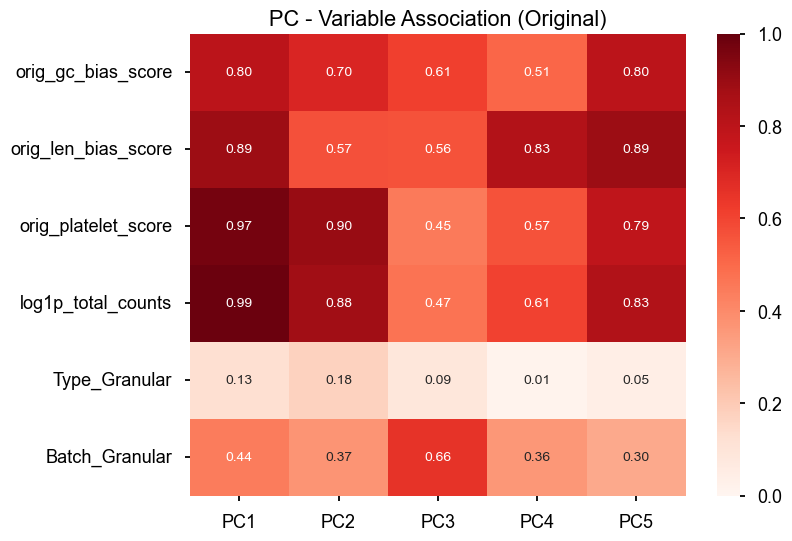

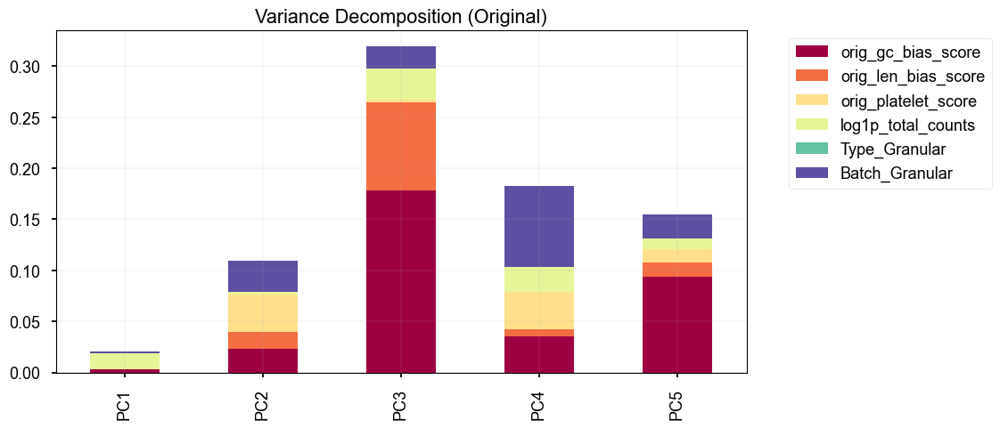

--- [Step 6] Partial Correlation Analysis (Original) ---


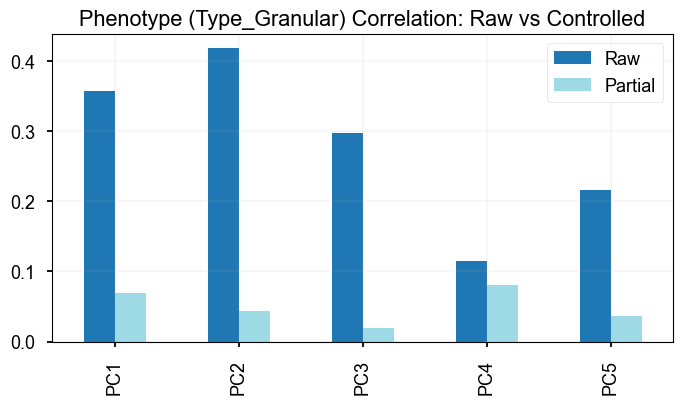

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


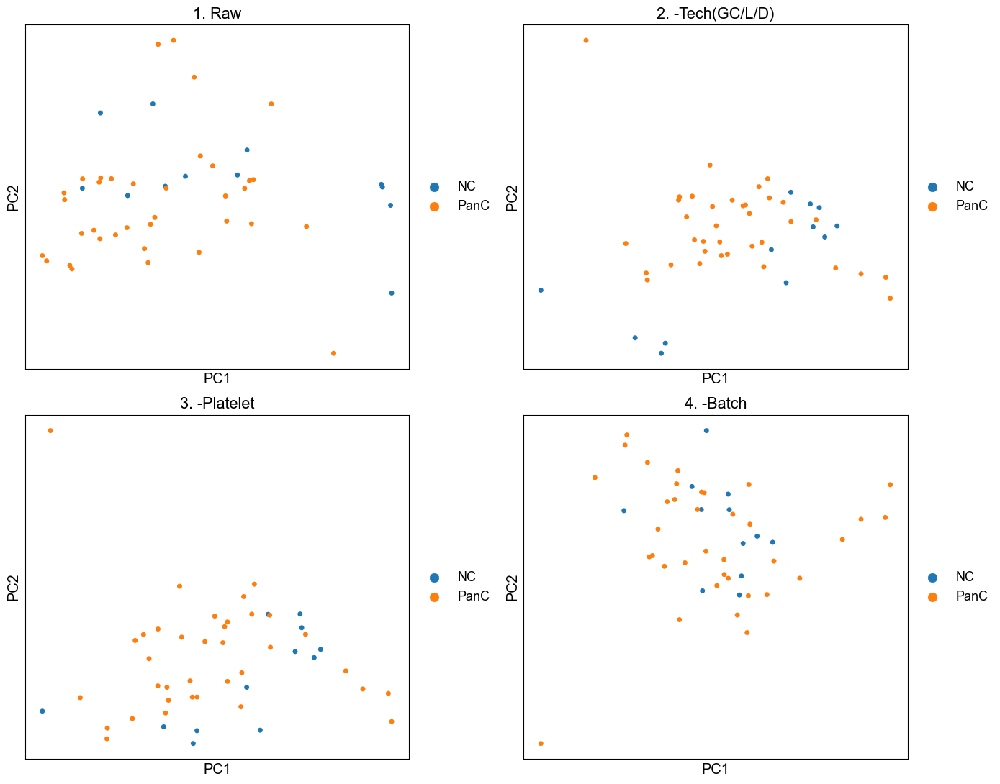

Displaying Metric Evolution (Spearman/ANOVA)...


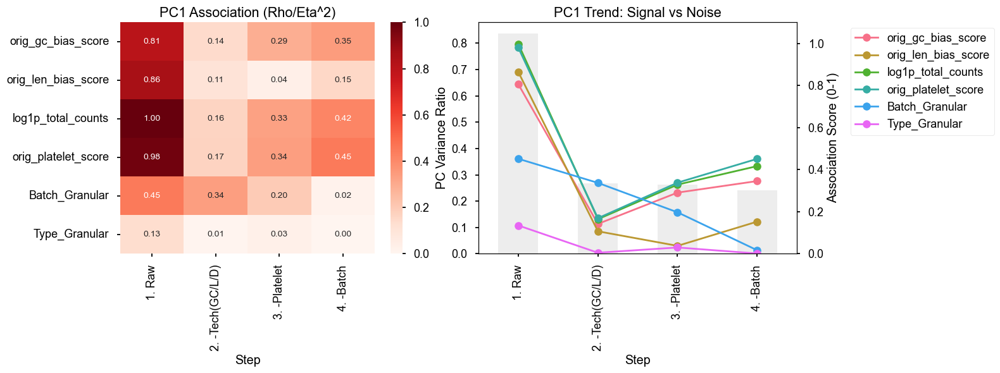

--- Finished Analysis for RPMseq14 ---

 Processing: RPMseq15
[RPMseq15] Removing samples with total counts < 441162.22
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19171 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


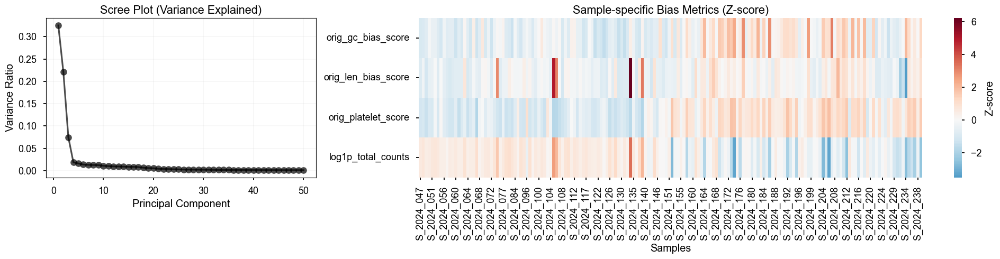

--- [Step 2-2] PCA Scatter Plots ---


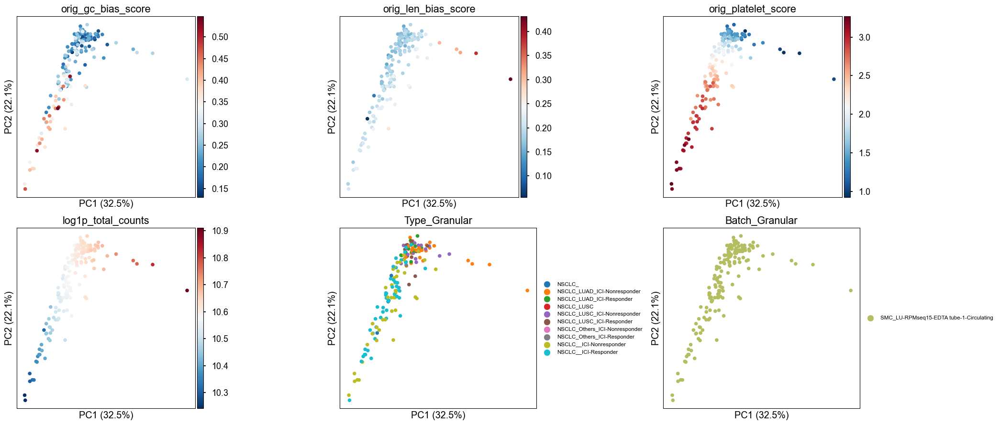

Skipping ANOVA for Batch_Granular: only one group present.


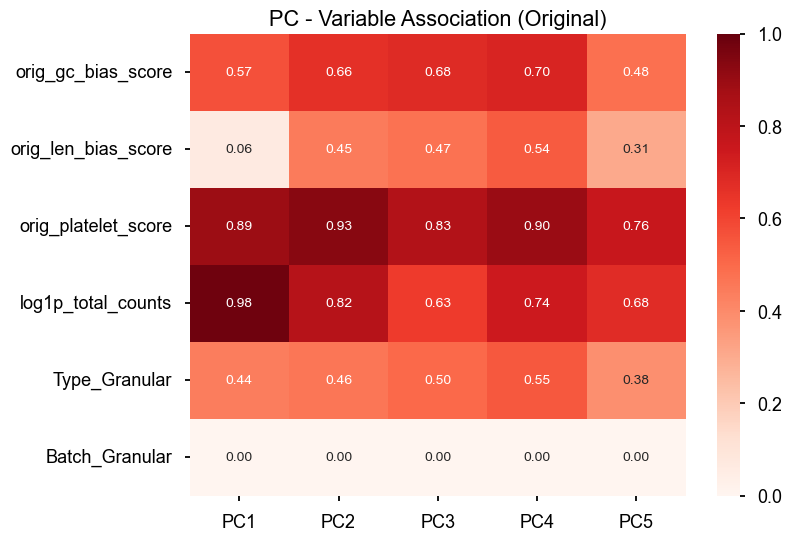

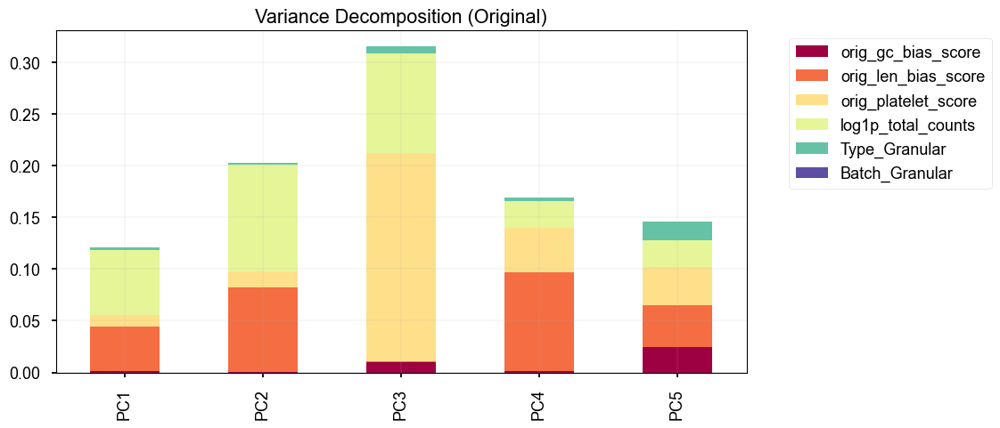

--- [Step 6] Partial Correlation Analysis (Original) ---


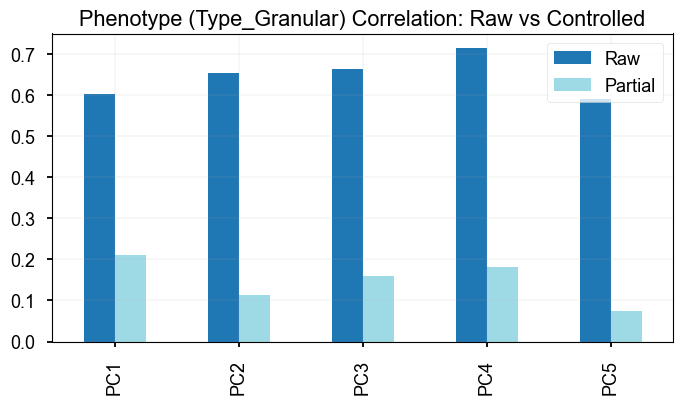

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 7 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


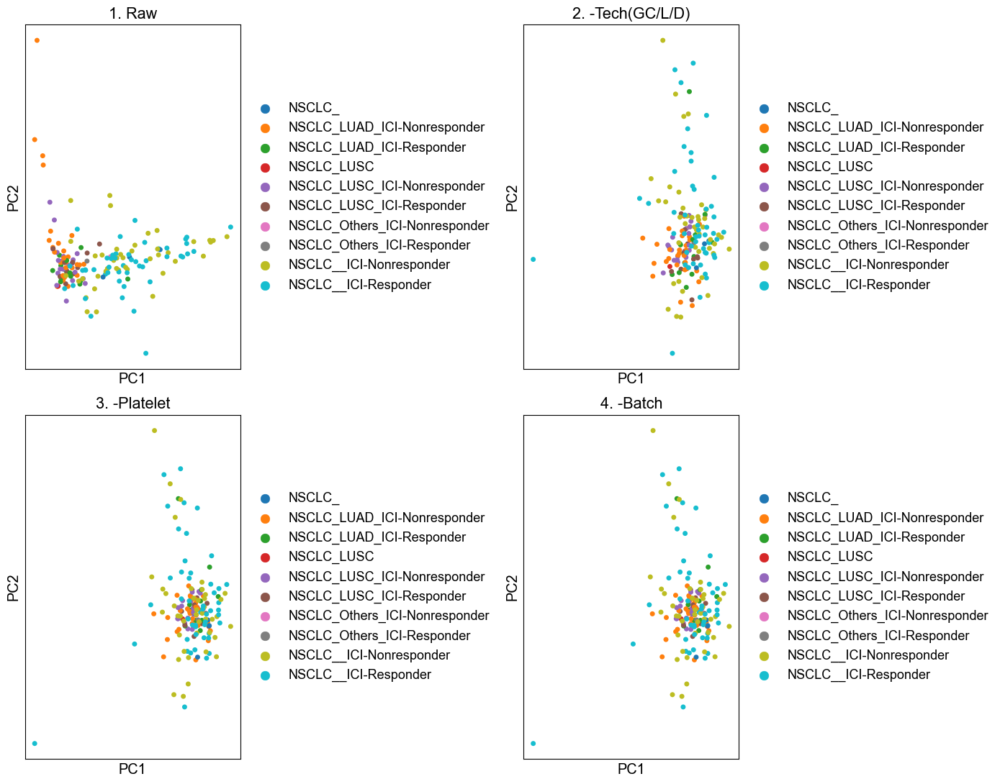

Displaying Metric Evolution (Spearman/ANOVA)...


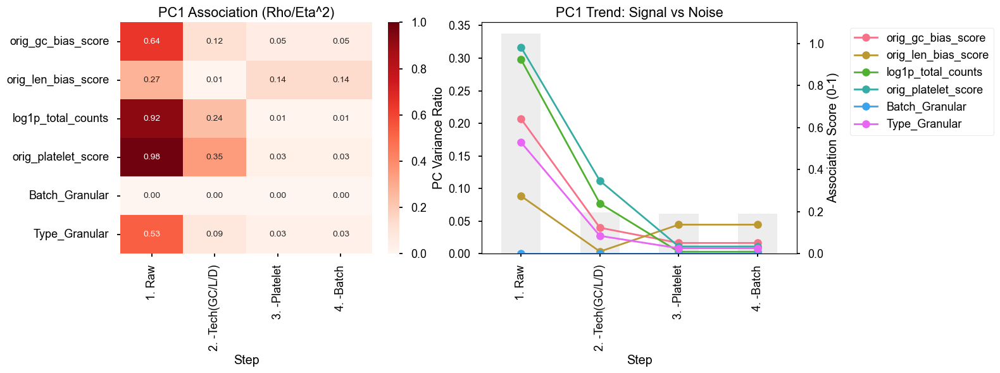

--- Finished Analysis for RPMseq15 ---


In [48]:
seq_ids = ['RPMseq10', 'RPMseq12', 'RPMseq13', 'RPMseq14', 'RPMseq15']

for sid in seq_ids:
    print(f"\n{'='*30}\n Processing: {sid}\n{'='*30}")
    adata_sub = adata[adata.obs.Seq_ID == sid].copy()
    sc.pp.filter_genes(adata_sub, min_cells=1)
    if sid == 'RPMseq15':
        temp_raw_sum = adata_sub.layers['counts'].sum(axis=1)
        cutoff = np.quantile(temp_raw_sum, 0.1)
        print(f"[{sid}] Removing samples with total counts < {cutoff:.2f}")
        adata_sub = adata_sub[temp_raw_sum >= cutoff].copy()
        if 'Responder' in adata_sub.obs.columns:
            adata_sub.obs['Responder'] = adata_sub.obs['Responder'].astype('category')

    pipeline = RNASeqQCPipeline(
        adata=adata_sub,
        gene_type_col='GeneType',
        target_types=['protein_coding'],
        phenotype_col='Type_Granular', 
        batch_col='Batch_Granular',
        gc_col='GC_Percent',
        len_col='Length',
        platelet_col='is_platelet'
    )
    pipeline.run_pca_diagnostics()
    pipeline.analyze_pc_associations()
    pipeline.analyze_variance_decomposition()
    pipeline.analyze_partial_correlation()
    pipeline.run_cascade_analysis()

    print(f"--- Finished Analysis for {sid} ---")

### Bias-Label Relationship

In [ ]:
adata = sc.read_h5ad("./Data/RPM/Processed/Merged.h5ad")
adata.obs['Type_Granular'][adata.obs['Type_Granular'].str.contains('NC')] = 'NC'
pipeline = RNASeqQCPipeline(
    adata=adata,              
    gene_type_col='GeneType',       
    target_types=['protein_coding'], 
    phenotype_col='Type',           
    batch_col='Batch_Granular',              
    gc_col='GC_Percent',           
    len_col='Length',              
    platelet_col='is_platelet'    
)
pipeline.set_layer('Standard_LogCPM')

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu, kruskal
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def bias_label_relationship(df_meta, bias_list, condition_col):
    df_bias = df_meta[bias_list]
    valid_mask = df_bias.notna().all(axis=1)
    df_meta = df_meta[valid_mask]
    df_bias = df_bias[valid_mask]

    scaler = StandardScaler()
    X_bias_scaled = scaler.fit_transform(df_bias)
    pca = PCA(n_components=1)
    pc1 = pca.fit_transform(X_bias_scaled).flatten()
    df_meta['Bias_Score'] = pc1
    loadings = pca.components_[0]
    print("\n[Bias PC1 Loadings]")
    for col, load in zip(bias_list, loadings):
        print(f" - {col}: {load:.3f}")
        
    groups = df_meta[condition_col].unique()
    try:
        groups = sorted(groups) # 가능하다면 정렬
    except:
        pass
    n_groups = len(groups)
    
    if n_groups < 2 :
        return()
    
    plt.figure(figsize=(1+n_groups, 7))
    sns.boxplot(data=df_meta, x=condition_col, y='Bias_Score', 
                order=groups, palette='Set2', width=0.5, showfliers=True)
    sns.swarmplot(data=df_meta, x=condition_col, y='Bias_Score', 
                  order=groups, color='black', alpha=0.5, s=4)
    y_max = df_meta['Bias_Score'].max()
    y_min = df_meta['Bias_Score'].min()
    y_range = y_max - y_min
    
    if n_groups == 2:
        g1 = df_meta[df_meta[condition_col] == groups[0]]['Bias_Score']
        g2 = df_meta[df_meta[condition_col] == groups[1]]['Bias_Score']
        
        stat, p_val = mannwhitneyu(g1, g2)
        print(f" - Mann-Whitney U Test: p-value = {p_val:.4e}")
        
        # 시각화: 브라켓 그리기
        x1, x2 = 0, 1
        y_h = y_max + y_range * 0.05
        plt.plot([x1, x1, x2, x2], [y_h, y_h + y_range*0.02, y_h + y_range*0.02, y_h], lw=1.5, c='k')
        
        significance = "ns"
        if p_val < 0.001: significance = "***"
        elif p_val < 0.01: significance = "**"
        elif p_val < 0.05: significance = "*"
            
        plt.text((x1+x2)*0.5, y_h + y_range*0.02, f"p={p_val:.3f}\n{significance}", 
                 ha='center', va='bottom', fontweight='bold')
        plt.title(f"Bias Score by {condition_col} (MWU Test)")

    # Case B: 3개 이상 그룹 (Kruskal-Wallis Test)
    elif n_groups > 2:
        group_data = [df_meta[df_meta[condition_col] == g]['Bias_Score'].values for g in groups]
        stat, p_val = kruskal(*group_data)
        print(f" - Kruskal-Wallis Test: p-value = {p_val:.4e}")
        
        significance = "Significant" if p_val < 0.05 else "Not Significant"
        plt.title(f"Bias Score by {condition_col}\n(Kruskal-Wallis p={p_val:.3e}, {significance})")

    else:
        plt.title(f"Bias Score Distribution (Single Group: {groups[0]})")

    plt.ylabel("Bias Composite Score (PC1)")
    plt.ylim(y_min - y_range*0.1, y_max + y_range*0.25) # 위쪽 여백 확보
    plt.grid(alpha=0.2)
    plt.xticks(rotation=90, ha='right')
    plt.tight_layout()
    plt.show()

RPMseq10

[Bias PC1 Loadings]
 - gc_bias_score: 0.514
 - len_bias_score: -0.486
 - platelet_score: 0.597
 - log1p_total_counts: 0.379
 - Kruskal-Wallis Test: p-value = 5.7270e-02


/tmp/ipykernel_58089/3617343194.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_meta, x=condition_col, y='Bias_Score',


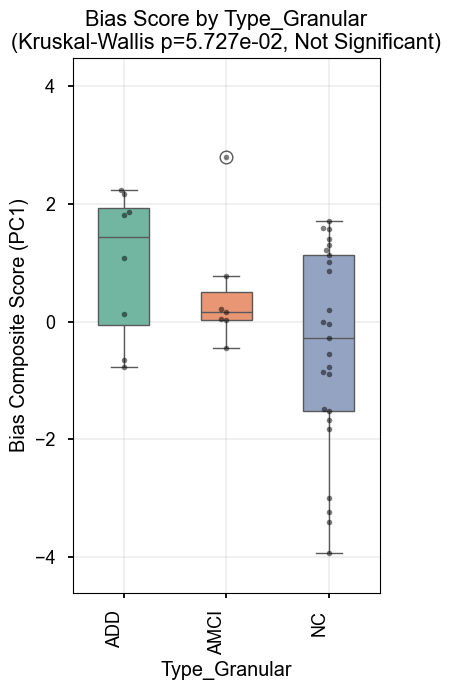

RPMseq14

[Bias PC1 Loadings]
 - gc_bias_score: 0.577
 - len_bias_score: -0.321
 - platelet_score: 0.597
 - log1p_total_counts: 0.456
 - Mann-Whitney U Test: p-value = 1.5663e-02


/tmp/ipykernel_58089/3617343194.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_meta, x=condition_col, y='Bias_Score',


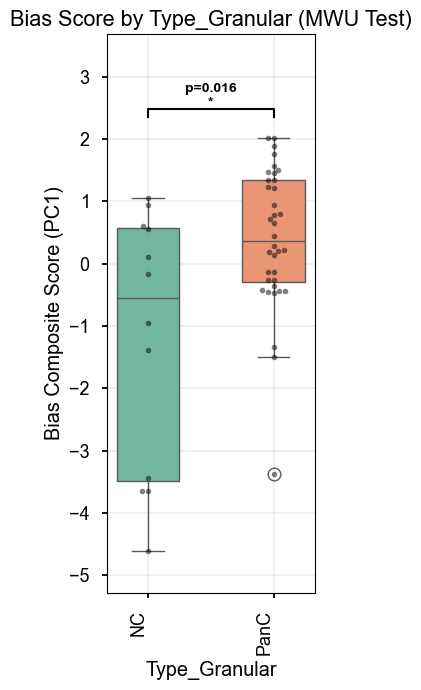

RPMseq12

[Bias PC1 Loadings]
 - gc_bias_score: 0.524
 - len_bias_score: -0.415
 - platelet_score: 0.582
 - log1p_total_counts: 0.463


/tmp/ipykernel_58089/3617343194.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_meta, x=condition_col, y='Bias_Score',


 - Kruskal-Wallis Test: p-value = 4.4333e-01


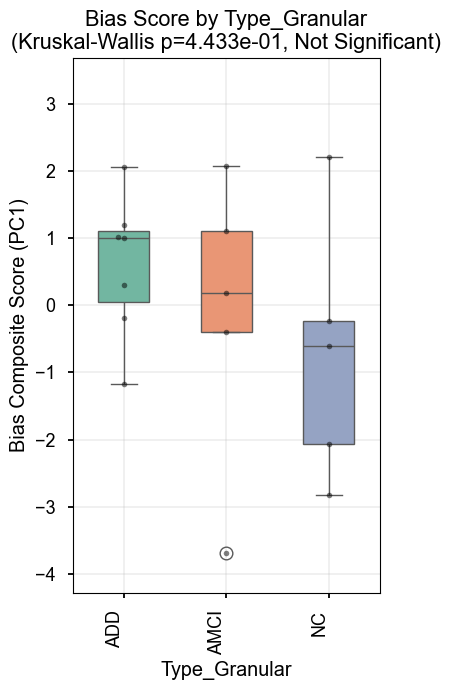

RPMseq13

[Bias PC1 Loadings]
 - gc_bias_score: 0.288
 - len_bias_score: -0.488
 - platelet_score: 0.638
 - log1p_total_counts: 0.522


/tmp/ipykernel_58089/3617343194.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_meta, x=condition_col, y='Bias_Score',


 - Kruskal-Wallis Test: p-value = 3.4564e-01


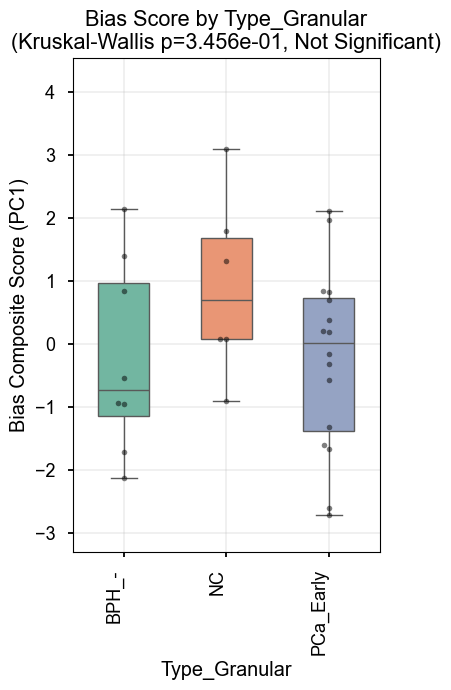

RPMseq16

[Bias PC1 Loadings]
 - gc_bias_score: 0.464
 - len_bias_score: -0.624
 - platelet_score: 0.625
 - log1p_total_counts: 0.069
RPMseq15

[Bias PC1 Loadings]
 - gc_bias_score: 0.561
 - len_bias_score: 0.472
 - platelet_score: 0.400
 - log1p_total_counts: 0.550


/tmp/ipykernel_58089/3617343194.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_meta, x=condition_col, y='Bias_Score',


 - Kruskal-Wallis Test: p-value = 1.3542e-11


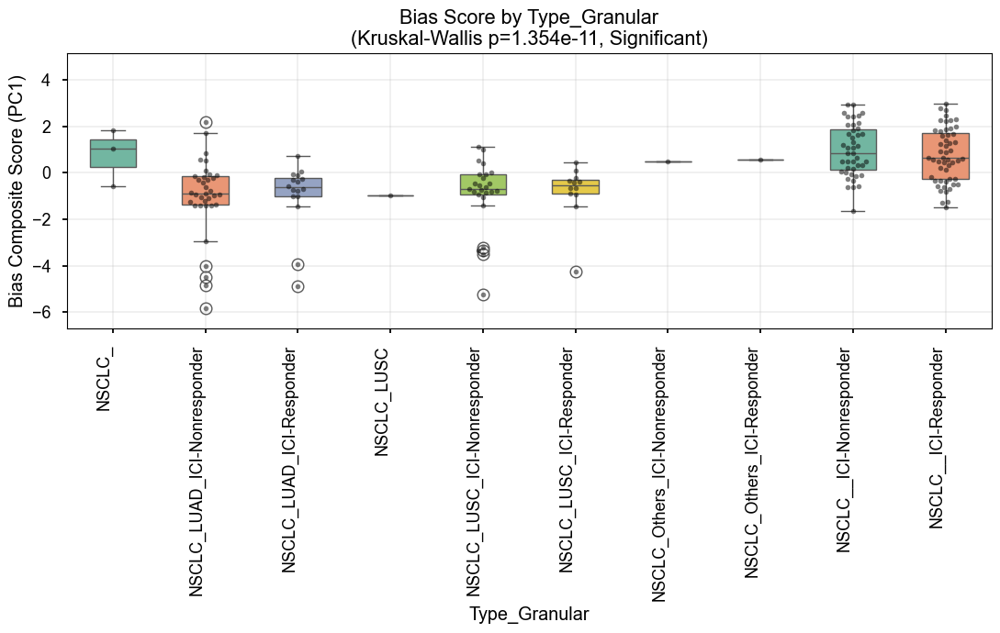

In [19]:
obs = pipeline.adata.obs.copy()
bias_list = pipeline.get_metric_keys()
for seqid in obs['Seq_ID'].unique():
    print(seqid)
    try: 
        df_meta = obs.loc[obs['Seq_ID'] == seqid,:]
        bias_label_relationship(df_meta, bias_list, condition_col='Type_Granular')
    except :
        print("Skipped.", seqid)

RPMseq10
=== Bias Check [Binary]: NC vs Others ===
 - Data: N=40 (Class dist: {np.int64(0): np.int64(25), np.int64(1): np.int64(15)})
 - Features: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts']


/tmp/ipykernel_58089/131725670.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_res, x='Model', y='AUC', palette=my_pal,


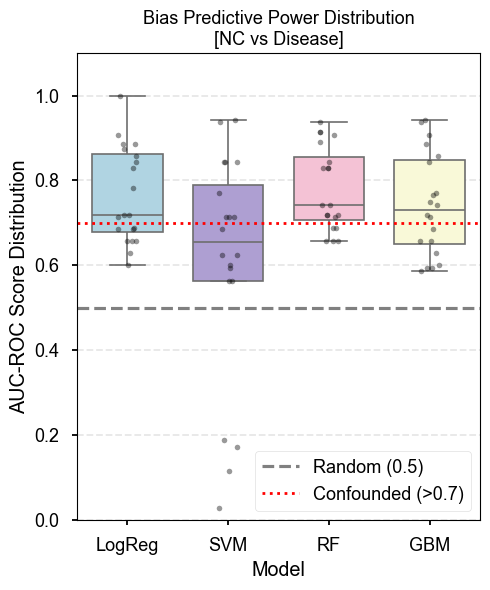

RPMseq12
=== Bias Check [Binary]: NC vs Others ===
 - Data: N=17 (Class dist: {np.int64(0): np.int64(5), np.int64(1): np.int64(12)})
 - Features: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts']


/tmp/ipykernel_58089/131725670.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_res, x='Model', y='AUC', palette=my_pal,


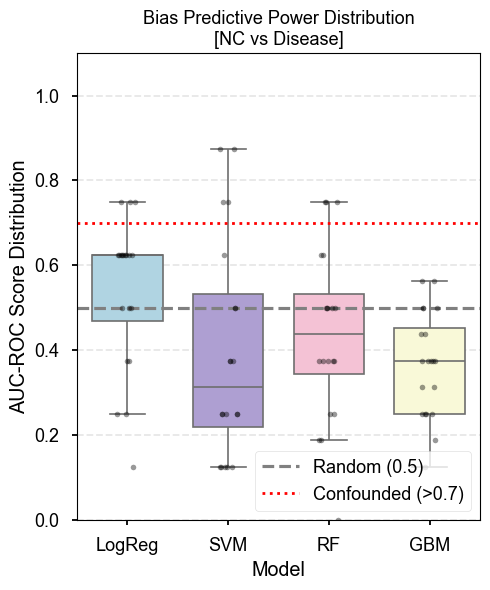

RPMseq13
=== Bias Check [Binary]: NC vs Others ===
 - Data: N=30 (Class dist: {np.int64(0): np.int64(6), np.int64(1): np.int64(24)})
 - Features: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts']


/tmp/ipykernel_58089/131725670.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_res, x='Model', y='AUC', palette=my_pal,


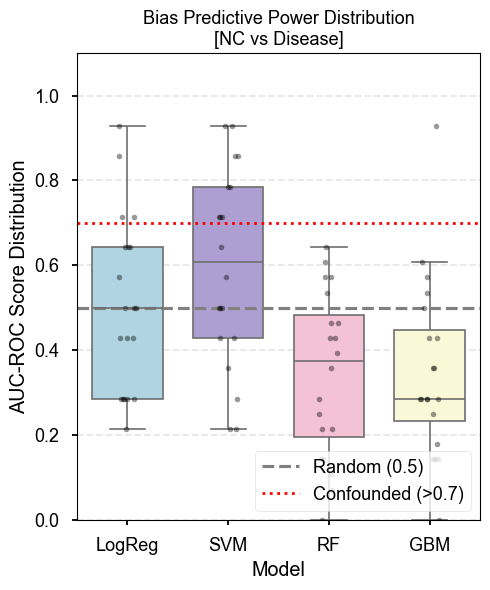

RPMseq14
=== Bias Check [Binary]: NC vs Others ===
 - Data: N=48 (Class dist: {np.int64(0): np.int64(12), np.int64(1): np.int64(36)})
 - Features: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts']


/tmp/ipykernel_58089/131725670.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_res, x='Model', y='AUC', palette=my_pal,


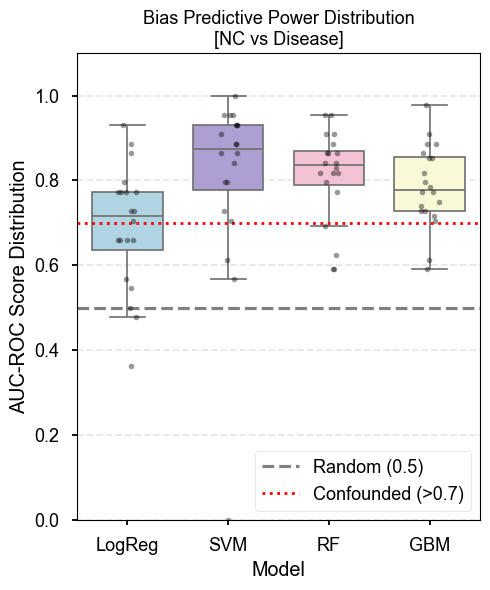

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC

# Metrics & Utils
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import roc_auc_score
from sklearn.pipeline import make_pipeline

def check_bias_power_dist(df_meta, bias_list, condition_col, 
                          control_label='NC', task_type='binary'):
    df_sub = df_meta[bias_list + [condition_col]].dropna().copy()
    
    if len(df_sub) < 15:
        print("[Error] 샘플 수가 너무 적습니다 (N < 15).")
        return

    X = df_sub[bias_list].values
    original_y = df_sub[condition_col].values

    if task_type == 'binary':
        print(f"=== Bias Check [Binary]: {control_label} vs Others ===")
        y = np.where(original_y == control_label, 0, 1)
        classes = ['Control', 'Disease']
    else:
        print(f"=== Bias Check [Multiclass]: {np.unique(original_y)} ===")
        le = LabelEncoder()
        y = le.fit_transform(original_y)
        classes = le.classes_
        if len(classes) == 2:
            print("[Info] 클래스가 2개뿐이므로 Binary 로직으로 수행합니다.")
            task_type = 'binary'

    unique, counts = np.unique(y, return_counts=True)
    print(f" - Data: N={len(y)} (Class dist: {dict(zip(unique, counts))})")
    print(f" - Features: {bias_list}")

    if np.min(counts) < 2:
        print("[Error] 특정 클래스 샘플 수 부족.")
        return

    models = {
        'LogReg': make_pipeline(StandardScaler(), LogisticRegression(max_iter=1000, random_state=42)),
        'SVM': make_pipeline(StandardScaler(), SVC(probability=True, kernel='rbf', random_state=42)), # AUC를 위해 probability=True 필수
        'RF': RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42),
        'GBM': GradientBoostingClassifier(n_estimators=50, max_depth=3, random_state=42)
    }
    raw_results = [] 
    n_repeats = 20
    sss = StratifiedShuffleSplit(n_splits=n_repeats, test_size=0.3, random_state=42)
    for name, model in models.items():
        for i, (train_ix, test_ix) in enumerate(sss.split(X, y)):
            X_train, X_test = X[train_ix], X[test_ix]
            y_train, y_test = y[train_ix], y[test_ix]
            
            if task_type == 'multiclass':
                if len(np.unique(y_test)) < len(unique): continue 
            else:
                if len(np.unique(y_test)) < 2: continue

            try:
                model.fit(X_train, y_train)
                probs = model.predict_proba(X_test)
                
                if task_type == 'multiclass':
                    score = roc_auc_score(y_test, probs, multi_class='ovr', average='macro')
                else:
                    score = roc_auc_score(y_test, probs[:, 1])
                
                # [핵심 변경] 평균이 아니라 개별 기록 저장
                raw_results.append({
                    'Model': name,
                    'AUC': score,
                    'Iteration': i
                })
            except Exception as e:
                continue
    
    df_res = pd.DataFrame(raw_results)
    plt.figure(figsize=(5, 6))
    my_pal = {'LogReg': '#A8D8EA', 'SVM': '#AA96DA', 'RF': '#FCBAD3', 'GBM': '#FFFFD2'}
    sns.boxplot(data=df_res, x='Model', y='AUC', palette=my_pal, 
                width=0.7, showfliers=False, linewidth=1.2)
    sns.stripplot(data=df_res, x='Model', y='AUC', color='black', 
                  alpha=0.4, jitter=True, size=4)
    
    plt.axhline(0.5, color='gray', linestyle='--', label='Random (0.5)')
    plt.axhline(0.7, color='red', linestyle=':', linewidth=2, label='Confounded (>0.7)')
    mode_title = "NC vs Disease" if task_type == 'binary' else "Multiclass (OVR)"
    plt.title(f"Bias Predictive Power Distribution\n[{mode_title}]", fontsize=13)
    plt.ylabel("AUC-ROC Score Distribution")
    plt.ylim(0, 1.1)
    plt.legend(loc='lower right', frameon=True)
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    summary = df_res.groupby('Model')['AUC'].agg(['mean', 'std', 'min', 'max']).sort_values('mean', ascending=False)
    return summary

res_list = []
for seqid in ['RPMseq10','RPMseq12','RPMseq13','RPMseq14']:
    print(seqid)
    df_meta = obs.loc[obs['Seq_ID'] == seqid,:]
    res=  check_bias_power_dist(df_meta, bias_list, condition_col='Type_Granular', task_type='binary')
    res['SeqID'] = seqid
    res_list.append(res)

In [26]:
pd.concat(res_list).reset_index().sort_values(['SeqID','Model'])

,Model,mean,std,min,max,SeqID
2,GBM,0.741808,0.119624,0.585714,0.942857,RPMseq10
1,LogReg,0.763571,0.112886,0.600000,1.000000,RPMseq10
0,RF,0.779710,0.097639,0.656250,0.937500,RPMseq10
3,SVM,0.604107,0.271997,0.028571,0.942857,RPMseq10
7,GBM,0.365625,0.123802,0.125000,0.562500,RPMseq12
4,LogReg,0.537500,0.177241,0.125000,0.750000,RPMseq12
5,RF,0.437500,0.203788,0.000000,0.750000,RPMseq12
6,SVM,0.393750,0.257375,0.125000,0.875000,RPMseq12
10,GBM,0.350000,0.209085,0.000000,0.928571,RPMseq13
9,LogReg,0.507143,0.204540,0.214286,0.928571,RPMseq13


## Case Study : Normalization Methods

### Target : Pancrea Cancer Cohort

In [2]:
adata = sc.read_h5ad("./Data/RPM/Processed/Merged.h5ad")
target_layers = [ 'Standard_LogCPM', 'log_TMM', 'log_TPM', 'log_FPKM', 'EDA+RUVg_k1', 'EDA+RUVg_k2', 'EDA+RUVg_k3', 'EDA_Full', 'RUVg_k1', 'RUVg_k2', 'RUVg_k3']
adata.obs['Type_Granular'][adata.obs['Type_Granular'].str.contains('NC')] = 'NC'
adata_sub = adata[(adata.obs['Seq_ID'] == 'RPMseq14')]

--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 20097 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
Start Benchmarking across 11 methods...


  >>> Analyzing Method: Standard_LogCPM
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


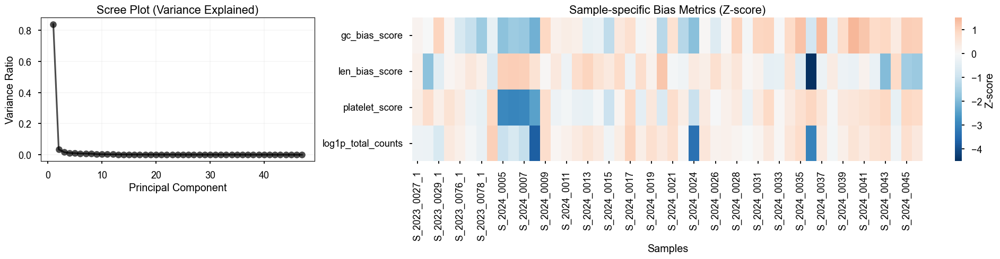

--- [Step 2-2] PCA Scatter Plots ---


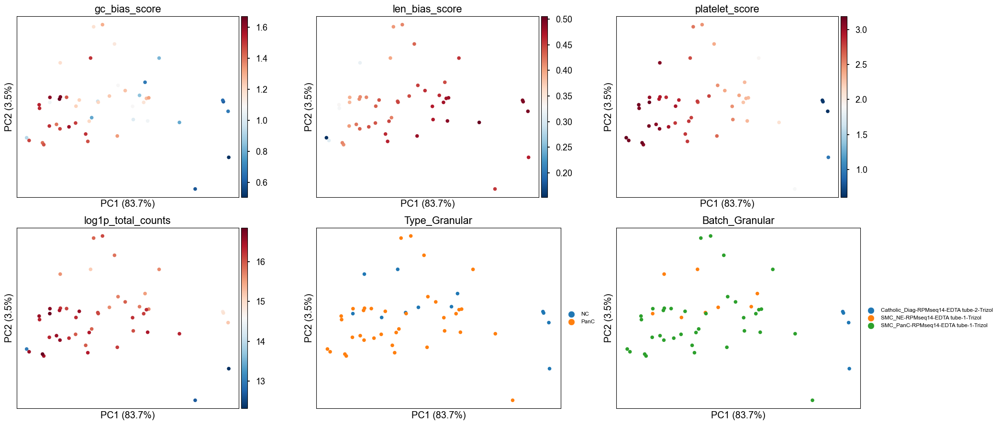

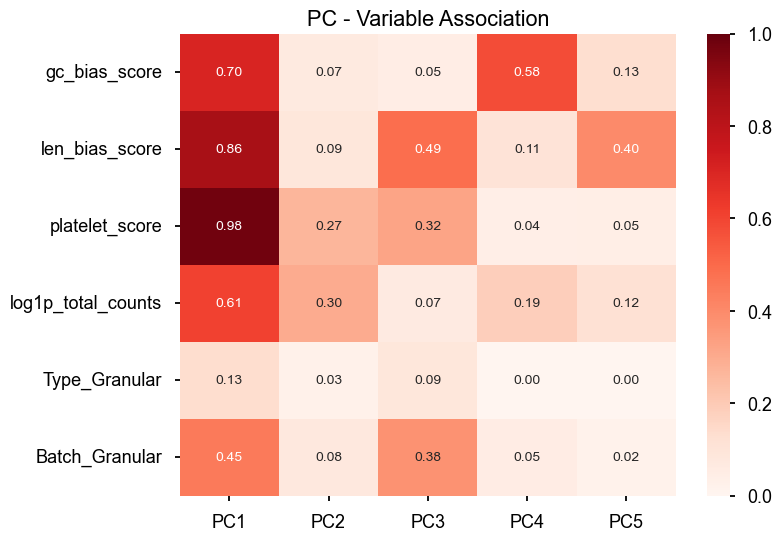

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


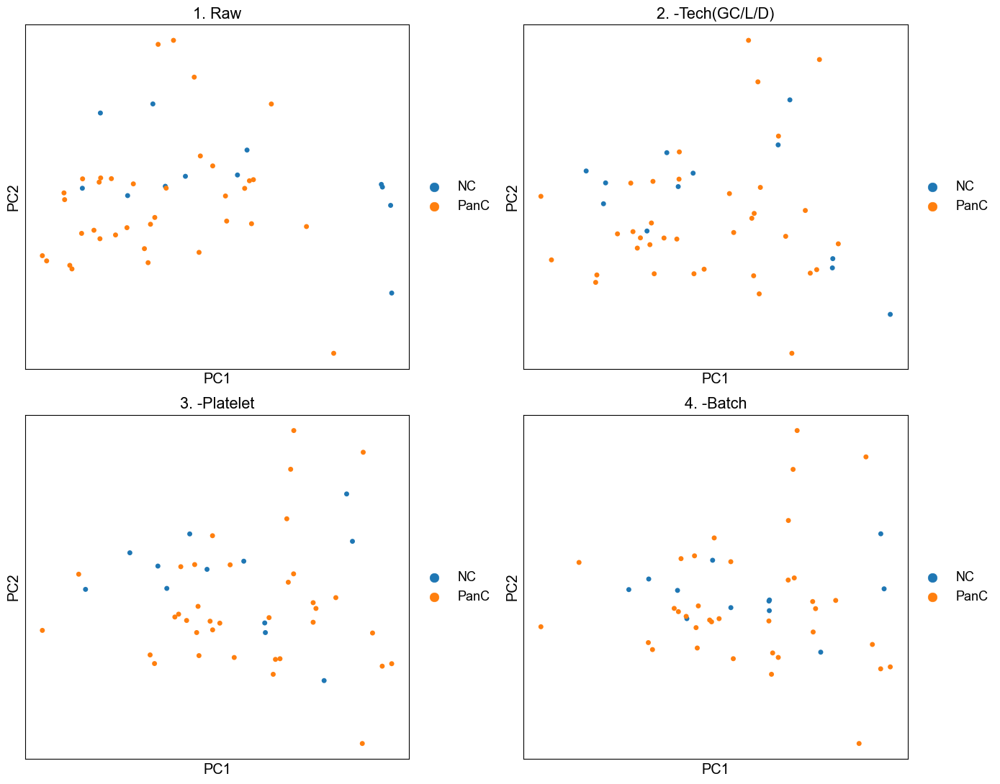

Displaying Metric Evolution (Spearman/ANOVA)...


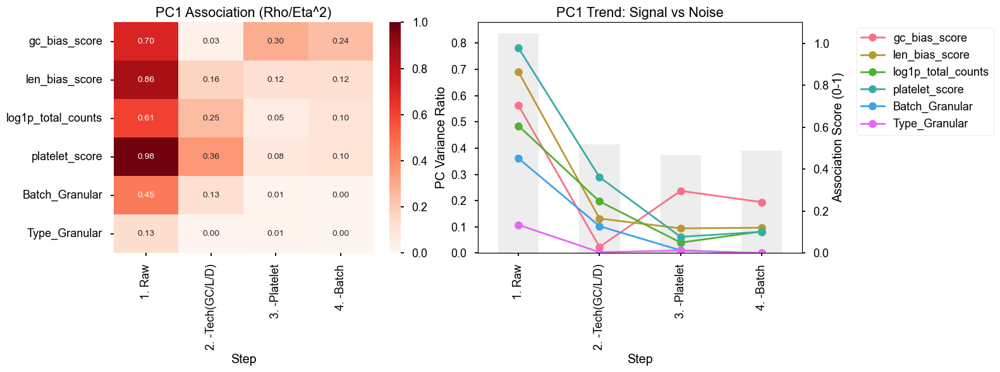


  >>> Analyzing Method: log_TMM
--- Set Layer: Switching to 'log_TMM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


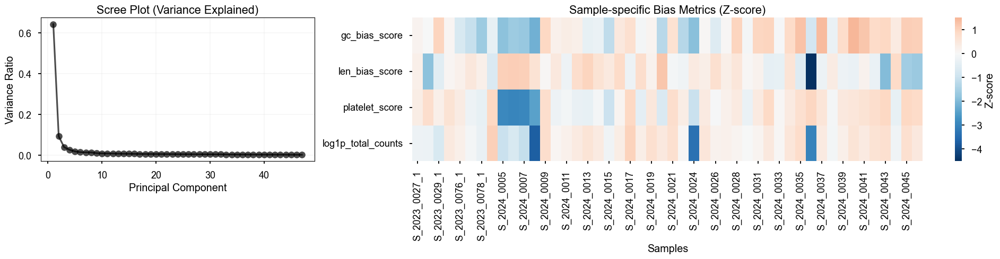

--- [Step 2-2] PCA Scatter Plots ---


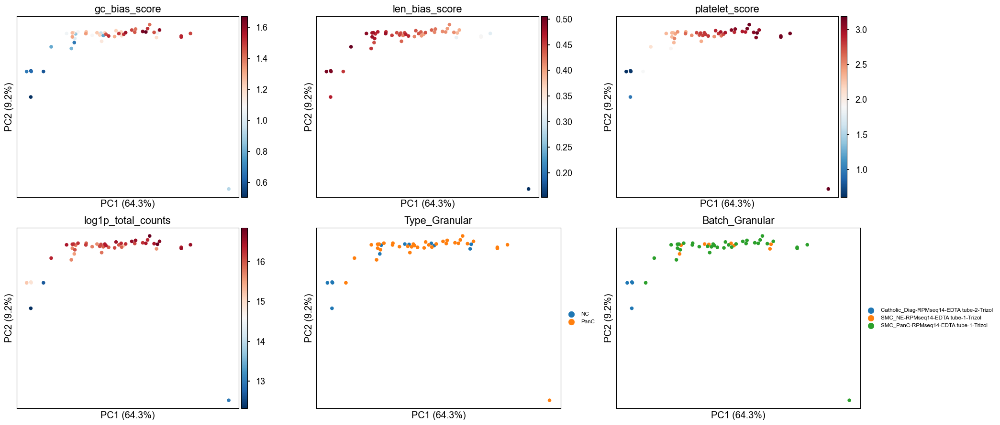

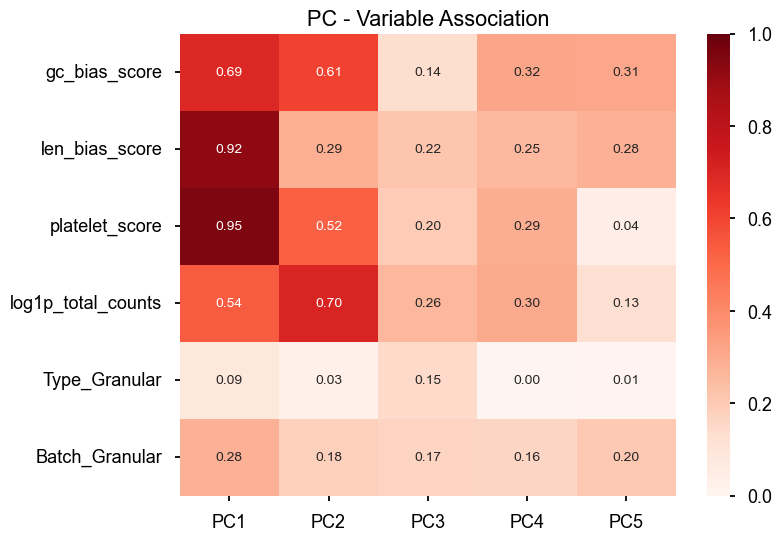

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


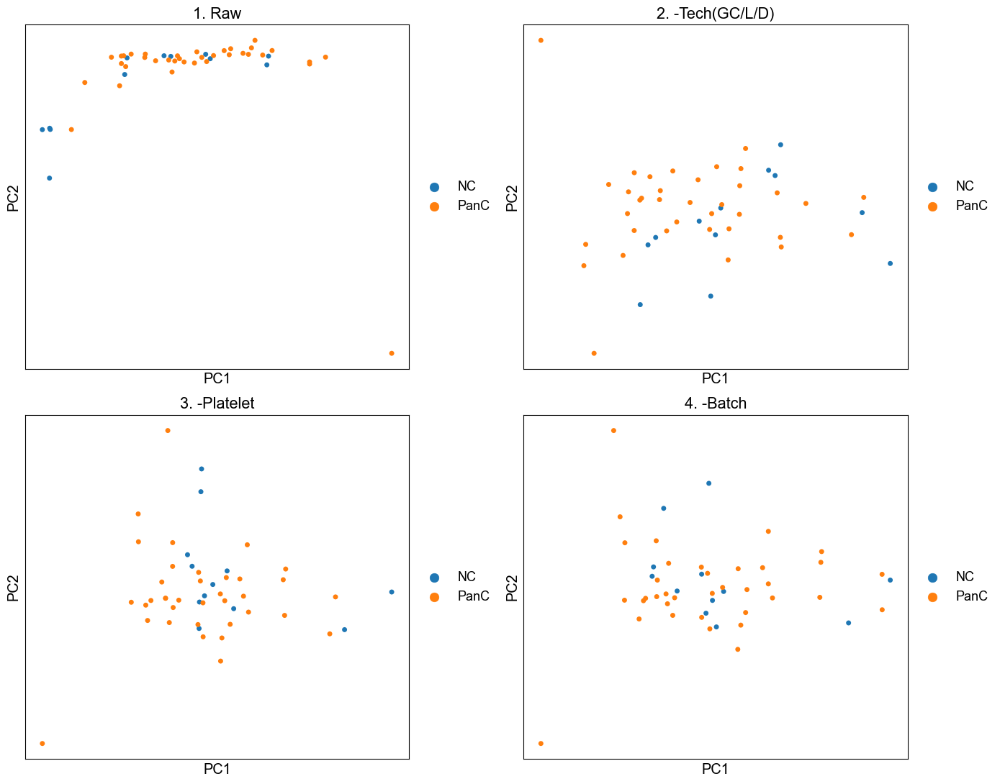

Displaying Metric Evolution (Spearman/ANOVA)...


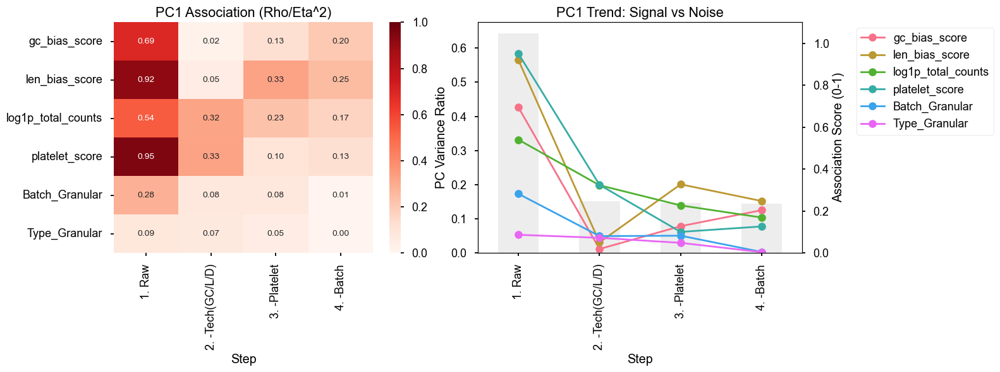


  >>> Analyzing Method: log_TPM
--- Set Layer: Switching to 'log_TPM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


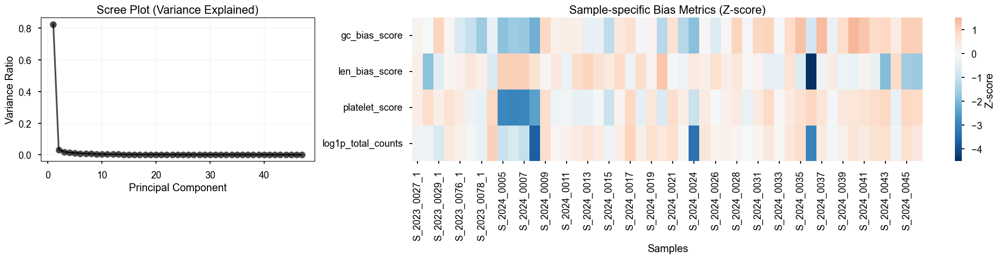

--- [Step 2-2] PCA Scatter Plots ---


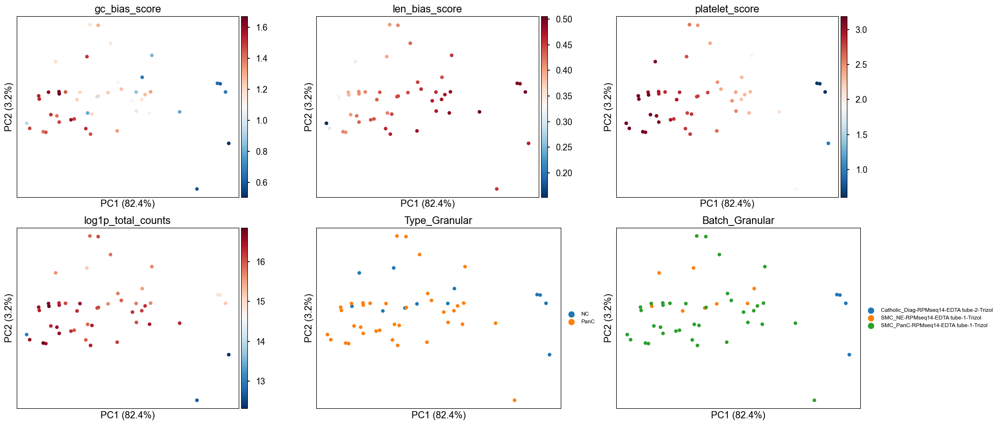

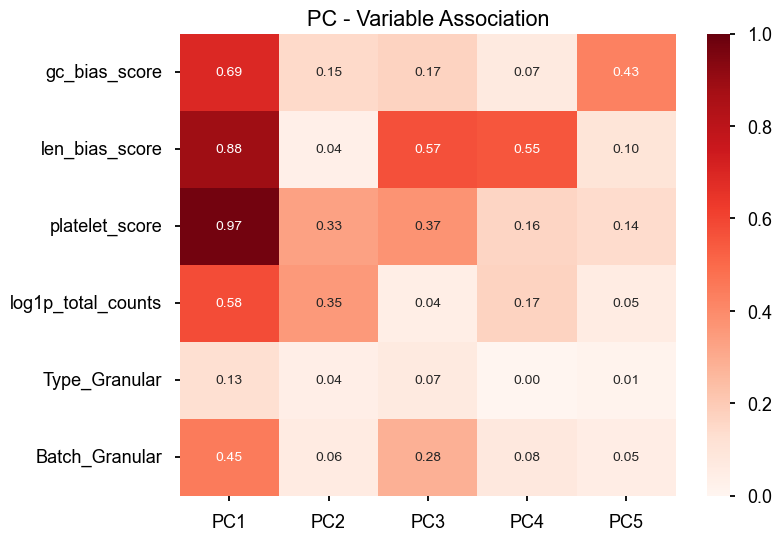

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


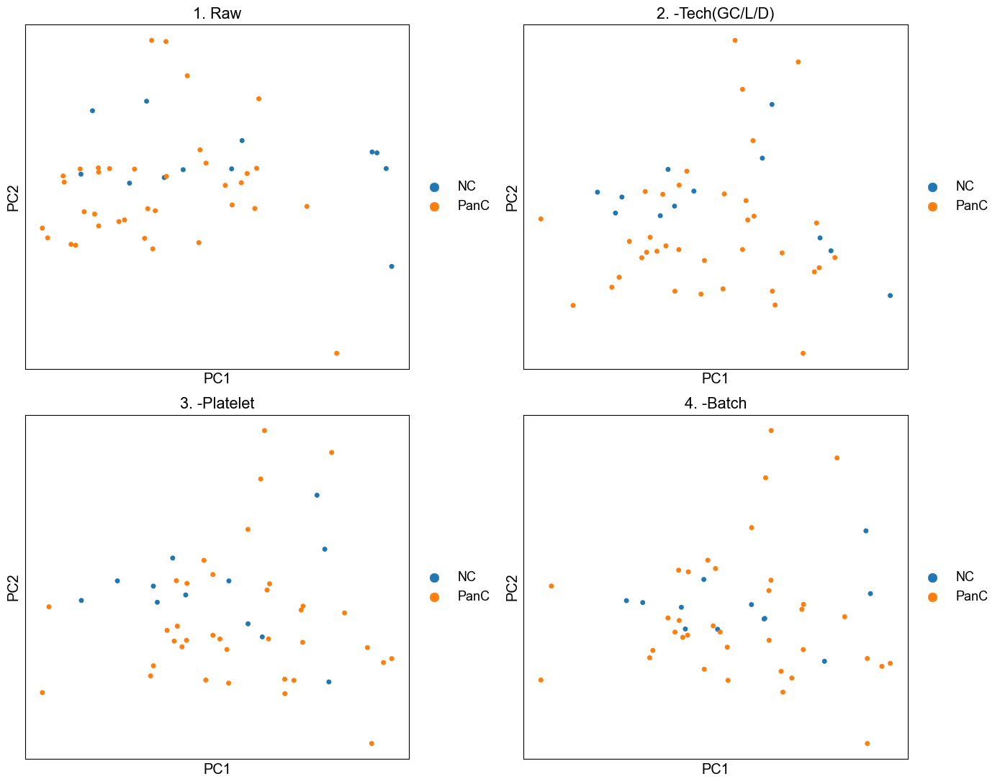

Displaying Metric Evolution (Spearman/ANOVA)...


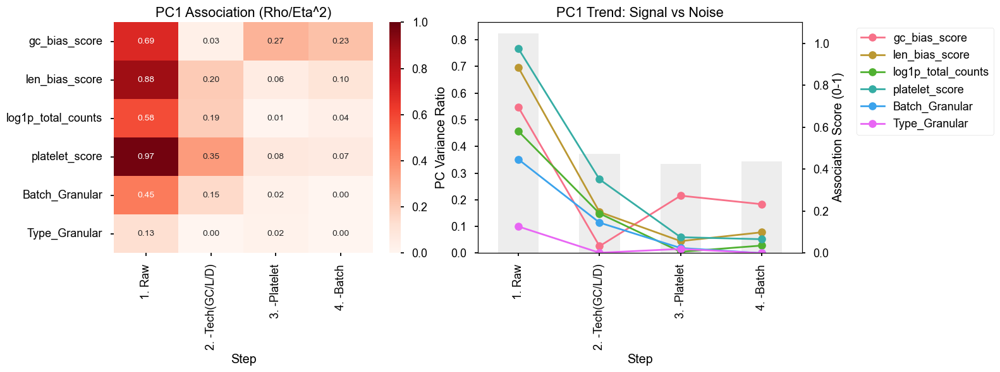


  >>> Analyzing Method: log_FPKM
--- Set Layer: Switching to 'log_FPKM' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


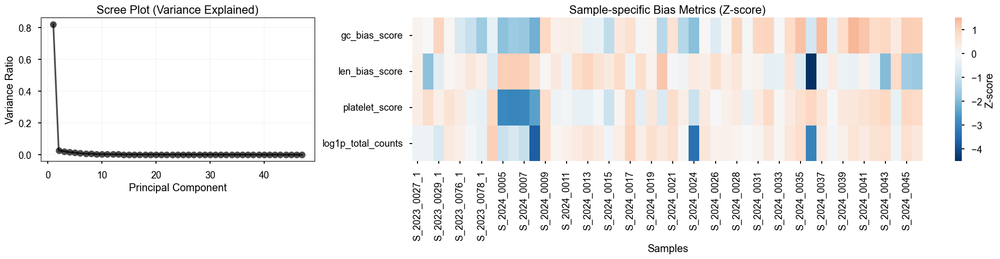

--- [Step 2-2] PCA Scatter Plots ---


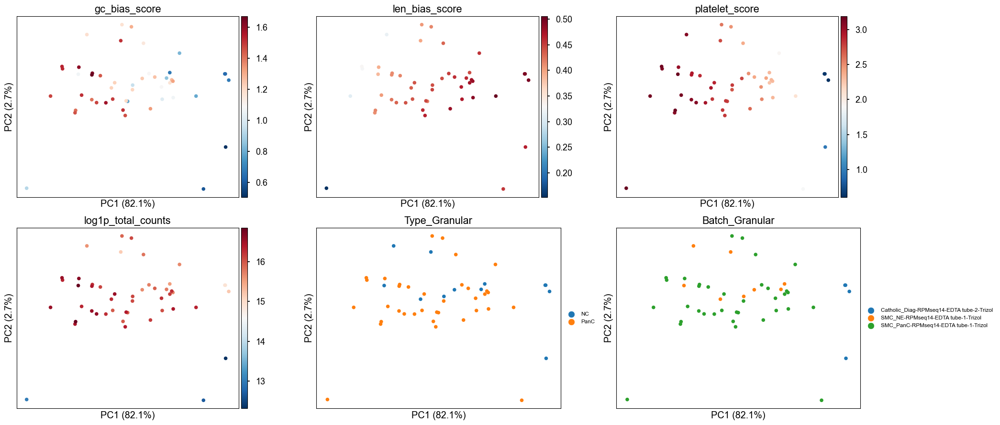

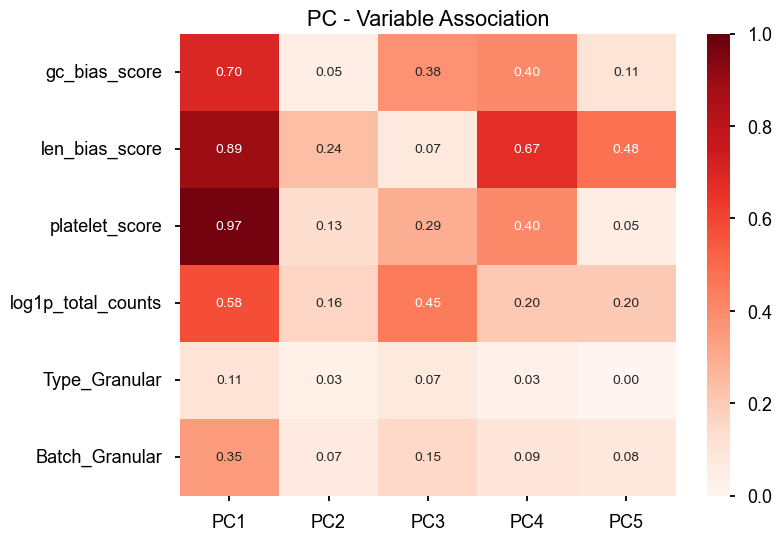

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


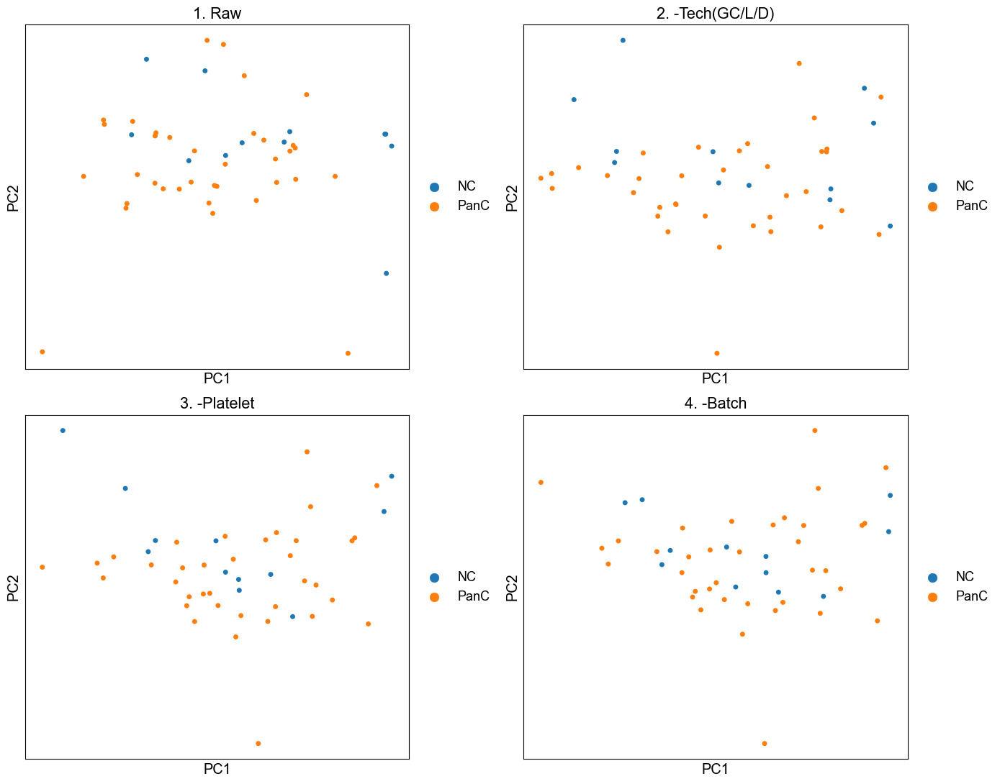

Displaying Metric Evolution (Spearman/ANOVA)...


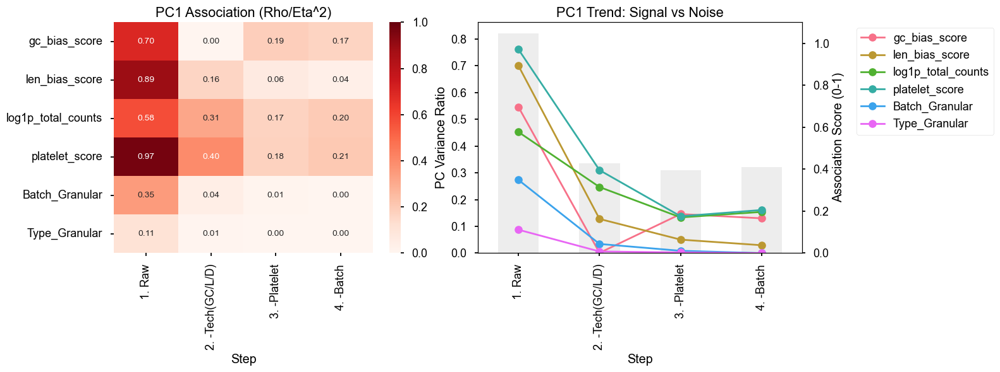


  >>> Analyzing Method: EDA+RUVg_k1
--- Set Layer: Switching to 'EDA+RUVg_k1' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


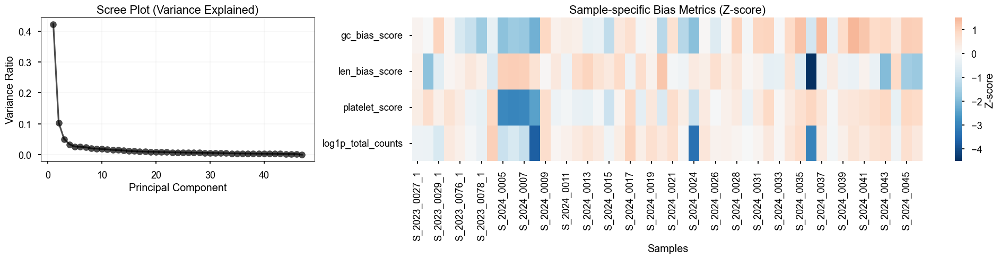

--- [Step 2-2] PCA Scatter Plots ---


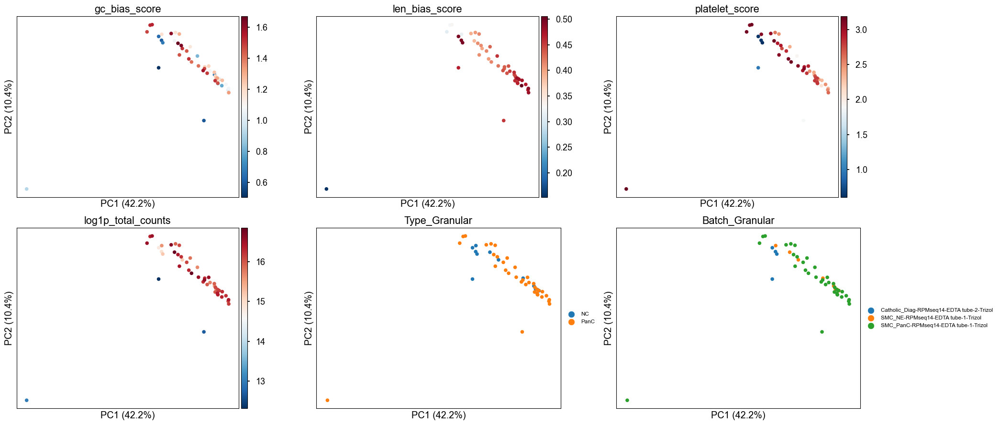

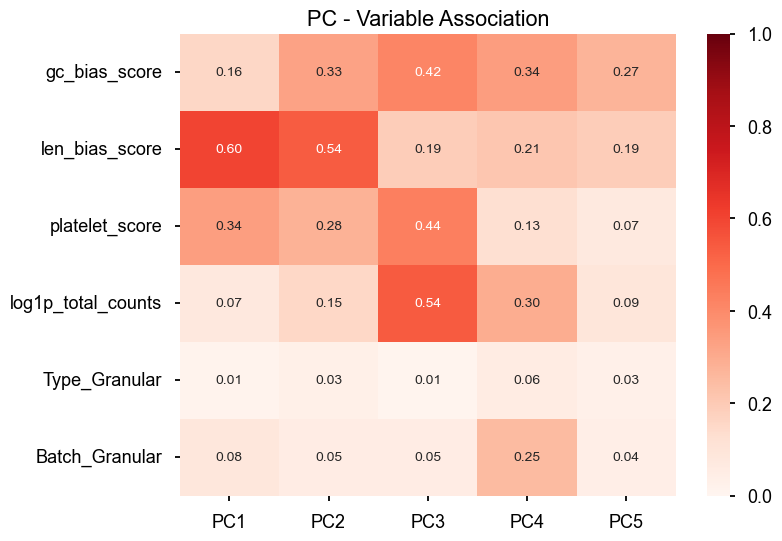

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 747 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


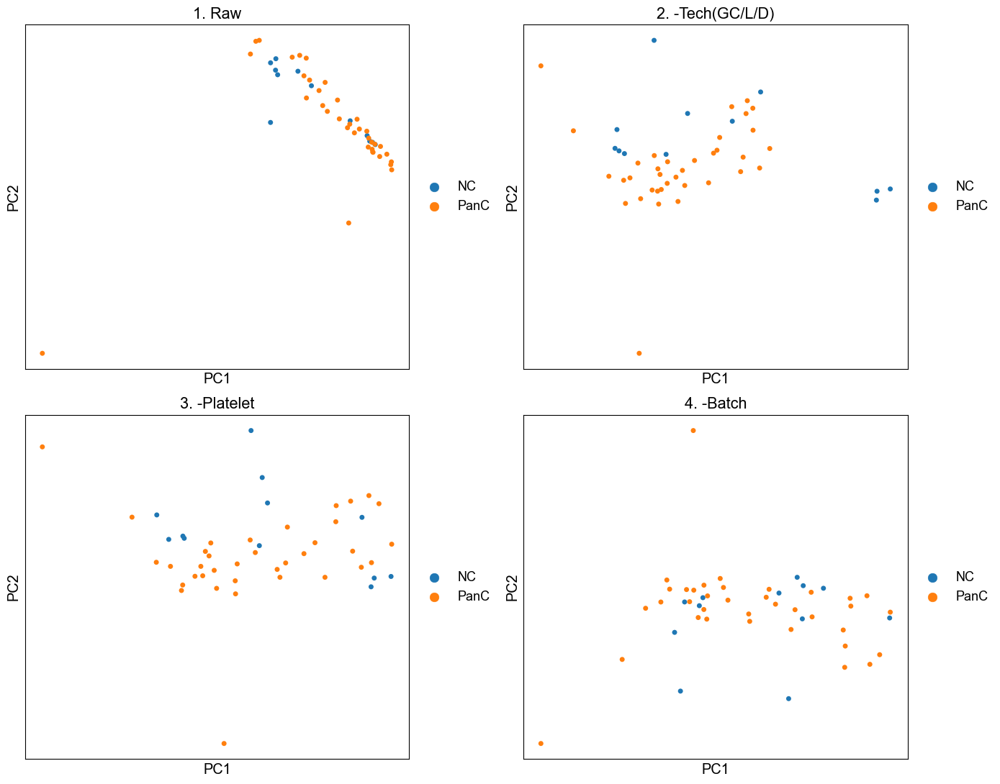

Displaying Metric Evolution (Spearman/ANOVA)...


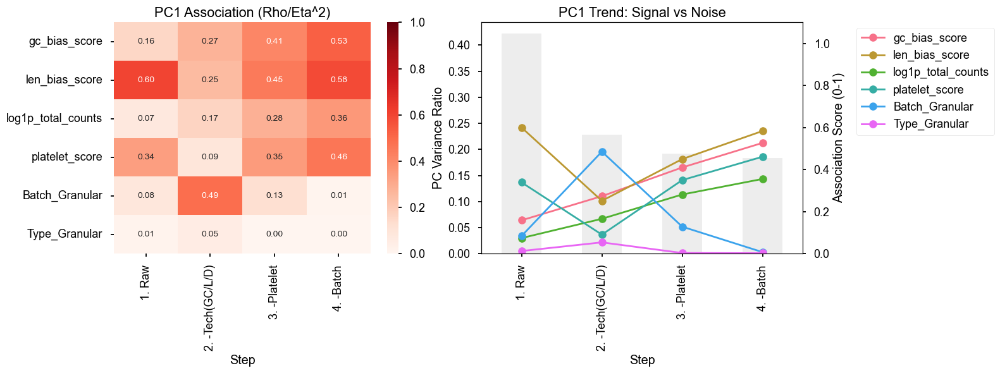


  >>> Analyzing Method: EDA+RUVg_k2
--- Set Layer: Switching to 'EDA+RUVg_k2' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


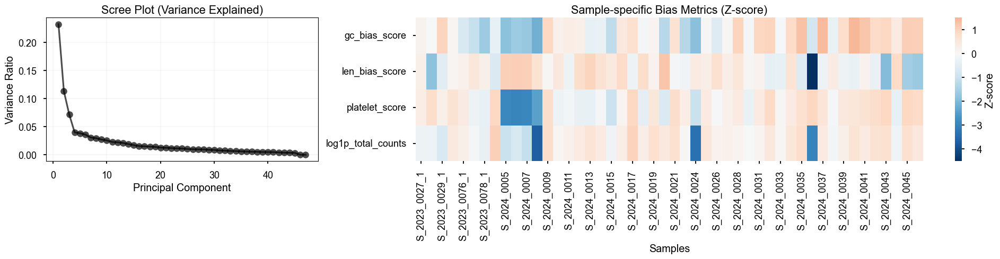

--- [Step 2-2] PCA Scatter Plots ---


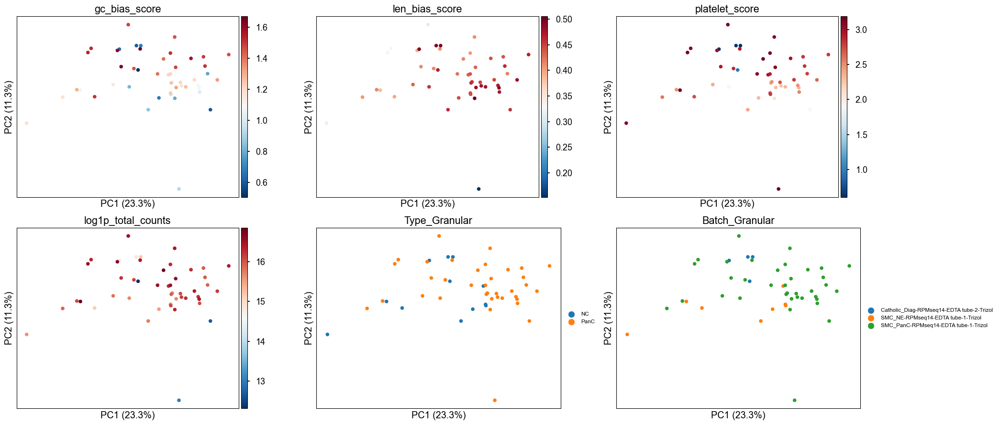

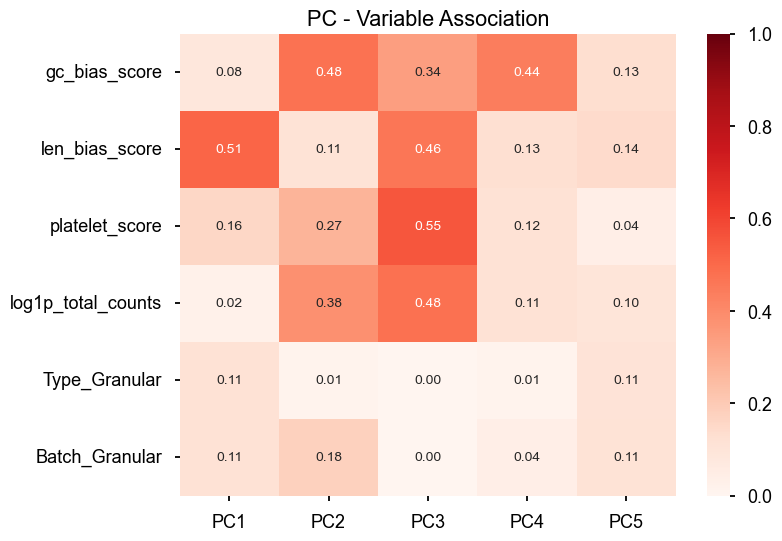

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 747 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


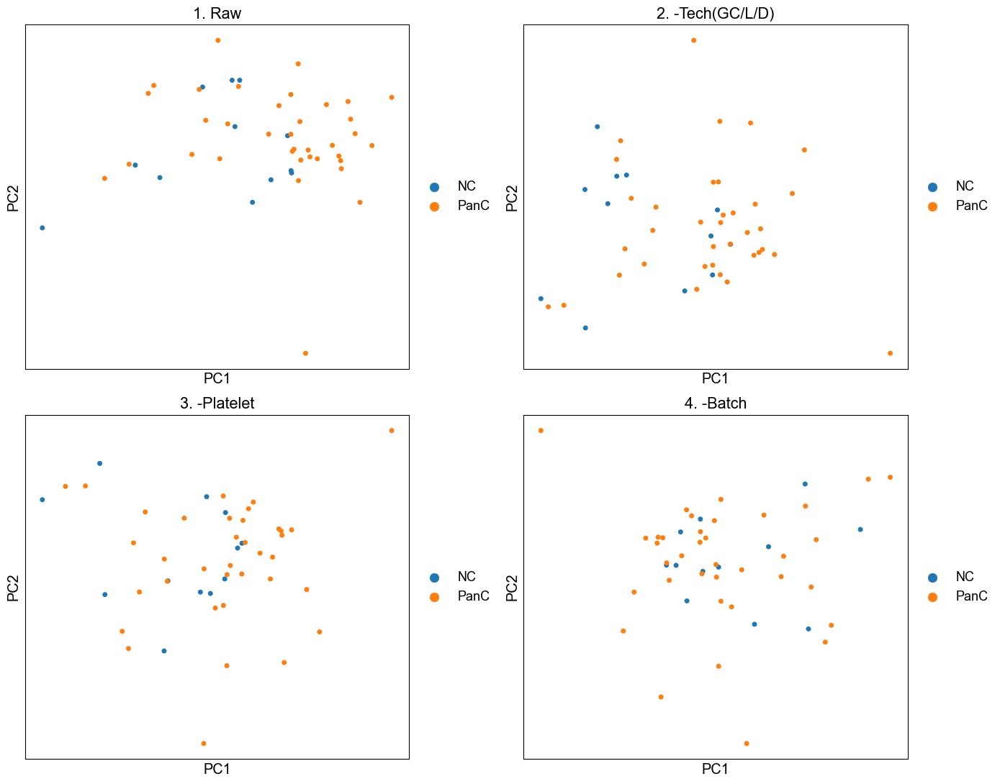

Displaying Metric Evolution (Spearman/ANOVA)...


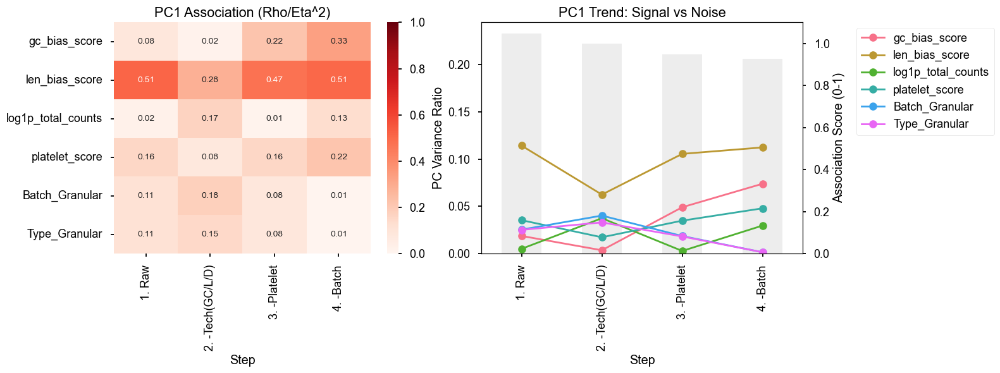


  >>> Analyzing Method: EDA+RUVg_k3
--- Set Layer: Switching to 'EDA+RUVg_k3' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


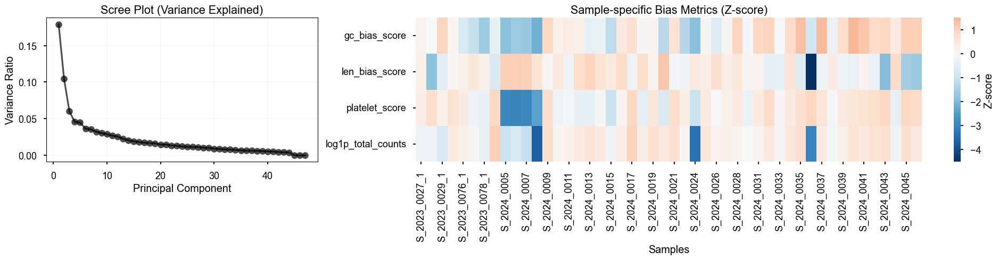

--- [Step 2-2] PCA Scatter Plots ---


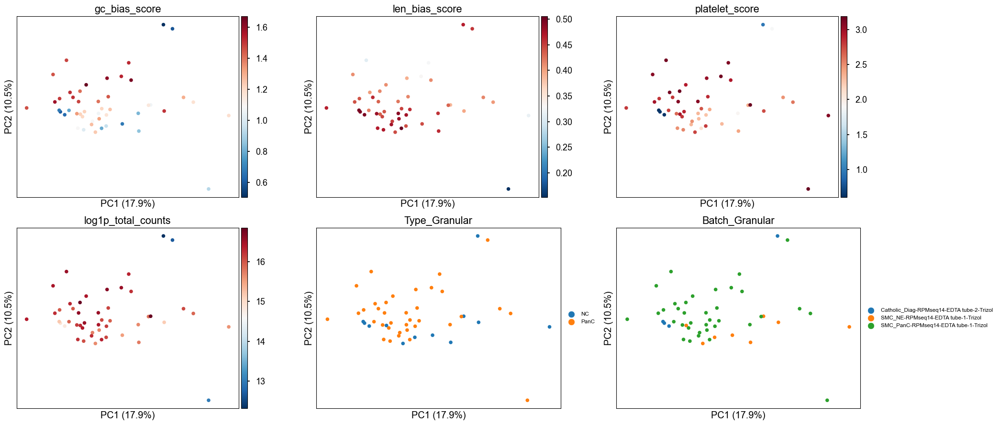

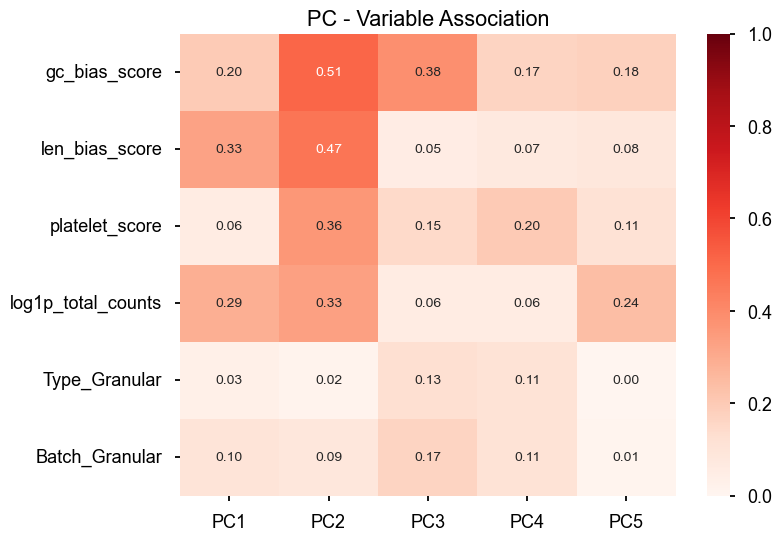

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 747 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


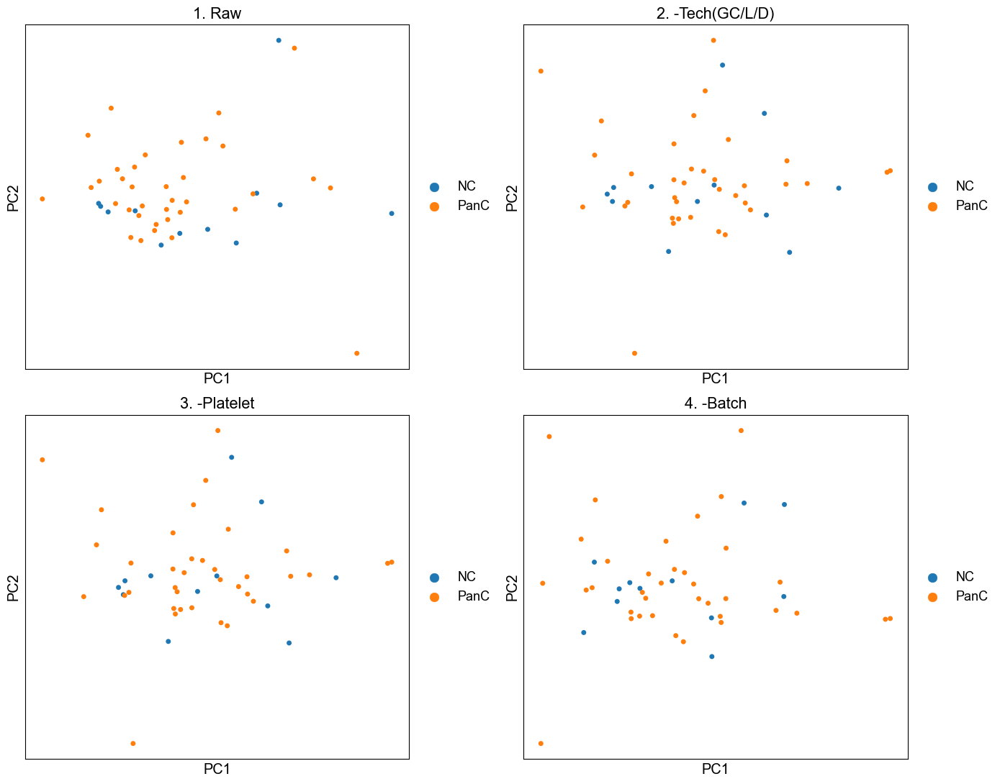

Displaying Metric Evolution (Spearman/ANOVA)...


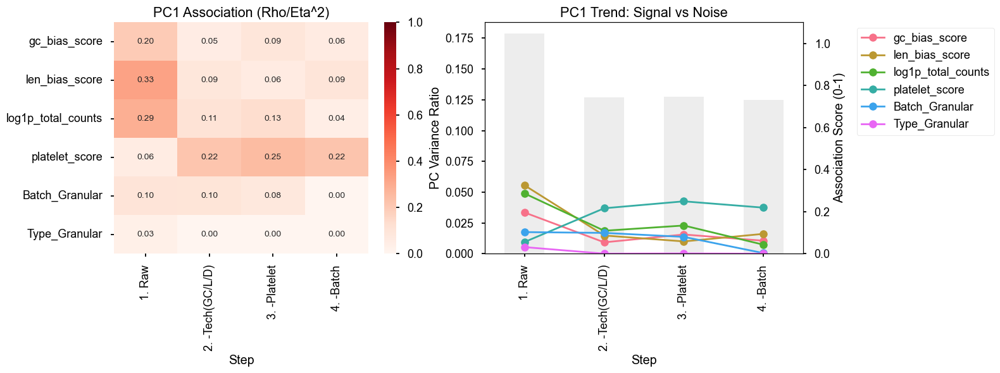


  >>> Analyzing Method: EDA_Full
--- Set Layer: Switching to 'EDA_Full' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


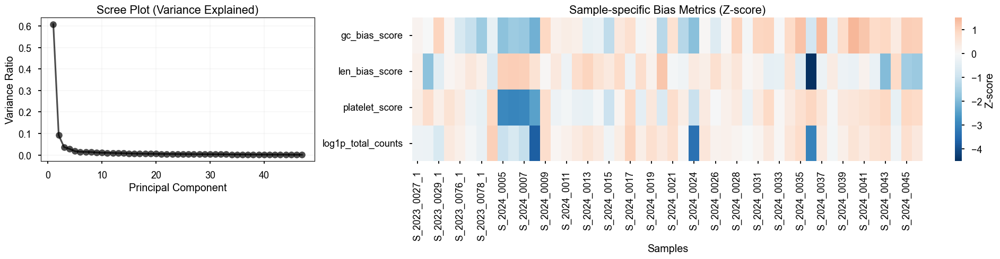

--- [Step 2-2] PCA Scatter Plots ---


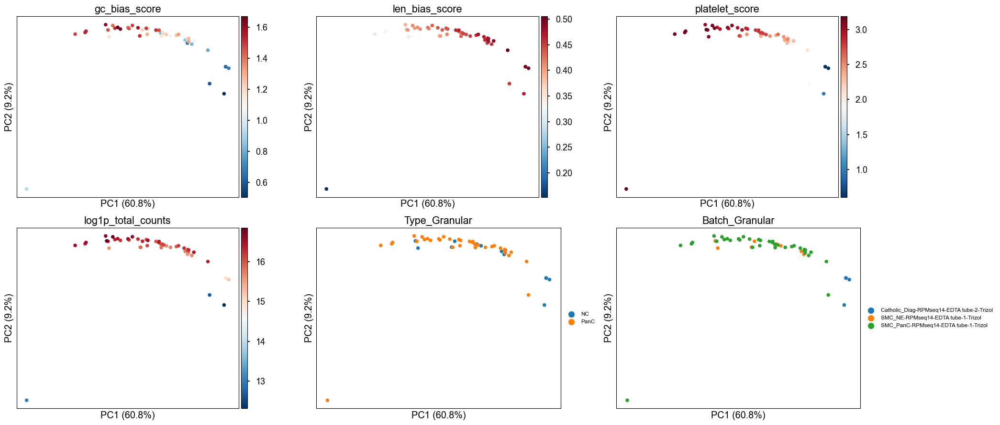

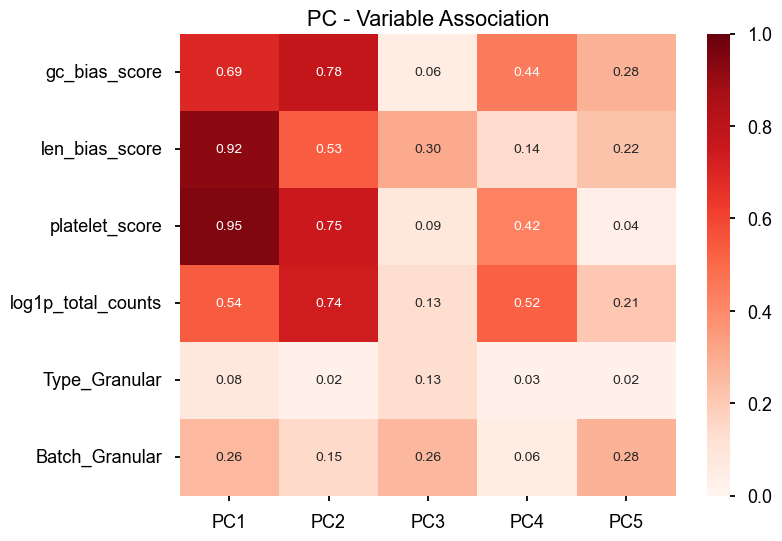

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 747 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


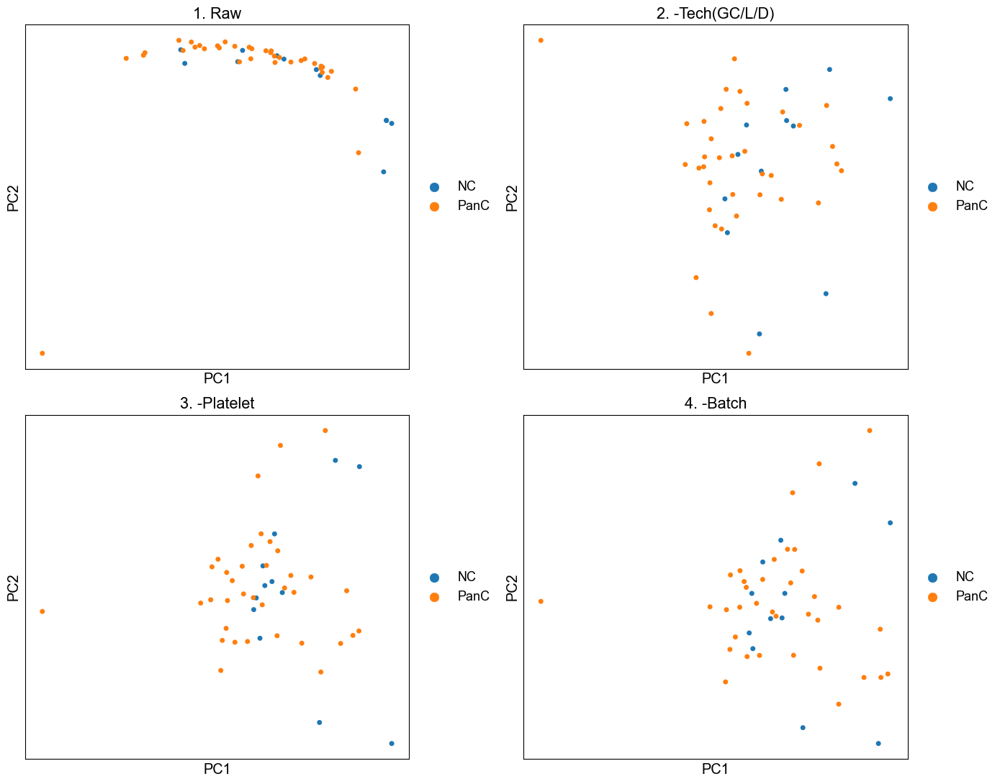

Displaying Metric Evolution (Spearman/ANOVA)...


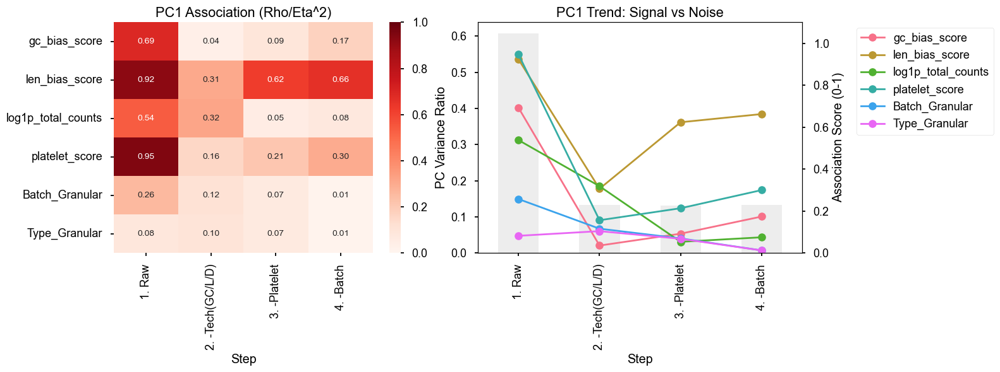


  >>> Analyzing Method: RUVg_k1
--- Set Layer: Switching to 'RUVg_k1' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


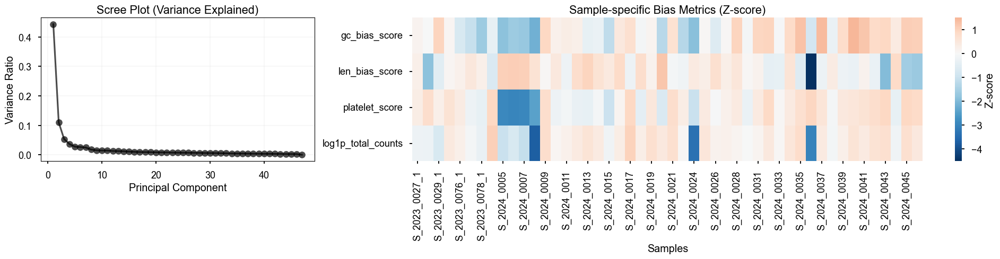

--- [Step 2-2] PCA Scatter Plots ---


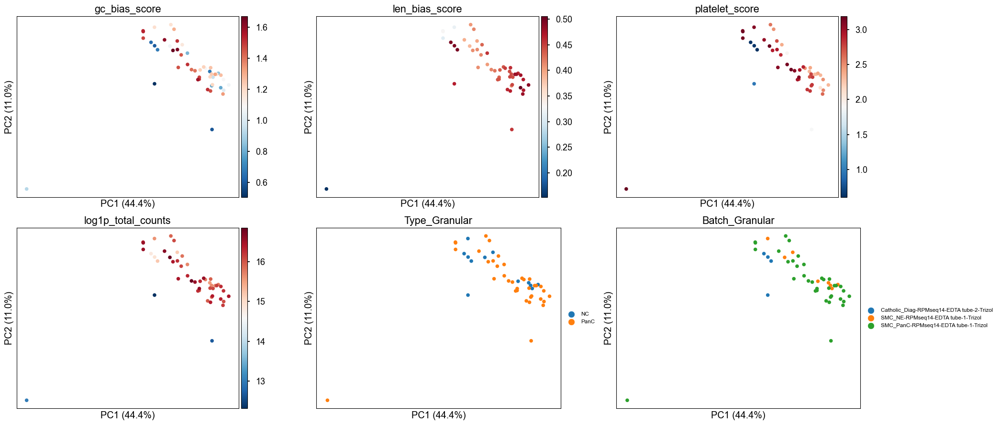

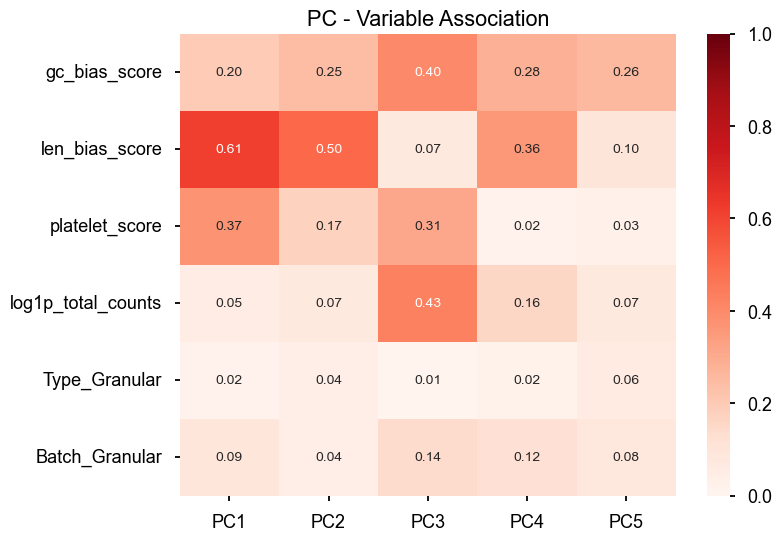

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


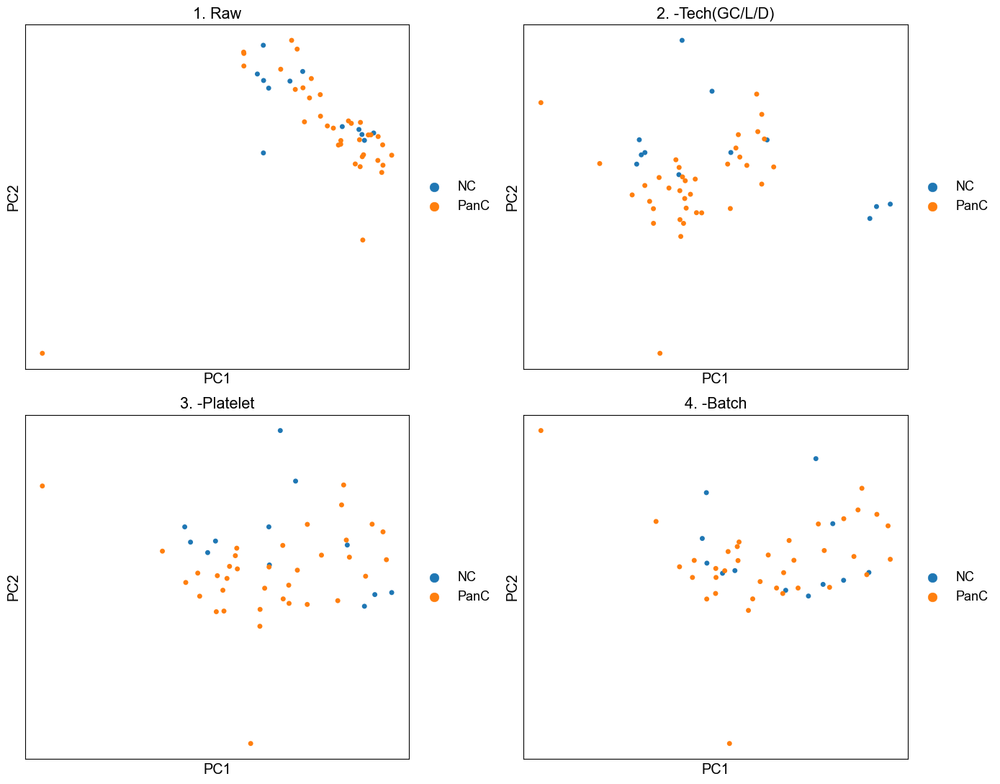

Displaying Metric Evolution (Spearman/ANOVA)...


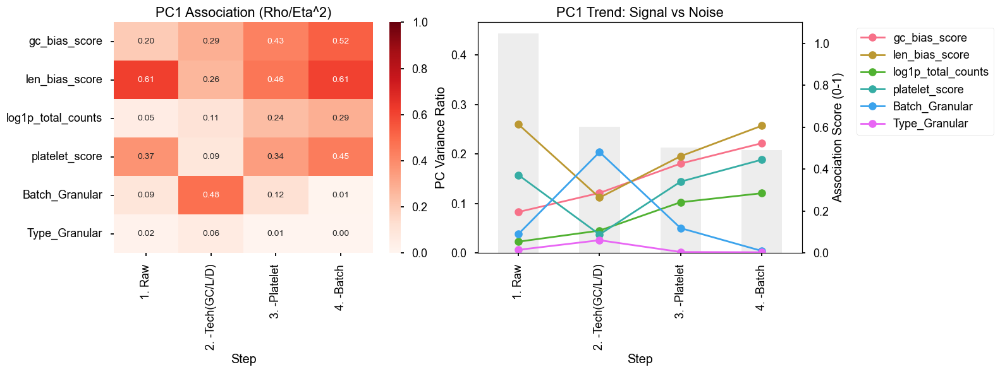


  >>> Analyzing Method: RUVg_k2
--- Set Layer: Switching to 'RUVg_k2' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


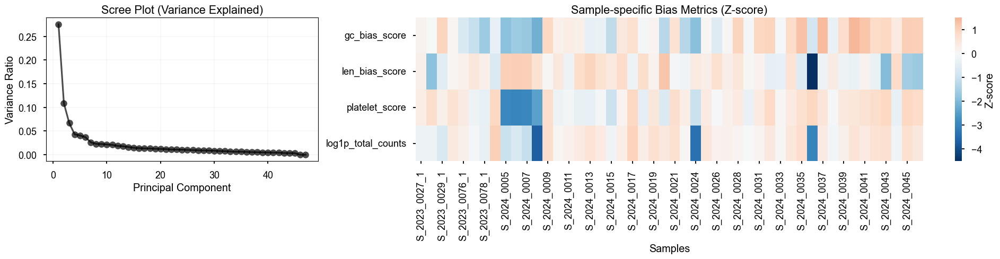

--- [Step 2-2] PCA Scatter Plots ---


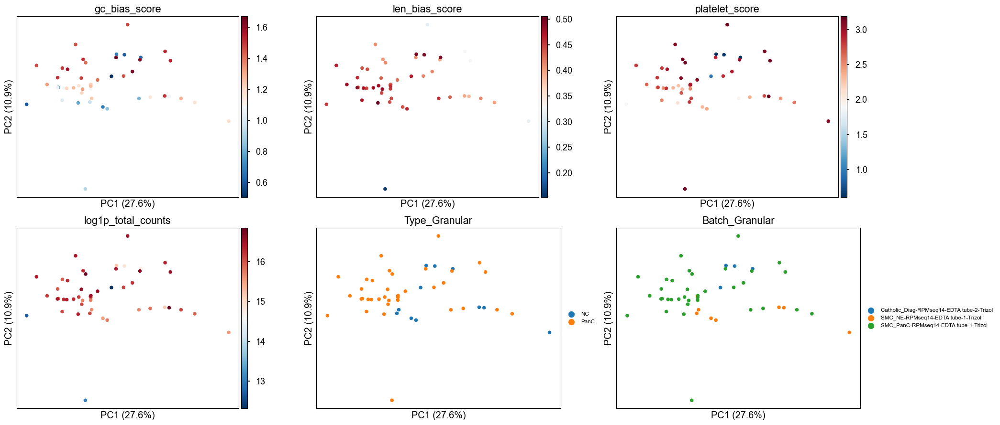

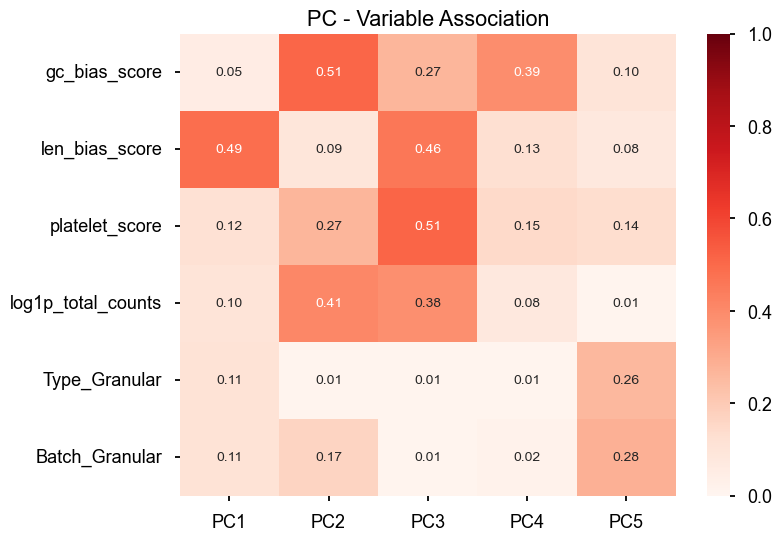

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


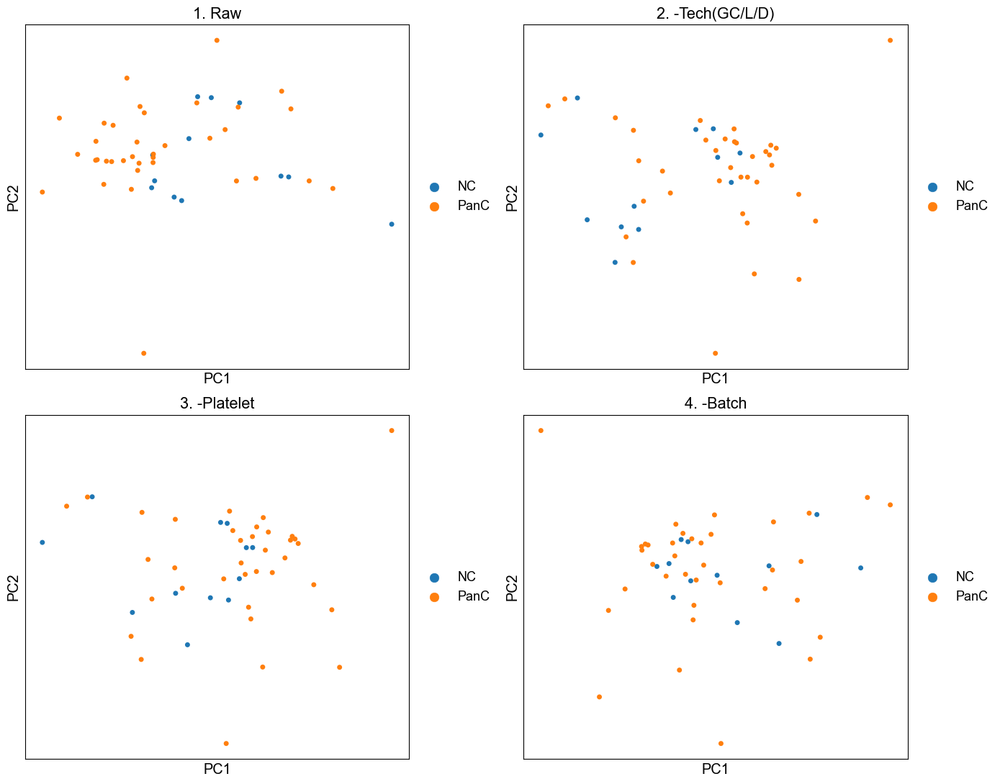

Displaying Metric Evolution (Spearman/ANOVA)...


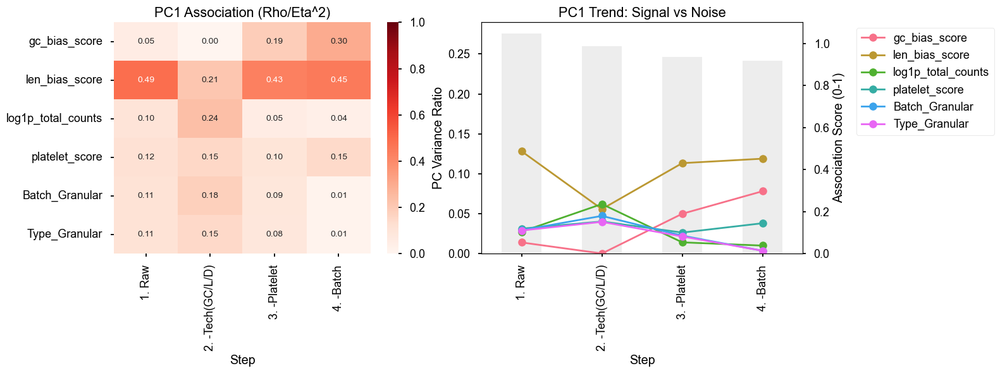


  >>> Analyzing Method: RUVg_k3
--- Set Layer: Switching to 'RUVg_k3' ---
PCA reset. Active layer is now ready for analysis.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


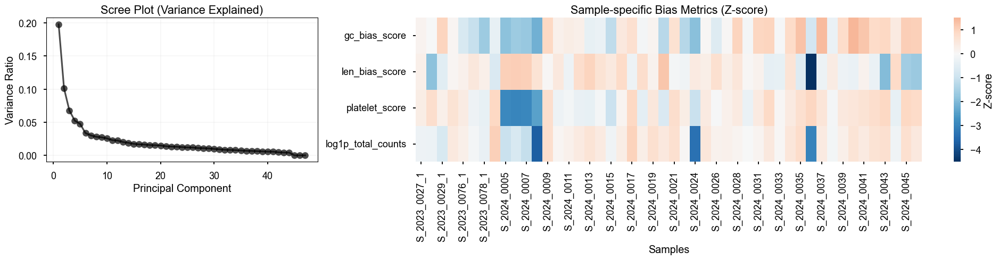

--- [Step 2-2] PCA Scatter Plots ---


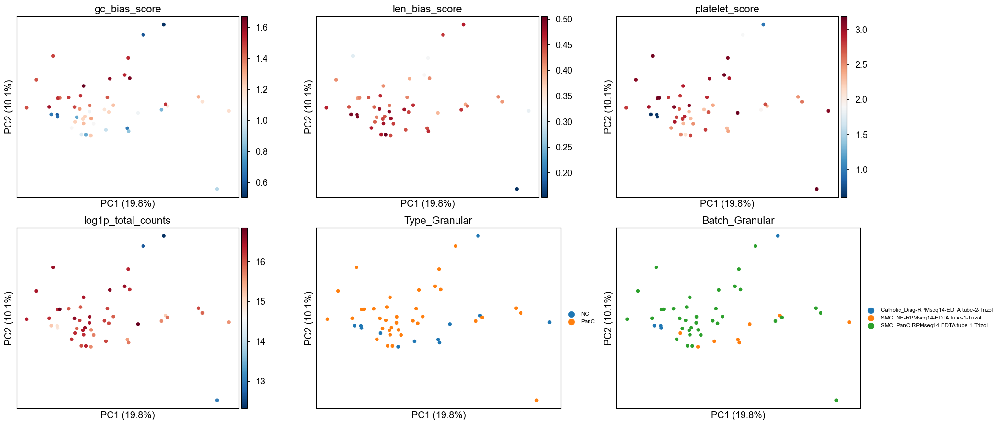

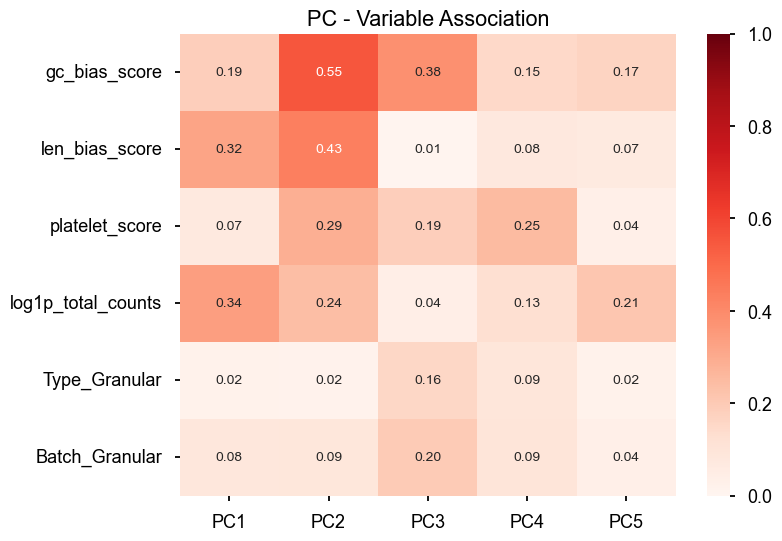

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['gc_bias_score', 'len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 738 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


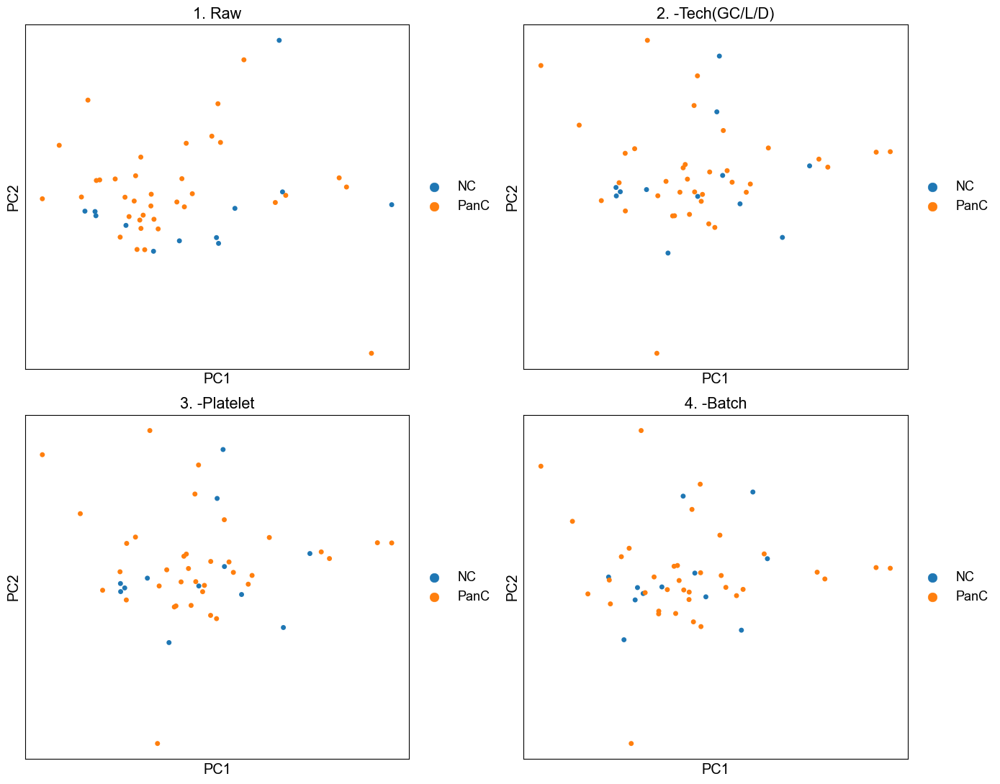

Displaying Metric Evolution (Spearman/ANOVA)...


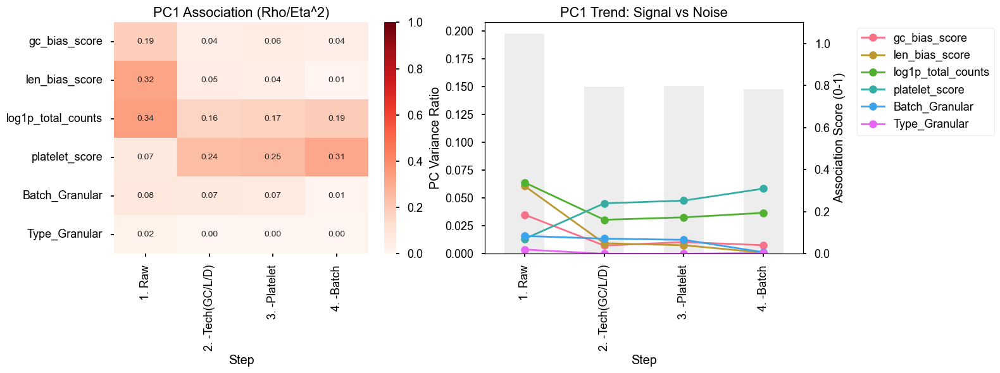


Benchmarking Complete.


In [3]:
pipeline = RNASeqQCPipeline(
    adata_sub, 
    gene_type_col='GeneType',       # 유전자 타입 컬럼
    target_types=['protein_coding'],# 분석 대상
    phenotype_col='Type_Granular',  # 주 관심사 (질병/정상 등)
    batch_col='Batch_Granular',     # 배치 정보
    gc_col='GC_Percent',            # 유전자 GC 함량
    len_col='Length',               # 유전자 길이
    platelet_col='is_platelet'      # 혈소판 마커 여부 컬럼
)

print(f"Start Benchmarking across {len(target_layers)} methods...\n")

for layer in target_layers:
    print(f"\n{'='*60}")
    print(f"  >>> Analyzing Method: {layer}")
    print(f"{'='*60}")
    pipeline.set_layer(layer)
    pipeline.run_pca_diagnostics()
    pipeline.analyze_pc_associations(n_pcs=5)
    pipeline.run_cascade_analysis(batch_method='combat')
    
print("\nBenchmarking Complete.")

In [106]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import linalg
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
import statsmodels.api as sm
from tqdm.notebook import tqdm
import warnings

warnings.filterwarnings('ignore')

# --- 데이터 준비 함수 (기존 동일) ---
def prepare_data(adata, layer=None, n_hvg=2000):
    tmp = adata.copy()
    if layer is not None and layer != 'X':
        tmp.X = tmp.layers[layer].copy()
    if hasattr(tmp.X, 'toarray'):
        tmp.X.data = np.nan_to_num(tmp.X.data, nan=0, posinf=0, neginf=0)
    else:
        tmp.X = np.nan_to_num(tmp.X, nan=0, posinf=0, neginf=0)
    sc.pp.filter_genes(tmp, min_cells=1)
    n_curr = tmp.n_vars
    actual_hvg = min(n_hvg, n_curr - 1)
    if actual_hvg > 50:
        sc.pp.highly_variable_genes(tmp, n_top_genes=actual_hvg, flavor='seurat')
        tmp = tmp[:, tmp.var['highly_variable']].copy()
    return tmp

# --- [1] 공분산 구조 (Color 인자 추가) ---
def analyze_covariance_structure(adata, bias_key, n_perms=30, ax=None, color='gray'):
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
    b_vals = pd.to_numeric(adata.obs[bias_key], errors='coerce').fillna(0)
    mask = b_vals <= np.median(b_vals)
    
    def get_dist(data_a, data_b):
        c1 = np.cov(StandardScaler().fit_transform(data_a), rowvar=False) + np.eye(data_a.shape[1])*1e-5
        c2 = np.cov(StandardScaler().fit_transform(data_b), rowvar=False) + np.eye(data_b.shape[1])*1e-5
        evals = linalg.eigvalsh(c1, c2)
        return np.sqrt(np.sum(np.log(np.maximum(evals, 1e-9))**2))
        
    if np.sum(mask) < 2 or np.sum(~mask) < 2: return 0.0, 1.0

    obs_dist = get_dist(X[mask], X[~mask])
    null_dists = []
    for _ in range(n_perms):
        idx = np.random.permutation(len(X))
        split = len(X) // 2
        null_dists.append(get_dist(X[idx[:split]], X[idx[split:]]))
    
    pval = (np.sum(np.array(null_dists) >= obs_dist) + 1) / (n_perms + 1)
    
    if ax:
        sns.histplot(null_dists, color=color, stat='density', kde=True, ax=ax, alpha=0.5)
        ax.axvline(obs_dist, color='red', linestyle='--', linewidth=2, label=f'Obs: {obs_dist:.2f}')
        ax.set_title(f"Covariance Dist (p={pval:.3f})")
        ax.legend(fontsize='small')
        ax.grid(alpha=0.1)

    return obs_dist, pval

# --- [2] 상호작용 왜곡 (Color 인자 추가) ---
def analyze_interaction_distortion(adata, bias_key, phenotype_key, ax=None, color='skyblue'):
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
    y = pd.factorize(adata.obs[phenotype_key])[0]
    b = pd.to_numeric(adata.obs[bias_key], errors='coerce').fillna(0).values
    design = sm.add_constant(np.column_stack([y, b, y * b]))
    
    p_values = []
    for i in range(X.shape[1]):
        try:
            est = sm.OLS(X[:, i], design).fit()
            p_values.append(est.pvalues[3])
        except: p_values.append(1.0)
            
    p_values = np.array(p_values)
    sig_ratio = np.mean(p_values < 0.05) * 100
    
    if ax:
        sns.histplot(p_values, bins=20, color=color, ax=ax, alpha=0.6)
        ax.axvline(0.05, color='red', linestyle='--', label='p=0.05', linewidth=2)
        ax.set_title(f"Interaction Sig Genes: {sig_ratio:.1f}%")
        ax.set_xlabel("P-value")
        ax.grid(alpha=0.1)

    return sig_ratio

# --- [3] 효과 안정성 (Color 인자 추가) ---
def analyze_effect_stability(adata, bias_key, phenotype_key, n_perms=30, ax=None, color='green'):
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
    b_raw = pd.to_numeric(adata.obs[bias_key], errors='coerce').fillna(0).values
    y = pd.factorize(adata.obs[phenotype_key])[0]
    def calc_score(bias_vals):
        try: 
            bins = pd.qcut(bias_vals, q=4, labels=False, duplicates='drop')
        except: return 0.0
        effects = []
        for k in np.unique(bins):
            m = (bins == k)
            # Phenotype의 두 그룹이 모두 존재해야 효과 벡터 계산 가능
            if np.sum(m & (y==1)) > 1 and np.sum(m & (y==0)) > 1:
                vec = np.mean(X[m & (y==1)], axis=0) - np.mean(X[m & (y==0)], axis=0)
                effects.append(vec)
        
        if len(effects) < 2: return np.nan
        sim = cosine_similarity(effects)
        return np.mean(sim[np.triu_indices(len(sim), k=1)])
    obs_score = calc_score(b_raw)
    null_scores = []
    for _ in range(n_perms):
        null_scores.append(calc_score(np.random.permutation(b_raw)))
    null_scores = np.array([s for s in null_scores if not np.isnan(s)])
    if len(null_scores) == 0 or np.isnan(obs_score):
        return np.nan, 1.0
    # obs가 null의 하위 분포에 속할수록(낮을수록) 유의미한 이질성 존재
    pval_hetero = (np.sum(null_scores <= obs_score) + 1) / (len(null_scores) + 1)
    if ax:
        sns.histplot(null_scores, color=color, stat='density', kde=True, ax=ax, alpha=0.5)
        ax.axvline(obs_score, color='red', linestyle='-', linewidth=2, label=f'Obs: {obs_score:.2f}')
        ax.set_title(f"Heterogeneity Test\n(Lower Score = More Distorted, p={pval_hetero:.3f})")
        ax.legend(fontsize='small', loc='upper left')
        
    return obs_score, pval_hetero

### PCA-Free per-gene effect

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import linalg
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
import statsmodels.api as sm
from tqdm.notebook import tqdm
import warnings

def prepare_data(adata, layer=None, n_hvg=2000):
    tmp = adata.copy()
    if layer is not None and layer != 'X':
        tmp.X = tmp.layers[layer].copy()
    if hasattr(tmp.X, 'toarray'):
        tmp.X.data = np.nan_to_num(tmp.X.data, nan=0, posinf=0, neginf=0)
    else:
        tmp.X = np.nan_to_num(tmp.X, nan=0, posinf=0, neginf=0)
    sc.pp.filter_genes(tmp, min_cells=1)
    n_curr = tmp.n_vars
    actual_hvg = min(n_hvg, n_curr - 1)
    if actual_hvg > 50:
        sc.pp.highly_variable_genes(tmp, n_top_genes=actual_hvg, flavor='seurat')
        tmp = tmp[:, tmp.var['highly_variable']].copy()
    return tmp

# --- [1] 공분산 구조 (Color 인자 추가) ---
def analyze_covariance_structure(adata, bias_key, n_perms=30, ax=None, color='gray'):
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
    b_vals = pd.to_numeric(adata.obs[bias_key], errors='coerce').fillna(0)
    mask = b_vals <= np.median(b_vals)
    
    def get_dist(data_a, data_b):
        c1 = np.cov(StandardScaler().fit_transform(data_a), rowvar=False) + np.eye(data_a.shape[1])*1e-5
        c2 = np.cov(StandardScaler().fit_transform(data_b), rowvar=False) + np.eye(data_b.shape[1])*1e-5
        evals = linalg.eigvalsh(c1, c2)
        return np.sqrt(np.sum(np.log(np.maximum(evals, 1e-9))**2))
        
    if np.sum(mask) < 2 or np.sum(~mask) < 2: return 0.0, 1.0

    obs_dist = get_dist(X[mask], X[~mask])
    null_dists = []
    for _ in range(n_perms):
        idx = np.random.permutation(len(X))
        split = len(X) // 2
        null_dists.append(get_dist(X[idx[:split]], X[idx[split:]]))
    
    pval = (np.sum(np.array(null_dists) >= obs_dist) + 1) / (n_perms + 1)
    
    if ax:
        sns.histplot(null_dists, color=color, stat='density', kde=True, ax=ax, alpha=0.5)
        ax.axvline(obs_dist, color='red', linestyle='--', linewidth=2, label=f'Obs: {obs_dist:.2f}')
        ax.set_title(f"Covariance Dist (p={pval:.3f})")
        ax.legend(fontsize='small')
        ax.grid(alpha=0.1)

    return obs_dist, pval

# --- [2] 상호작용 왜곡 (Color 인자 추가) ---
def analyze_interaction_distortion(adata, bias_key, phenotype_key, ax=None, color='skyblue'):
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
    y = pd.factorize(adata.obs[phenotype_key])[0]
    b = pd.to_numeric(adata.obs[bias_key], errors='coerce').fillna(0).values
    design = sm.add_constant(np.column_stack([y, b, y * b]))
    
    p_values = []
    for i in range(X.shape[1]):
        try:
            est = sm.OLS(X[:, i], design).fit()
            p_values.append(est.pvalues[3])
        except: p_values.append(1.0)
            
    p_values = np.array(p_values)
    sig_ratio = np.mean(p_values < 0.05) * 100
    
    if ax:
        sns.histplot(p_values, bins=20, color=color, ax=ax, alpha=0.6)
        ax.axvline(0.05, color='red', linestyle='--', label='p=0.05', linewidth=2)
        ax.set_title(f"Interaction Sig Genes: {sig_ratio:.1f}%")
        ax.set_xlabel("P-value")
        ax.grid(alpha=0.1)

    return sig_ratio

# --- [3] 효과 안정성 (Color 인자 추가) ---
def analyze_effect_stability(adata, bias_key, phenotype_key, n_perms=30, ax=None, color='green'):
    X = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
    b_raw = pd.to_numeric(adata.obs[bias_key], errors='coerce').fillna(0).values
    y = pd.factorize(adata.obs[phenotype_key])[0]
    def calc_score(bias_vals):
        try: 
            bins = pd.qcut(bias_vals, q=4, labels=False, duplicates='drop')
        except: return 0.0
        effects = []
        for k in np.unique(bins):
            m = (bins == k)
            # Phenotype의 두 그룹이 모두 존재해야 효과 벡터 계산 가능
            if np.sum(m & (y==1)) > 1 and np.sum(m & (y==0)) > 1:
                vec = np.mean(X[m & (y==1)], axis=0) - np.mean(X[m & (y==0)], axis=0)
                effects.append(vec)
        
        if len(effects) < 2: return np.nan
        sim = cosine_similarity(effects)
        return np.mean(sim[np.triu_indices(len(sim), k=1)])
    obs_score = calc_score(b_raw)
    null_scores = []
    for _ in range(n_perms):
        null_scores.append(calc_score(np.random.permutation(b_raw)))
    null_scores = np.array([s for s in null_scores if not np.isnan(s)])
    if len(null_scores) == 0 or np.isnan(obs_score):
        return np.nan, 1.0
    # obs가 null의 하위 분포에 속할수록(낮을수록) 유의미한 이질성 존재
    pval_hetero = (np.sum(null_scores <= obs_score) + 1) / (len(null_scores) + 1)
    if ax:
        sns.histplot(null_scores, color=color, stat='density', kde=True, ax=ax, alpha=0.5)
        ax.axvline(obs_score, color='red', linestyle='-', linewidth=2, label=f'Obs: {obs_score:.2f}')
        ax.set_title(f"Heterogeneity Test\n(Lower Score = More Distorted, p={pval_hetero:.3f})")
        ax.legend(fontsize='small', loc='upper left')
        
    return obs_score, pval_hetero

In [4]:
adata = sc.read_h5ad("./Data/RPM/Processed/Merged.h5ad")
target_layers = [ 'Standard_LogCPM', 'log_TMM', 'log_TPM', 'log_FPKM', 'EDA+RUVg_k1', 'EDA+RUVg_k2', 'EDA+RUVg_k3', 'EDA_Full', 'RUVg_k1', 'RUVg_k2', 'RUVg_k3']
adata.obs['Type_Granular'][adata.obs['Type_Granular'].str.contains('NC')] = 'NC'
pipeline = RNASeqQCPipeline(
    adata, 
    gene_type_col='GeneType',       # 유전자 타입 컬럼
    target_types=['protein_coding'],# 분석 대상
    phenotype_col='Type_Granular',  # 주 관심사 (질병/정상 등)
    batch_col='Batch_Granular',     # 배치 정보
    gc_col='GC_Percent',            # 유전자 GC 함량
    len_col='Length',               # 유전자 길이
    platelet_col='is_platelet'      # 혈소판 마커 여부 컬럼
)

--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 20097 genes left.
Preparation Done.
--- Initializing: Using baseline layer 'Standard_LogCPM' for Bias Calculation ---
--- [Step] Calculating Bias Metrics ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores...
Bias Metrics Calculation Done.
--- Set Layer: Switching to 'Standard_LogCPM' ---
PCA reset. Active layer is now ready for analysis.


In [5]:
target_adata = pipeline.adata.copy()
adata_sub = target_adata[target_adata.obs['Seq_ID'] == 'RPMseq14', :].copy()

>>> Processing 11 Layers...
>>> Processing 11 Layers...


Layers:   0%|          | 0/11 [00:00<?, ?it/s]

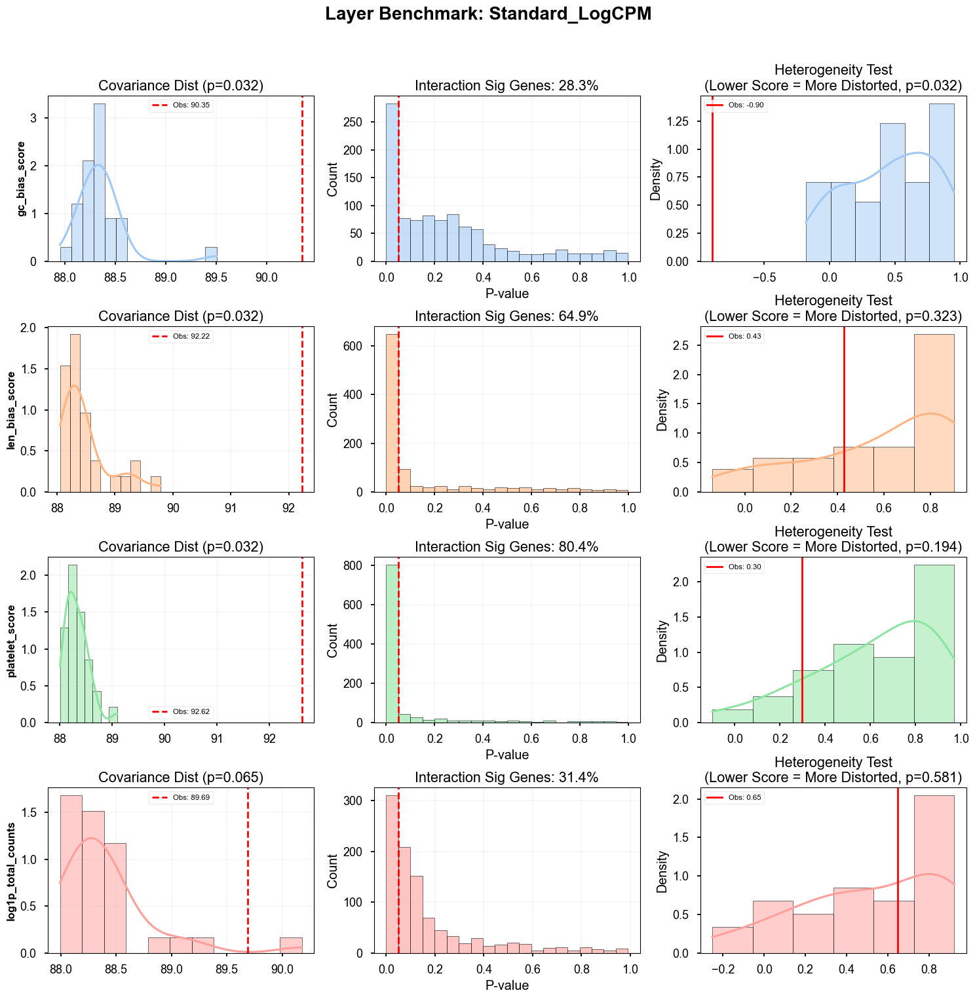

/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:307: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


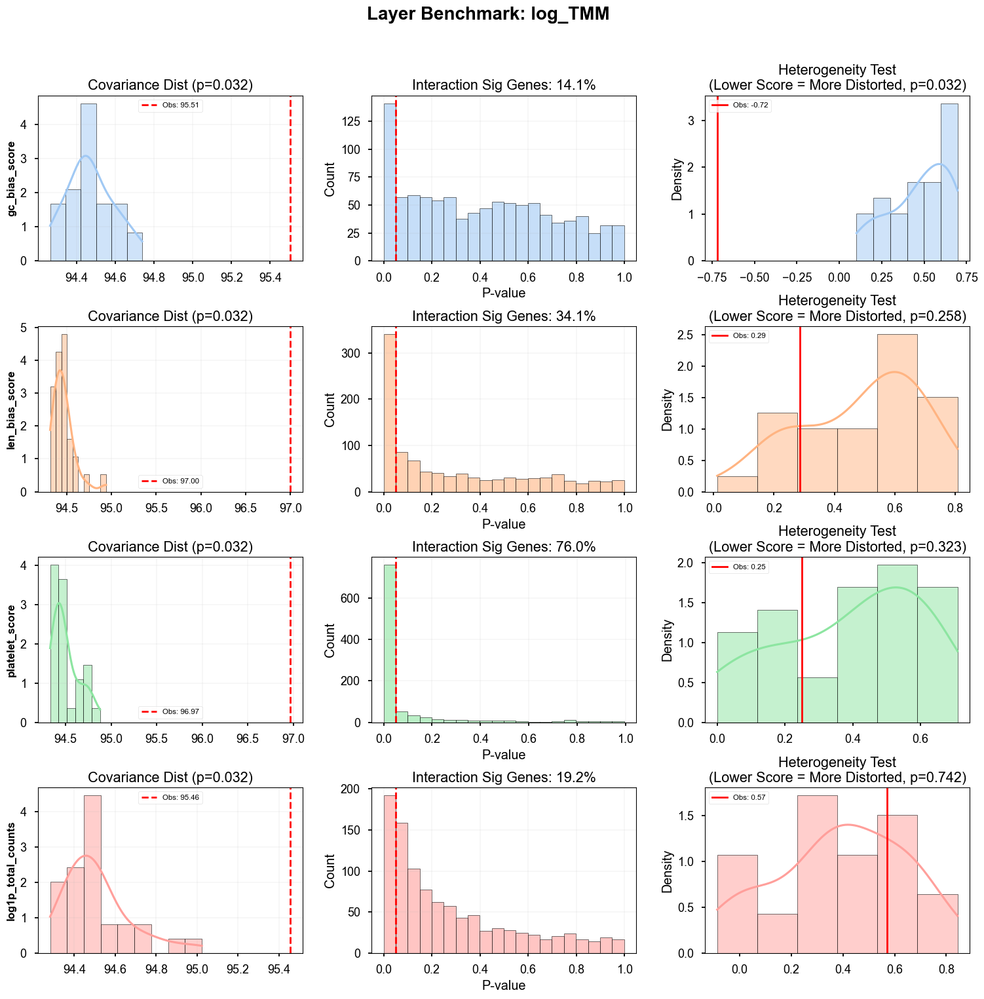

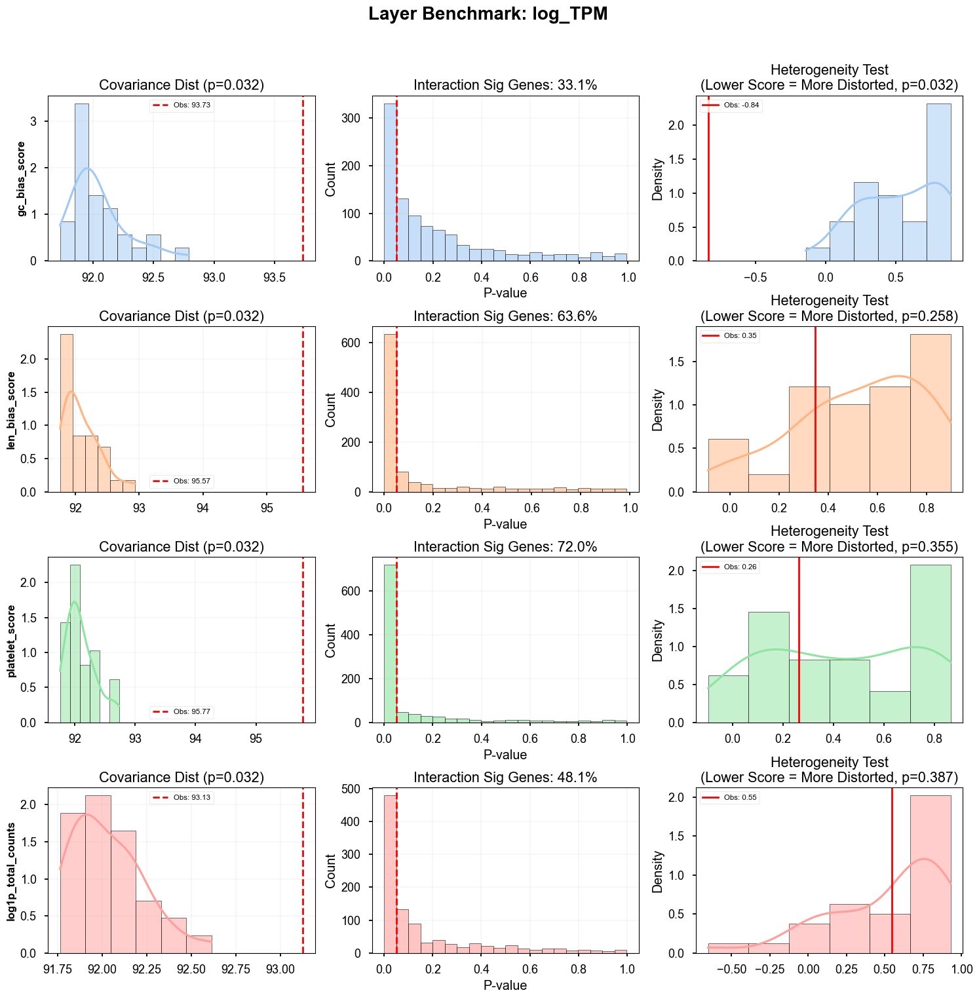

/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:307: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


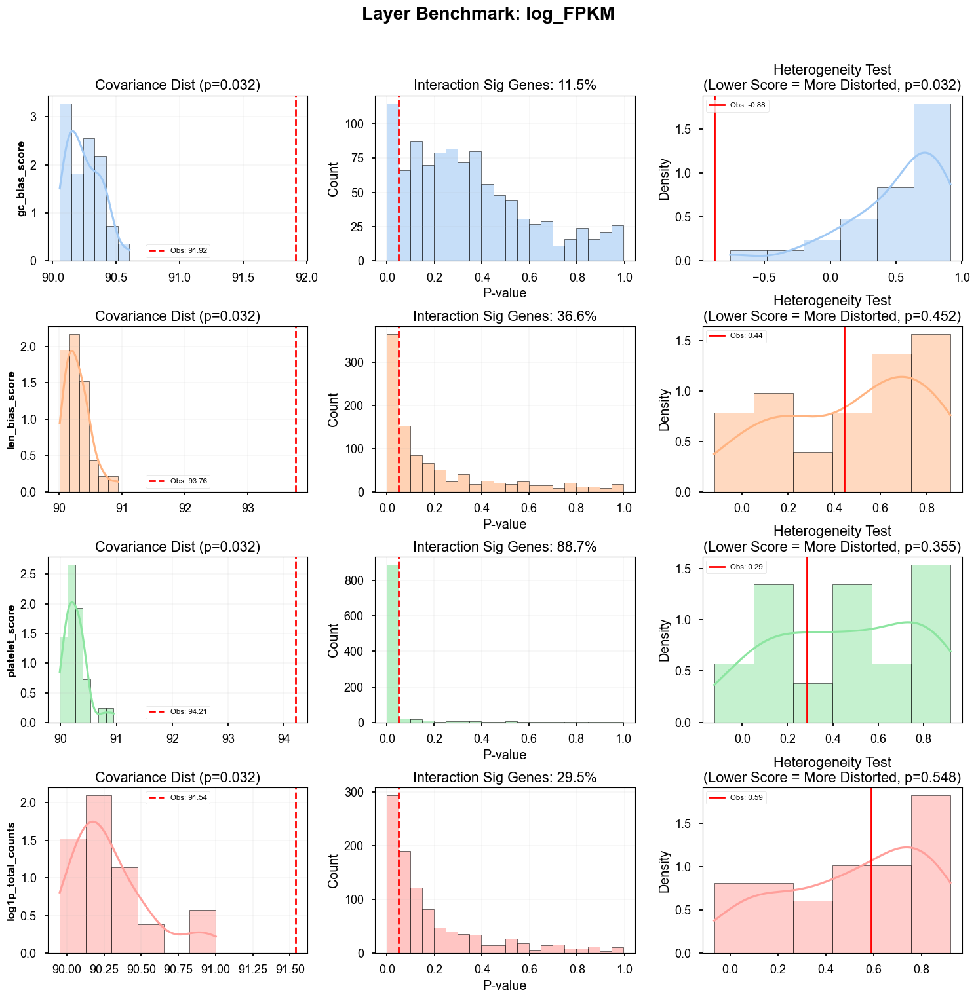

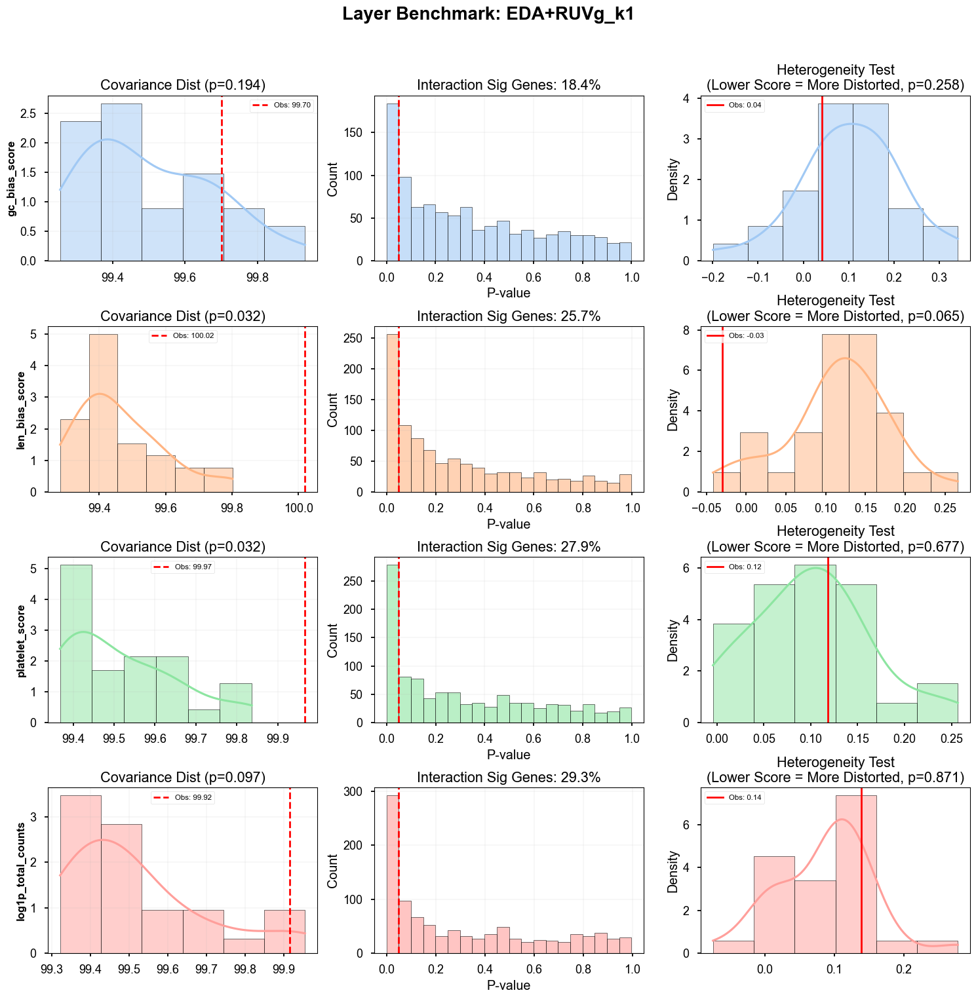

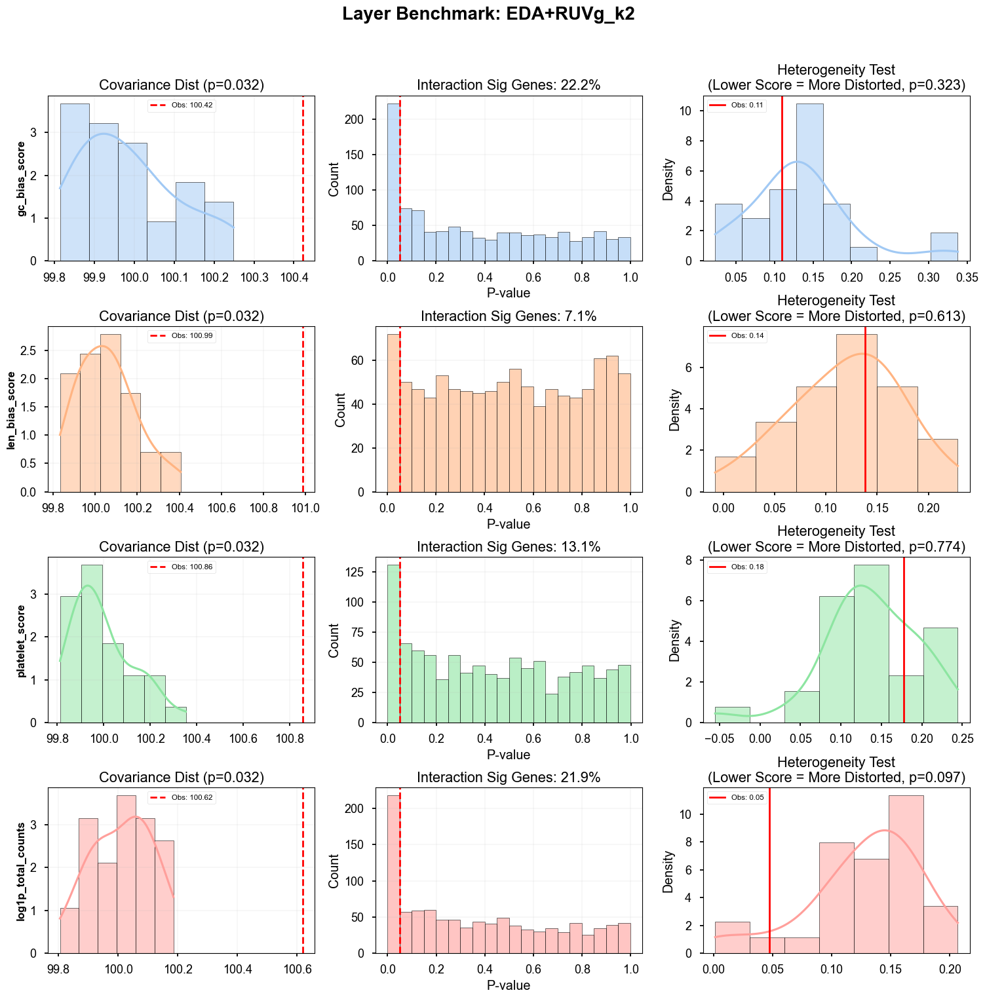

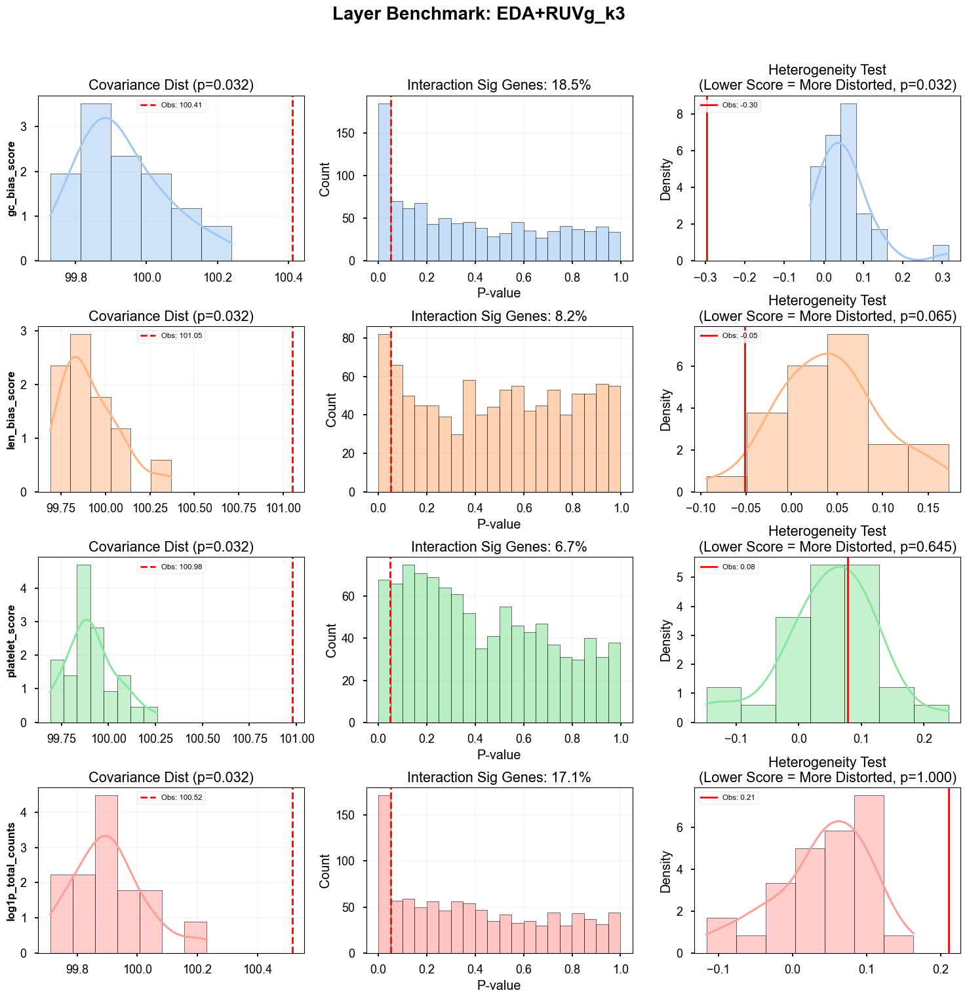

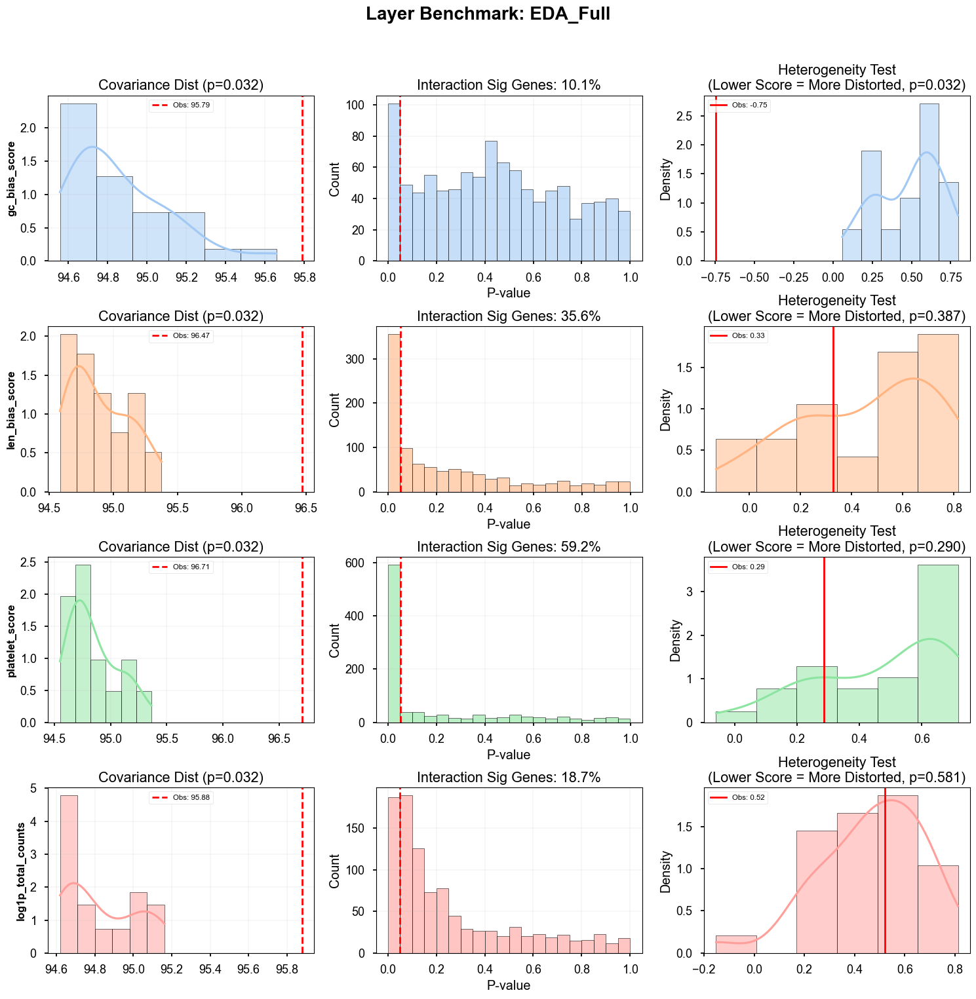

/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:307: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


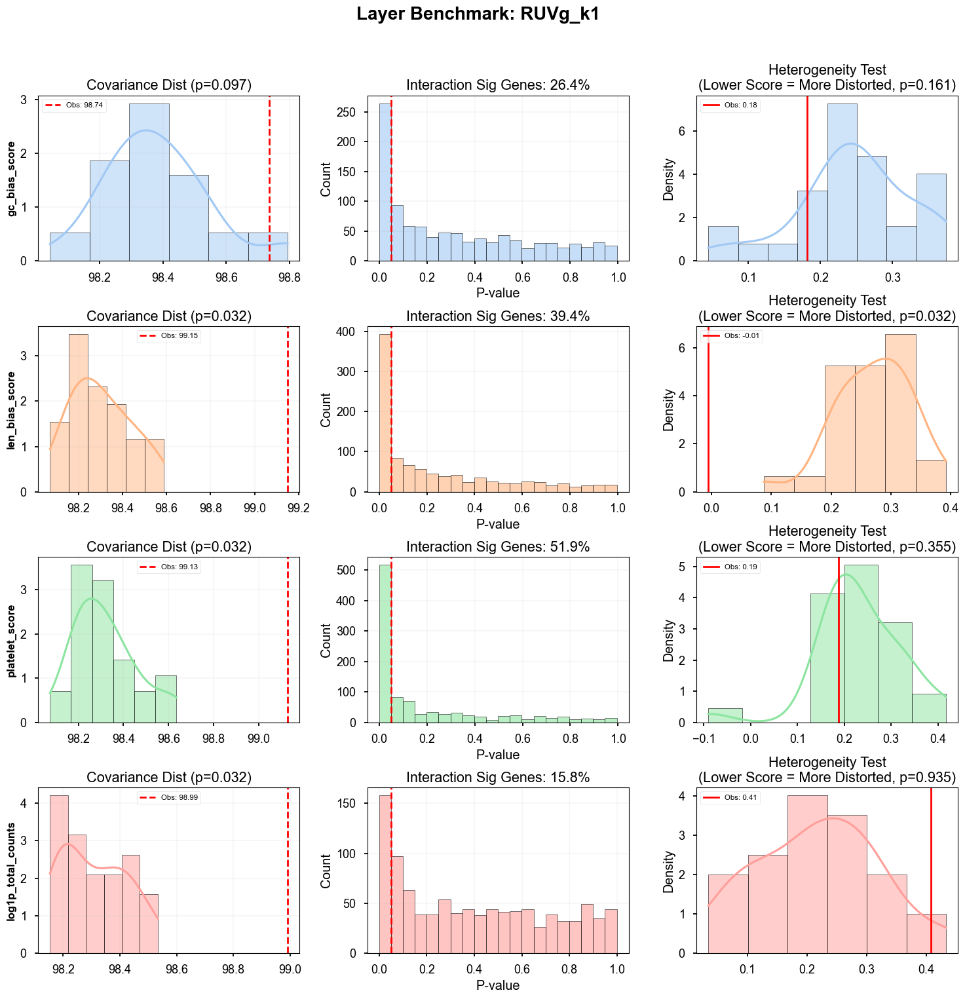

/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:307: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


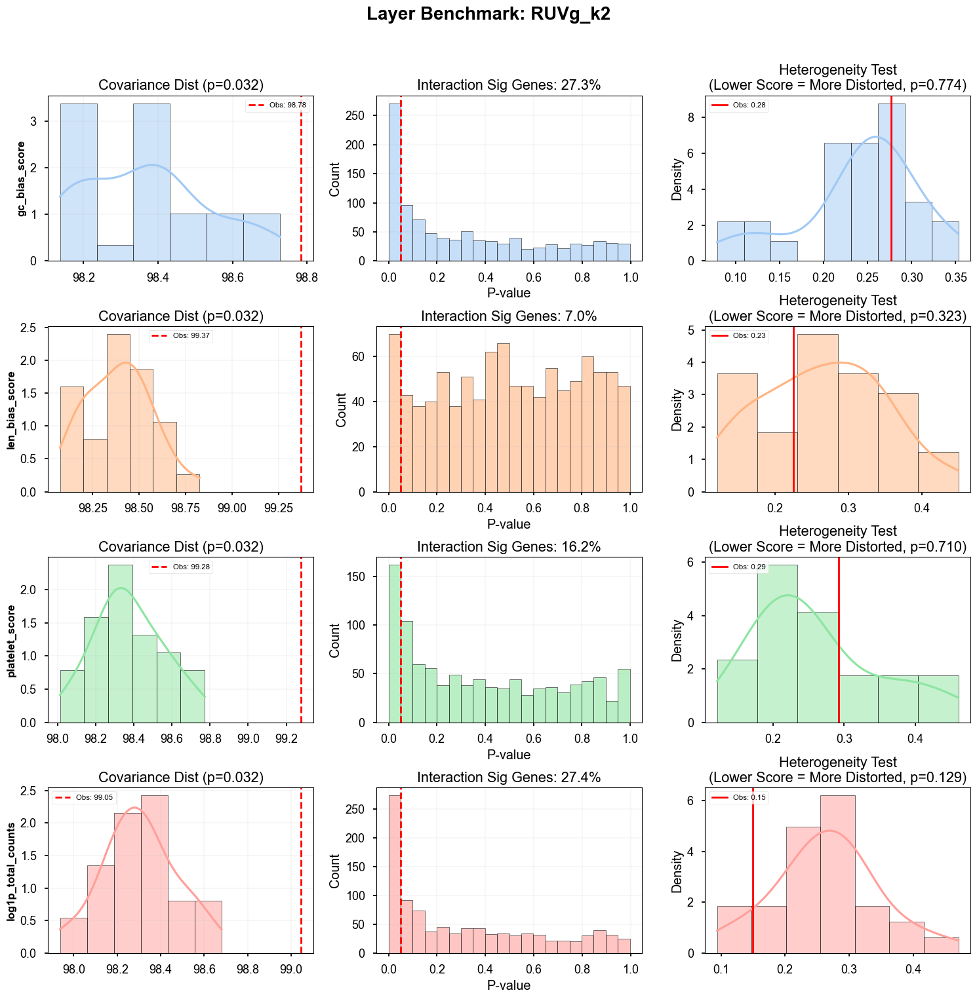

/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:307: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


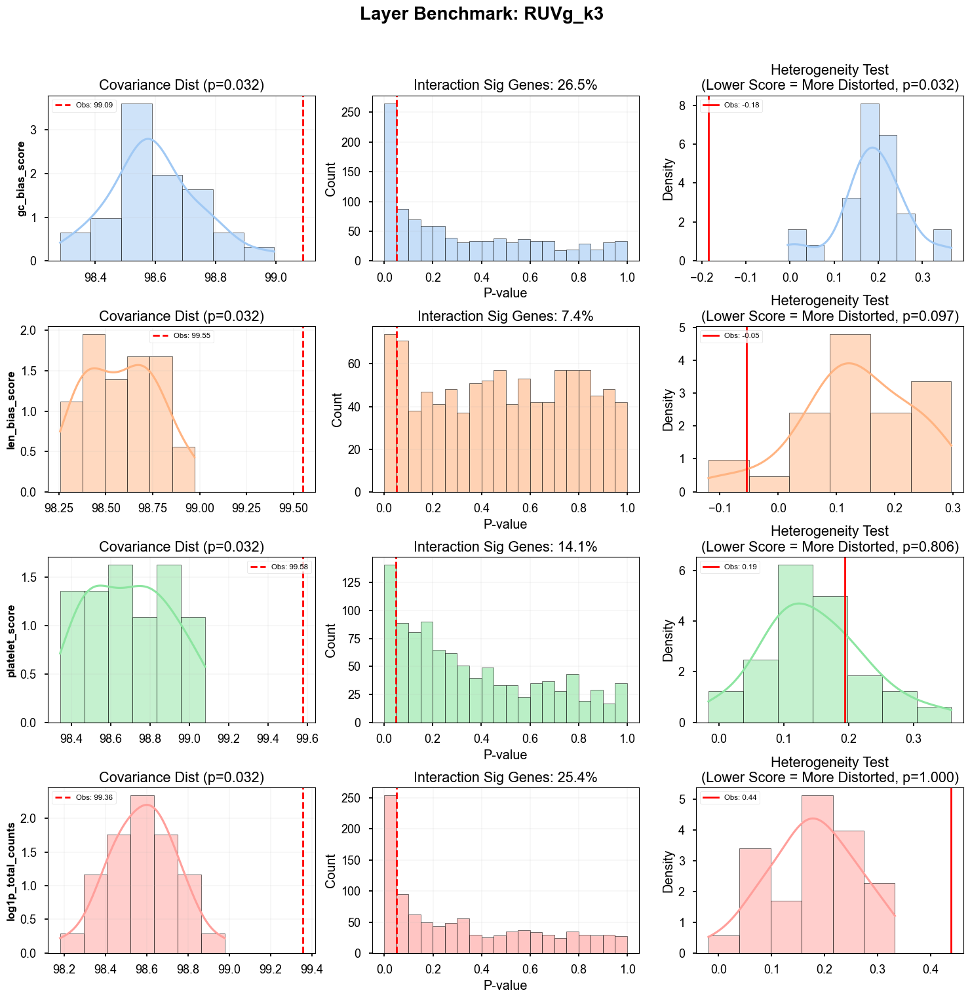


>>> Final Summary Head:
             Layer                Bias   Cov_Dist  Cov_Pval  Inter_Sig_Pct  \
0  Standard_LogCPM       gc_bias_score  90.350048  0.032258           28.3   
1  Standard_LogCPM      len_bias_score  92.224122  0.032258           64.9   
2  Standard_LogCPM      platelet_score  92.615146  0.032258           80.4   
3  Standard_LogCPM  log1p_total_counts  89.688346  0.064516           31.4   
4          log_TMM       gc_bias_score  95.505195  0.032258           14.1   

   Stab_Score  Stab_Pval  
0   -0.897077   0.032258  
1    0.426235   0.322581  
2    0.298668   0.193548  
3    0.646673   0.580645  
4   -0.719115   0.032258  


In [6]:
bias_list = pipeline.get_metric_keys()
bias_colors = sns.color_palette("pastel", n_colors=len(bias_list))
all_results = []
print(f">>> Processing {len(target_layers)} Layers...")

# ... (이전 초기화 코드는 동일) ...

print(f">>> Processing {len(target_layers)} Layers...")

for l_name in tqdm(target_layers, desc="Layers"):
    adata_ready = prepare_data(adata_sub, layer=l_name, n_hvg=1000)        
    
    fig, axes = plt.subplots(nrows=len(bias_list), ncols=3, figsize=(15, 4 * len(bias_list)))  
    fig.suptitle(f"Layer Benchmark: {l_name}", fontsize=20, fontweight='bold', y=0.95)
    
    for i, b_name in enumerate(bias_list):
        current_color = bias_colors[i]           
        # 1. Covariance Structure
        cov_obs, cov_pval = analyze_covariance_structure(
            adata_ready, b_name, n_perms=30, ax=axes[i, 0], color=current_color
        )
        axes[i, 0].set_ylabel(f"{b_name}", fontsize=12, fontweight='bold', color='black')
        
        # 2. Interaction Distortion
        inter_pct = analyze_interaction_distortion(
            adata_ready, b_name, 'Type', ax=axes[i, 1], color=current_color
        )
        
        # 3. Effect Stability
        stab_obs, stab_pval = analyze_effect_stability(
            adata_ready, b_name, 'Type', n_perms=30, ax=axes[i, 2], color=current_color
        )
        
        all_results.append({
            'Layer': l_name,
            'Bias': b_name,
            'Cov_Dist': cov_obs, 'Cov_Pval': cov_pval,
            'Inter_Sig_Pct': inter_pct,
            'Stab_Score': stab_obs, 'Stab_Pval': stab_pval
        })
            
    plt.tight_layout(rect=[0, 0, 1, 0.93]) 
    plt.show()

summary_df = pd.DataFrame(all_results)
print("\n>>> Final Summary Head:")
print(summary_df.head())

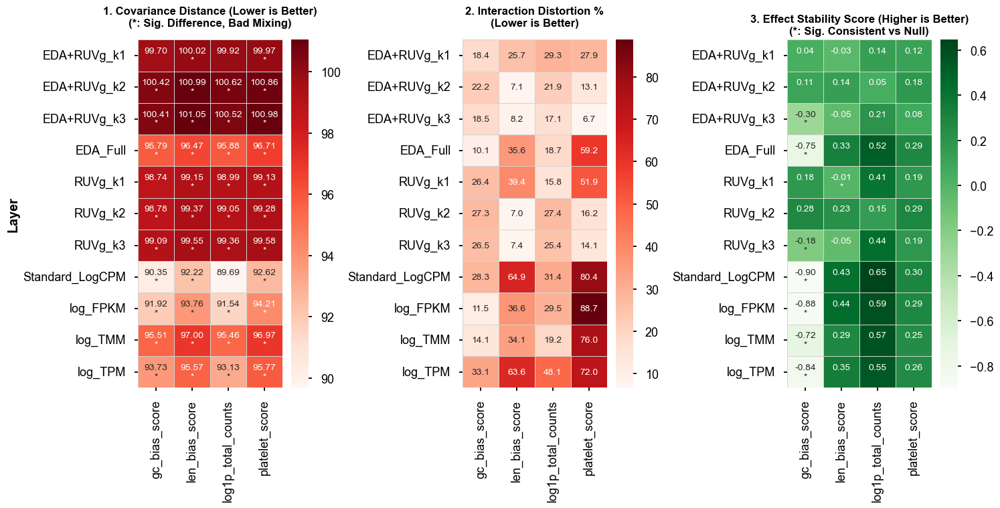

In [10]:
def plot_summary_heatmaps_with_stars(df):
    if df.empty:
        print("Dataframe is empty.")
        return

    # 캔버스 설정
    fig, axes = plt.subplots(1, 3, figsize=(15, max(4, len(df['Layer'].unique()) * 0.7)))
    plt.subplots_adjust(wspace=0.3)

    # --- Helper: Asterisk 포맷팅 함수 ---
    def get_star_annotation(val_df, pval_df):
        annot_df = pd.DataFrame(index=val_df.index, columns=val_df.columns)
        for r in val_df.index:
            for c in val_df.columns:
                val = val_df.loc[r, c]
                p = pval_df.loc[r, c]
                if pd.isna(val) or pd.isna(p):
                    annot_df.loc[r, c] = ""
                    continue
                if p < 0.001: star = "***"
                elif p < 0.01: star = "**"
                elif p < 0.05: star = "*"
                else: star = ""
                annot_df.loc[r, c] = f"{val:.2f}\n{star}"
        return annot_df

    # =========================================================
    # 1. Covariance Distance (P-value 반영)
    # =========================================================
    # Pivot
    cov_val = df.pivot(index='Layer', columns='Bias', values='Cov_Dist')
    cov_pval = df.pivot(index='Layer', columns='Bias', values='Cov_Pval')
    
    # Annotation Matrix 생성
    cov_annot = get_star_annotation(cov_val, cov_pval)
    sns.heatmap(cov_val, annot=cov_annot, fmt="", cmap='Reds', 
                linewidths=0.5, linecolor='lightgray', ax=axes[0])
    
    axes[0].set_title("1. Covariance Distance (Lower is Better)\n(*: Sig. Difference, Bad Mixing)", 
                      fontsize=12, fontweight='bold', pad=15)
    
    axes[0].set_ylabel("Layer", fontweight='bold')
    inter_val = df.pivot(index='Layer', columns='Bias', values='Inter_Sig_Pct')
    
    sns.heatmap(inter_val, annot=True, fmt=".1f", cmap='Reds', 
                linewidths=0.5, linecolor='lightgray', ax=axes[1])
    axes[1].set_title("2. Interaction Distortion %\n(Lower is Better)", 
                      fontsize=12, fontweight='bold', pad=15)
    axes[1].set_ylabel("") # 중복 제거
    stab_val = df.pivot(index='Layer', columns='Bias', values='Stab_Score')
    stab_pval = df.pivot(index='Layer', columns='Bias', values='Stab_Pval')
    
    # Annotation Matrix 생성
    stab_annot = get_star_annotation(stab_val, stab_pval)
    
    sns.heatmap(stab_val, annot=stab_annot, fmt="", cmap='Greens', 
                linewidths=0.5, linecolor='lightgray', ax=axes[2])
    axes[2].set_title("3. Effect Stability Score (Higher is Better)\n(*: Sig. Consistent vs Null)", 
                      fontsize=12, fontweight='bold')
    axes[2].set_ylabel("")

    # 공통 설정
    for ax in axes:
        ax.tick_params(axis='x', rotation=90)
        ax.set_xlabel("")
    plt.tight_layout()
    plt.show()

# --- 실행 ---
plot_summary_heatmaps_with_stars(summary_df)